# Load the data

In [97]:
#Processing
import pandas as pd
import numpy as np
from sklearn import model_selection
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA, TruncatedSVD, FastICA
from sklearn.model_selection import KFold, cross_val_score
from sklearn.random_projection import GaussianRandomProjection, SparseRandomProjection
from sklearn.preprocessing import normalize
from sklearn.manifold import TSNE
from sklearn.metrics import roc_auc_score

#Plotting
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import skew

In [290]:
train = pd.read_csv('data/challenge2_train.csv')
test = pd.read_csv('data/challenge2_test.csv')

# Data Exploration and Preparation

## 1. Variable Identification
First, we want to know what kind of data we are dealing with by identifying the variables.

In [99]:
print(train.columns)
print(test.columns)

Index(['id', 'target', 'f0', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8',
       'f9', 'f10', 'f11', 'f12', 'f13', 'f14', 'f15', 'f16', 'f17', 'f18',
       'f19', 'f20', 'f21', 'f22', 'f23', 'f24'],
      dtype='object')
Index(['id', 'f0', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9', 'f10',
       'f11', 'f12', 'f13', 'f14', 'f15', 'f16', 'f17', 'f18', 'f19', 'f20',
       'f21', 'f22', 'f23', 'f24'],
      dtype='object')


In [100]:
print('Size of training data: ', train.shape)
print('Size of test data: ', test.shape)

Size of training data:  (50000, 27)
Size of test data:  (50000, 26)


We have 25 features available as input to make a prediction, and 50 000 instances in both training and test set. We also have a target class in the training data, and IDs for every instance in the data.

In [101]:
train.info()
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 27 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   id      50000 non-null  int64  
 1   target  50000 non-null  int64  
 2   f0      45122 non-null  float64
 3   f1      50000 non-null  int64  
 4   f2      48816 non-null  float64
 5   f3      49677 non-null  float64
 6   f4      46621 non-null  object 
 7   f5      26130 non-null  float64
 8   f6      46648 non-null  float64
 9   f7      49517 non-null  float64
 10  f8      48540 non-null  object 
 11  f9      49497 non-null  float64
 12  f10     28585 non-null  float64
 13  f11     49894 non-null  float64
 14  f12     48487 non-null  object 
 15  f13     49497 non-null  float64
 16  f14     29937 non-null  float64
 17  f15     49057 non-null  float64
 18  f16     49020 non-null  float64
 19  f17     48630 non-null  object 
 20  f18     48749 non-null  float64
 21  f19     45121 non-null  float64
 22

In [102]:
train.head()

,id,target,f0,f1,f2,f3,f4,f5,f6,f7,...,f15,f16,f17,f18,f19,f20,f21,f22,f23,f24
0,0,0,1013.1,0,5.0190,26.1,bbd,11.1,33.0,11.0,...,19.0,27.8,bbd,6.0,1008.9,1.0,nd,17.4,61.0,63.0
1,1,0,1010.2,1,5.0142,10.4,n,NaN,46.0,17.0,...,22.0,12.7,n,12.0,1012.4,5.0,nx,6.8,55.0,80.0
2,2,0,1014.4,2,5.0280,12.3,xnx,NaN,31.0,13.0,...,9.0,13.0,nnd,7.0,1016.1,NaN,nx,10.1,61.0,70.0
3,3,0,1019.2,3,5.0335,23.0,nx,11.6,41.0,9.0,...,17.0,32.3,nx,10.0,1016.6,1.0,dnd,14.4,NaN,40.0
4,4,0,1027.6,4,5.0129,7.3,d,7.3,28.0,15.0,...,13.0,13.7,dnd,7.0,1024.4,7.0,dbd,6.8,47.0,92.0


In [103]:
test.head()

,id,f0,f1,f2,f3,f4,f5,f6,f7,f8,...,f15,f16,f17,f18,f19,f20,f21,f22,f23,f24
0,50000,1024.4,15,5.0256,6.6,xbx,0.8,20.0,2.0,o,...,13.0,11.4,xbx,0.0,1023.3,8.0,b,5.1,62.0,88.0
1,50001,1029.0,3,5.0289,5.6,nx,9.0,28.0,0.0,h,...,15.0,14.6,nnx,9.0,1025.9,1.0,NaN,0.0,42.0,89.0
2,50002,1016.7,10,5.0081,22.3,d,NaN,31.0,6.0,k,...,22.0,33.1,d,2.0,1012.3,NaN,bd,14.0,37.0,70.0
3,50003,1009.3,33,5.0168,11.3,bd,NaN,31.0,11.0,a,...,9.0,15.8,dbd,7.0,1005.3,8.0,dnd,9.8,NaN,96.0
4,50004,1027.1,37,5.0205,12.6,bx,12.6,22.0,6.0,d,...,7.0,21.1,nx,7.0,1024.5,1.0,bd,3.0,NaN,69.0


In [104]:
print('Number of target classes:', train['target'].nunique())
train['target'].head(15)

Number of target classes: 2


0     0
1     0
2     0
3     0
4     0
5     0
6     1
7     1
8     0
9     0
10    0
11    0
12    0
13    0
14    1
Name: target, dtype: int64

So, the target class is a binary class, containing 0 or 1 values. I don't know what they represent, but the task is thus to predict whether the instances in the test data is either of class 0 or 1.

We also see that the data includes some integer types, some float types and some object types which contain string values. Thus we have both numeric and categorical values in the data. The integer values can potentially be counts - or categorical if the number of unique integer values are within a small range.

We want to figure out how many categories each of these features include. Let's take a better look at each feature.

## 2. Univariate Analysis

In [105]:
train.nunique(axis=0)

id        50000
target        2
f0          505
f1           49
f2          413
f3          421
f4           16
f5          143
f6           62
f7           41
f8           15
f9            2
f10         278
f11         478
f12        1206
f13         486
f14          10
f15          41
f16         476
f17          16
f18          14
f19         495
f20          10
f21          16
f22         372
f23          30
f24         100
dtype: int64

In [106]:
test.nunique(axis=0)

id     50000
f0       508
f1        49
f2       412
f3       418
f4        16
f5       145
f6        64
f7        39
f8        15
f9         2
f10      271
f11      478
f12     1211
f13      475
f14        9
f15       40
f16      474
f17       16
f18       14
f19      506
f20        9
f21       16
f22      367
f23       30
f24      101
dtype: int64

In [107]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 27 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   id      50000 non-null  int64  
 1   target  50000 non-null  int64  
 2   f0      45122 non-null  float64
 3   f1      50000 non-null  int64  
 4   f2      48816 non-null  float64
 5   f3      49677 non-null  float64
 6   f4      46621 non-null  object 
 7   f5      26130 non-null  float64
 8   f6      46648 non-null  float64
 9   f7      49517 non-null  float64
 10  f8      48540 non-null  object 
 11  f9      49497 non-null  float64
 12  f10     28585 non-null  float64
 13  f11     49894 non-null  float64
 14  f12     48487 non-null  object 
 15  f13     49497 non-null  float64
 16  f14     29937 non-null  float64
 17  f15     49057 non-null  float64
 18  f16     49020 non-null  float64
 19  f17     48630 non-null  object 
 20  f18     48749 non-null  float64
 21  f19     45121 non-null  float64
 22

Seems like most of the categorical values have 16 unique categories, but f8 has 15 and f12 has 1206. Also worth noting that some of the integer types include only 10 unique values in the training data - but 9 in the test data. These could be categorical values with unseen values in the test data.

In [108]:
train['f12'].head()

0    be42001f3
1    3aad93cab
2    90116a97d
3    dc4ee566b
4    f09cc205f
Name: f12, dtype: object

In [109]:
train['f9'].head()

0    0.0
1    0.0
2    1.0
3    0.0
4    1.0
Name: f9, dtype: float64

The `f12` feature is hex values - and as it includes over 1200 unique values we can treat these as continuous values and convert them to float. It is also worth noting that f9 values are binary so this feature represents a variable which is either true or false.

In [110]:
# Define which columns include categorical data
cat_cols = ['f4', 'f8', 'f17', 'f21']

# Columns containing hex values
hex_col = 'f12'

bin_col = 'f9'

Let's convert the hex values to float values, and handle the categorical data later.

In [111]:
train['f12_dec'] = train['f12'].dropna().astype(str).apply(lambda x: int(x, 16))
test['f12_dec'] = test['f12'].dropna().astype(str).apply(lambda x: int(x, 16))

We will drop the hex values later.

### Missing values of features

In [112]:
train.isnull().sum()

id             0
target         0
f0          4878
f1             0
f2          1184
f3           323
f4          3379
f5         23870
f6          3352
f7           483
f8          1460
f9           503
f10        21415
f11          106
f12         1513
f13          503
f14        20063
f15          943
f16          980
f17         1370
f18         1251
f19         4879
f20        18755
f21         3584
f22          254
f23        24840
f24          602
f12_dec     1513
dtype: int64

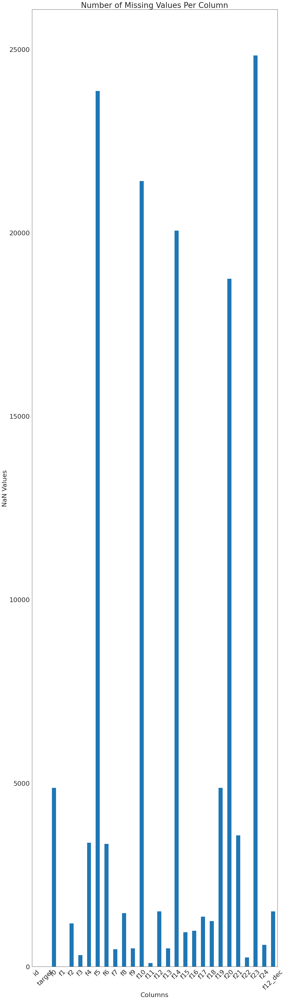

In [113]:
# plot missing data:
train.isnull().sum().plot(kind='bar')
# Add a title and show the plot.
plt.title('Number of Missing Values Per Column')
# Create tick mark labels on the Y axis and rotate them.
plt.xticks(rotation = 45)
# Create X axis label.
plt.xlabel("Columns")
# Create Y axis label.
plt.ylabel("NaN Values");

5 of the features have many missing values. We will look at how to impute these later.

### Target balance

Class 0: 38734
Class 1: 11266
Proportion: 3.44 : 1
Percentage Class 0: 77 %
Percentage Class 1: 23 %


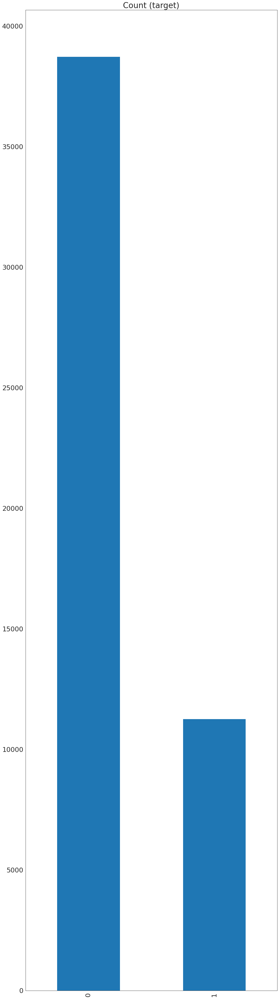

In [114]:
target_count = train.target.value_counts()
print('Class 0:', target_count[0])
print('Class 1:', target_count[1])
print('Proportion:', round(target_count[0] / target_count[1], 2), ': 1')
print('Percentage Class 0:', round(target_count[0]/train.shape[0]*100), '%')
print('Percentage Class 1:', round(target_count[1]/train.shape[0]*100), '%')

target_count.plot(kind='bar', title='Count (target)');

As we can see, the dataset is imbalanced with 77% of the instances being of class 0. This means that if the classifier predicted class 0 for all instances during validation, it would get an accuracy of 77 %.

### Finding duplicate rows

In [115]:
train.duplicated().apply(lambda x: x is True).sum()

0

No duplicated values! That is good, because the classifier can become biased bu duplicated data. There could still be correlated features, though.

### Statistical analysis

In [116]:
train.describe()

,id,target,f0,f1,f2,f3,f5,f6,f7,f9,...,f14,f15,f16,f18,f19,f20,f22,f23,f24,f12_dec
count,50000.000000,50000.000000,45122.000000,50000.00000,48816.000000,49677.000000,26130.000000,46648.000000,49517.000000,49497.000000,...,29937.000000,49057.000000,49020.000000,48749.000000,45121.000000,31245.000000,49746.000000,25160.000000,49398.000000,4.848700e+04
mean,24999.500000,0.225320,1017.678647,23.49612,5.018887,16.998782,7.628550,40.050999,14.000848,0.222862,...,4.508668,18.686630,21.683570,7.305524,1015.285913,4.428837,12.191203,52.013712,68.806470,3.394508e+10
std,14433.901067,0.417797,7.130390,14.01738,0.007177,6.520973,3.776794,13.655620,8.936280,0.416171,...,2.717503,8.842879,6.970918,3.546719,7.057875,2.884968,6.414481,8.323467,19.024988,1.986950e+10
min,0.000000,0.000000,982.000000,0.00000,4.998000,-6.200000,0.000000,7.000000,0.000000,0.000000,...,0.000000,0.000000,-5.100000,0.000000,978.200000,0.000000,-8.500000,37.000000,1.000000,1.178062e+07
25%,12499.750000,0.000000,1013.000000,11.00000,5.014000,12.300000,4.900000,31.000000,7.000000,0.000000,...,2.000000,13.000000,16.600000,5.000000,1010.500000,1.000000,7.600000,45.000000,57.000000,1.664529e+10
50%,24999.500000,0.000000,1017.600000,23.00000,5.019100,16.700000,8.500000,39.000000,13.000000,0.000000,...,5.000000,19.000000,21.100000,7.000000,1015.300000,5.000000,12.000000,52.000000,70.000000,3.405618e+10
75%,37499.250000,0.000000,1022.500000,35.00000,5.024100,21.600000,10.600000,48.000000,19.000000,0.000000,...,7.000000,24.000000,26.500000,10.000000,1020.100000,7.000000,16.900000,59.000000,83.000000,5.068902e+10
max,49999.000000,1.000000,1040.900000,48.00000,5.045800,39.100000,14.300000,130.000000,87.000000,1.000000,...,9.000000,87.000000,46.100000,13.000000,1038.500000,9.000000,33.900000,66.000000,100.000000,6.867926e+10


Some noteable things to observe:
- f2 has a very low standard deviation, which means its values are almost the same for every sample. If this feature has missing values, we could use this information to impute them. We could also try to transform this feature to get a new distribution.
- f6 has a high standard deviation
- many features has 0 as the minimum value - this could be a placeholder for a missing value or a human error.
- Several of the features have negative minimum values - is this an error? We will look at those features soon by plotting histograms of all values in e.g. f3, f16 and f22
- Some float typed features are actually integers
- Within f13, most of the values as 0, but maximum is 371. This could be an outlier.

In [117]:
test.describe()

,id,f0,f1,f2,f3,f5,f6,f7,f9,f10,...,f14,f15,f16,f18,f19,f20,f22,f23,f24,f12_dec
count,50000.000000,45095.000000,50000.000000,48828.000000,49677.000000,25972.000000,46814.000000,49534.000000,49517.000000,28499.000000,...,29943.000000,49108.000000,49062.000000,48720.000000,45116.000000,31030.000000,49797.000000,25047.000000,49337.00000,4.854300e+04
mean,74999.500000,1017.673620,23.488000,5.018906,16.951901,7.607666,39.985389,14.016574,0.223236,5.465283,...,4.514311,18.646901,21.662307,7.340394,1015.276014,4.432324,12.147728,51.956801,68.86803,3.391215e+10
std,14433.901067,7.109979,14.040715,0.007166,6.481997,3.794703,13.597521,8.888472,0.416420,4.172868,...,2.724323,8.810681,6.923556,3.543402,7.049542,2.897262,6.393228,8.338472,19.07522,1.997490e+10
min,50000.000000,980.500000,0.000000,4.996400,-5.300000,0.000000,6.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,-4.000000,0.000000,977.100000,0.000000,-8.200000,37.000000,0.00000,1.178062e+07
25%,62499.750000,1013.000000,11.000000,5.014100,12.200000,4.800000,31.000000,7.000000,0.000000,2.600000,...,2.000000,13.000000,16.600000,5.000000,1010.500000,1.000000,7.500000,45.000000,57.00000,1.650749e+10
50%,74999.500000,1017.700000,23.000000,5.019100,16.700000,8.400000,39.000000,13.000000,0.000000,4.600000,...,5.000000,19.000000,21.100000,7.000000,1015.300000,5.000000,12.000000,52.000000,70.00000,3.389166e+10
75%,87499.250000,1022.400000,35.000000,5.024000,21.500000,10.600000,48.000000,19.000000,0.000000,7.400000,...,7.000000,24.000000,26.375000,10.000000,1020.000000,7.000000,16.800000,59.000000,83.00000,5.071660e+10
max,99999.000000,1041.000000,48.000000,5.043800,39.400000,14.500000,126.000000,83.000000,1.000000,86.200000,...,8.000000,83.000000,46.200000,13.000000,1039.600000,8.000000,30.700000,66.000000,100.00000,6.867926e+10


It looks like both the training and test set have about the same feature distributions.

### Visualize the data

First, we plot the frequency of values of the numerical features

array([[<AxesSubplot:title={'center':'id'}>,
        <AxesSubplot:title={'center':'target'}>,
        <AxesSubplot:title={'center':'f0'}>],
       [<AxesSubplot:title={'center':'f1'}>,
        <AxesSubplot:title={'center':'f2'}>,
        <AxesSubplot:title={'center':'f3'}>],
       [<AxesSubplot:title={'center':'f5'}>,
        <AxesSubplot:title={'center':'f6'}>,
        <AxesSubplot:title={'center':'f7'}>],
       [<AxesSubplot:title={'center':'f9'}>,
        <AxesSubplot:title={'center':'f10'}>,
        <AxesSubplot:title={'center':'f11'}>],
       [<AxesSubplot:title={'center':'f13'}>,
        <AxesSubplot:title={'center':'f14'}>,
        <AxesSubplot:title={'center':'f15'}>],
       [<AxesSubplot:title={'center':'f16'}>,
        <AxesSubplot:title={'center':'f18'}>,
        <AxesSubplot:title={'center':'f19'}>],
       [<AxesSubplot:title={'center':'f20'}>,
        <AxesSubplot:title={'center':'f22'}>,
        <AxesSubplot:title={'center':'f23'}>],
       [<AxesSubplot:title={'cent

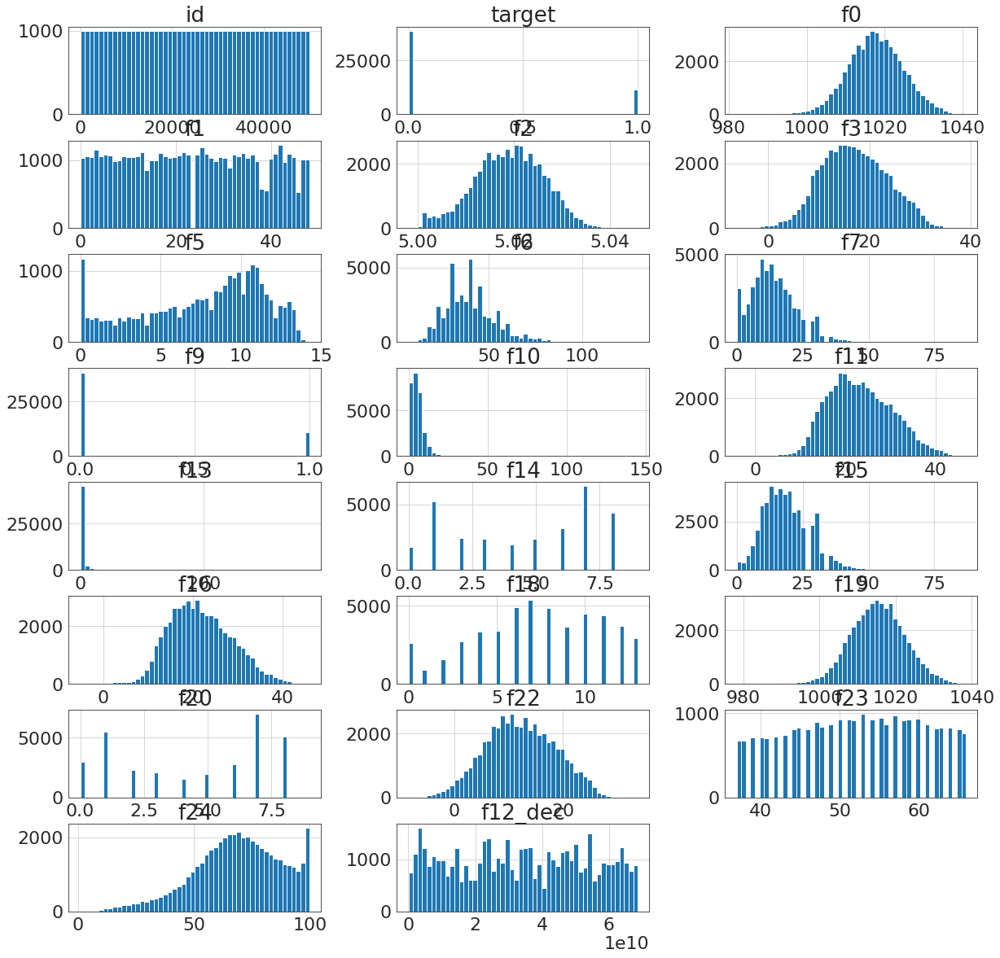

In [118]:
numerical_features_plots = train.hist(bins=50, figsize=(20,20), layout=(8,3))
numerical_features_plots

Some additional interesting observations about the numerical data:
- The distribution of f9 looks very similar to the target distribution - they might be correlated.
- f5 has a high frequency of 0 values - this could be placeholder for missing values. There are also periodical drops in frequency for even numbers. It could be interesting to look at a new feautre x mod 2 for f5
- f24 has a high frequency of values close to 100. It looks like there is a cap on maximum value for this feature.
- f10 and f13 have narrow distributions, and it looks like they include outliers
- f14, f18 and f20 must represent counts or categorical data
- f23 has an interesting distribution. It could be a transformation of the other features.

I will look closer at f23:

In [119]:
train.f23.describe()

count    25160.000000
mean        52.013712
std          8.323467
min         37.000000
25%         45.000000
50%         52.000000
75%         59.000000
max         66.000000
Name: f23, dtype: float64

f23 is actually integer-valued with values in the interval 37-66.

<AxesSubplot:ylabel='Frequency'>

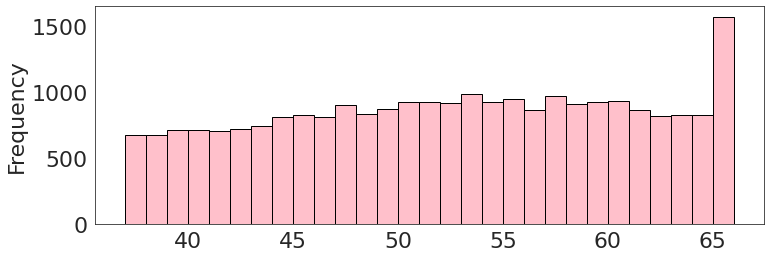

In [120]:
train['f23'].plot(kind='hist', bins=(66-37), figsize=(12,4), facecolor='pink',edgecolor='black')

This kind of data could represent something like age.

Let's plot the frequency of the categorical data:

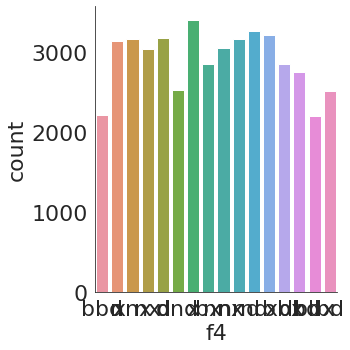

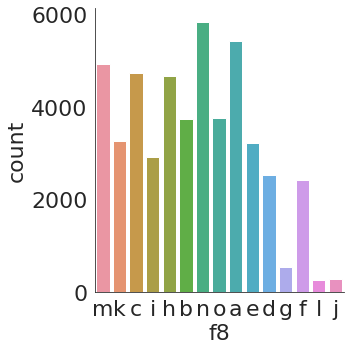

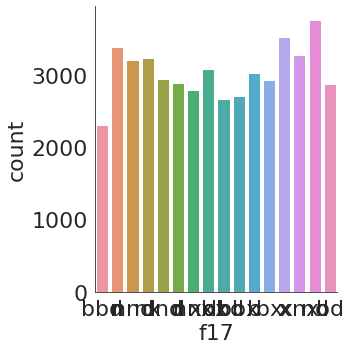

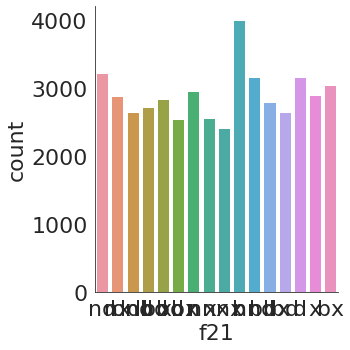

In [121]:
for col in cat_cols:
    sns.catplot(x=col, kind="count", data=train)

It looks like most of the values are evenly distributed, but for f8 we see that there are fewer of the categories d-j.

### Plot the mean

Most of them are in the same range, except for f0, f12_dec and f19. Let's remove them to better look at the others.

<AxesSubplot:>

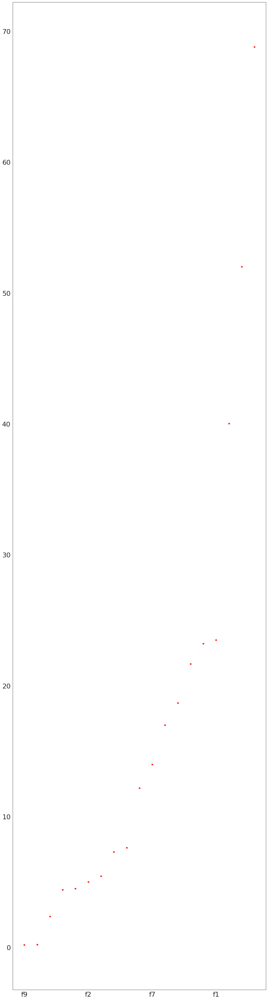

In [122]:
train.drop(['id', 'f0', 'f12_dec', 'f19'], axis=1).mean().sort_values().plot(style='*', color='red')

## 3. Bi-variate analysis

### Correlation between variables

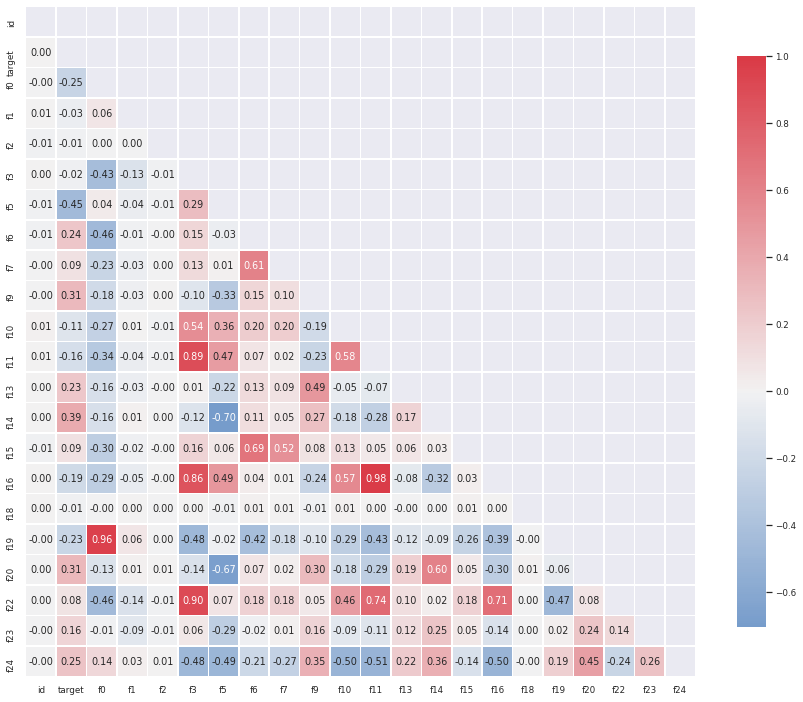

<Figure size 1080x4320 with 0 Axes>

In [332]:
correlations = train.corr()

fig, ax = plt.subplots(figsize=(15,15))
sns.set_style(style = 'white')
sns.set(font_scale=0.8)
cmap = sns.diverging_palette(250, 10, as_cmap=True)
mask = np.triu(np.ones_like(correlations, dtype=np.bool))
heatmap = sns.heatmap(correlations, vmax=1.0, center=0, fmt='.2f', cmap=cmap, mask=mask,
        square=True, linewidths=.5, annot=True, cbar_kws={"shrink": .70})
plt.show();
plt.savefig('heatmap.png')

This table has some interesting information. Many of the features are correlated, as presented in this list:

- **f0** - **f19**
- **f3** - f11, f16, **f22**
- f5 - f14, f20
- f6 - f7, f15
- f7 - f15
- f9 - f13
- **f11** - **f16**, f22, f24
- f14 - f20
- f16 - f22

The bold features are either highly positively or highly negativley correlated. The features f0 and f19, f3 and f22, and f11 and f16 are have correlation of 0.9 or above. This implies that the features are redundant of each other, and might cause overfitting. We can potentially remove one of them during feature engineering.

In [124]:
colors = {0.0:'orange', 1.0:'green'}

<AxesSubplot:xlabel='target', ylabel='f9'>

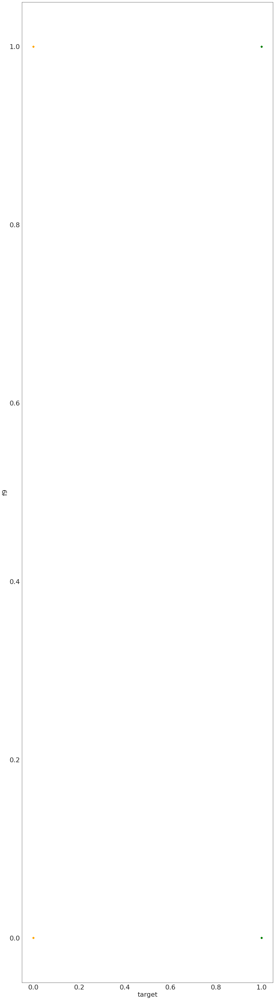

In [125]:
train.plot(kind='scatter', x='target', y='f9', color=train['target'].apply(lambda x: colors[x]))

<AxesSubplot:xlabel='target', ylabel='f9'>

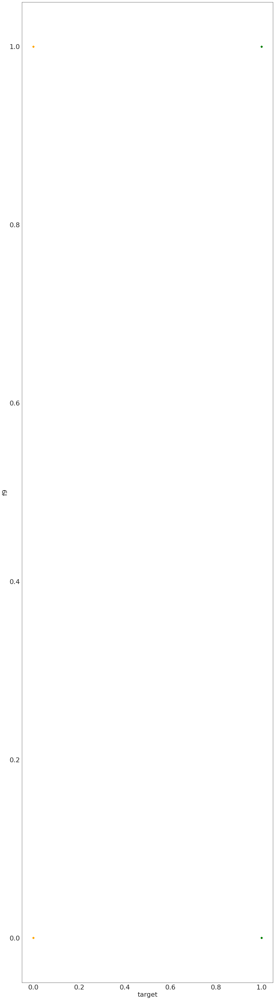

In [126]:
train.plot(kind='scatter', x='target', y='f9', color=train['target'].apply(lambda x: colors[x]))

### Scatterplots of features

In [ ]:
#sns_plot = sns.pairplot(train, hue='target')
#sns_plot.savefig('pairplot.png')
#sns_plot

Load pairplot and display it

Populating the interactive namespace from numpy and matplotlib


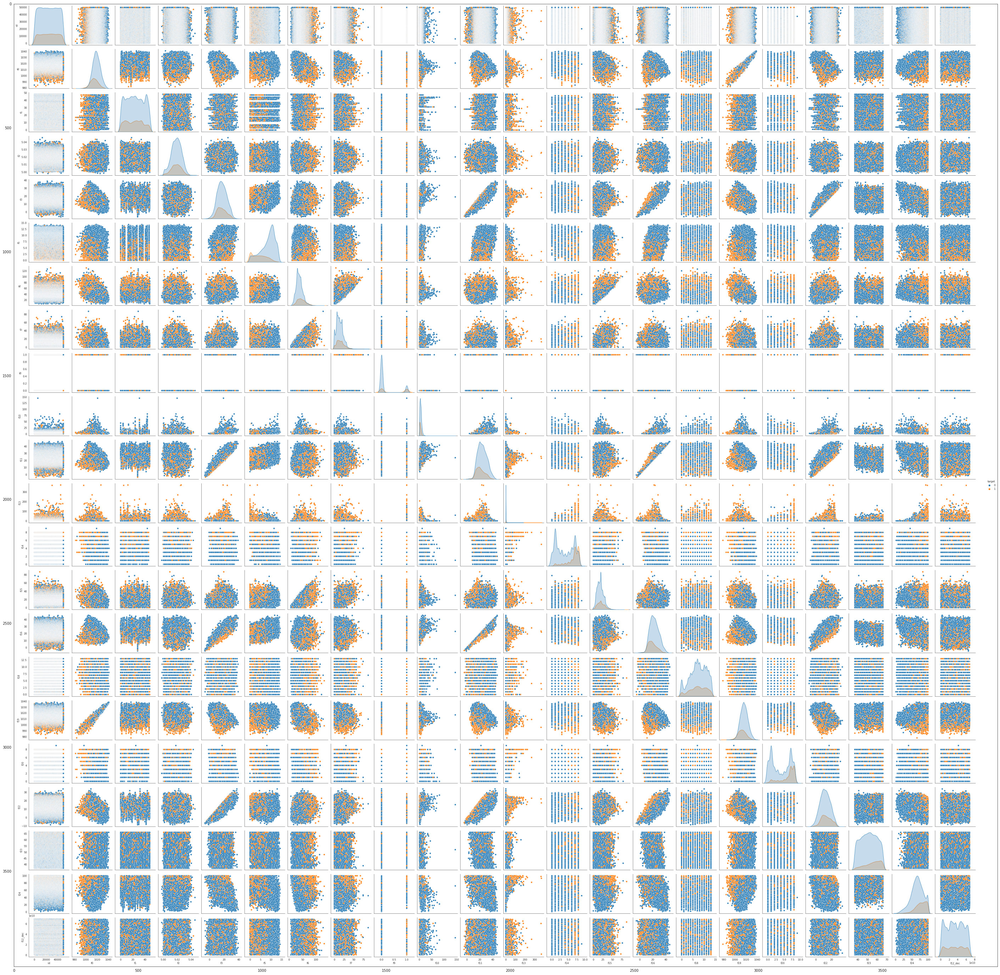

In [227]:
%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img = mpimg.imread('pairplot.png')
plt.figure(figsize=(50, 50))
imgplot = plt.imshow(img)
plt.show()

### Box plots
Let's find those outliers.

<AxesSubplot:>

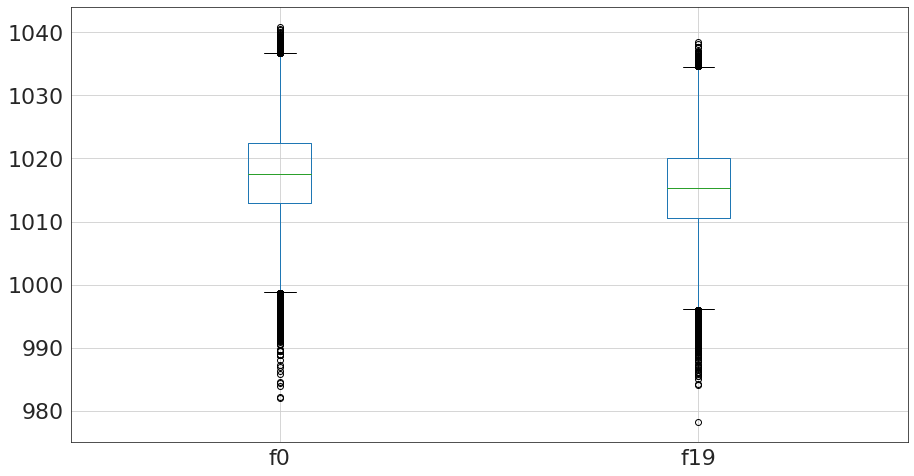

In [128]:
train.boxplot(['f0', 'f19'], figsize=(15,8))

<AxesSubplot:>

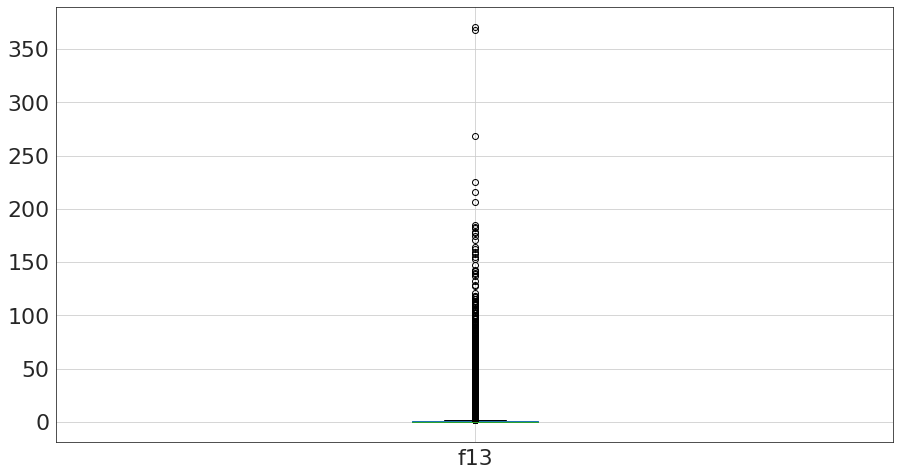

In [129]:
train.boxplot('f13', figsize=(15,8))

<AxesSubplot:>

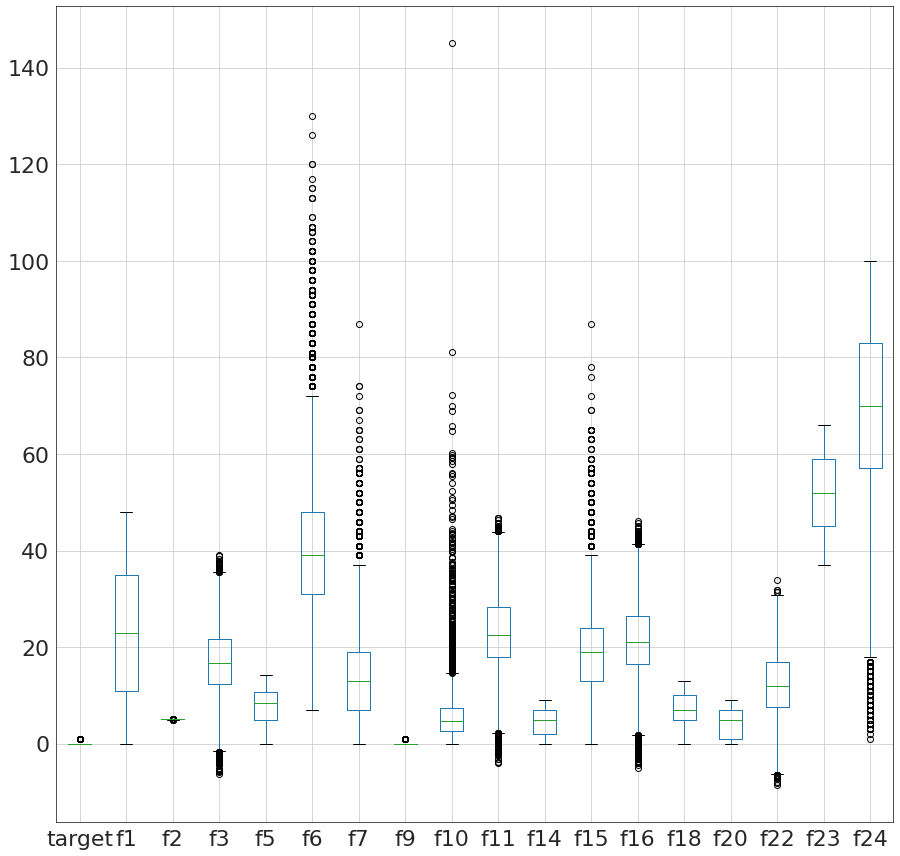

In [130]:
train.boxplot([x for x in train.drop(['id', 'f0', 'f19', 'f13', 'f12', 'f21', 'f8', 'f4', 'f17', 'f12_dec'],axis=1).columns], figsize=(15,15))

<AxesSubplot:>

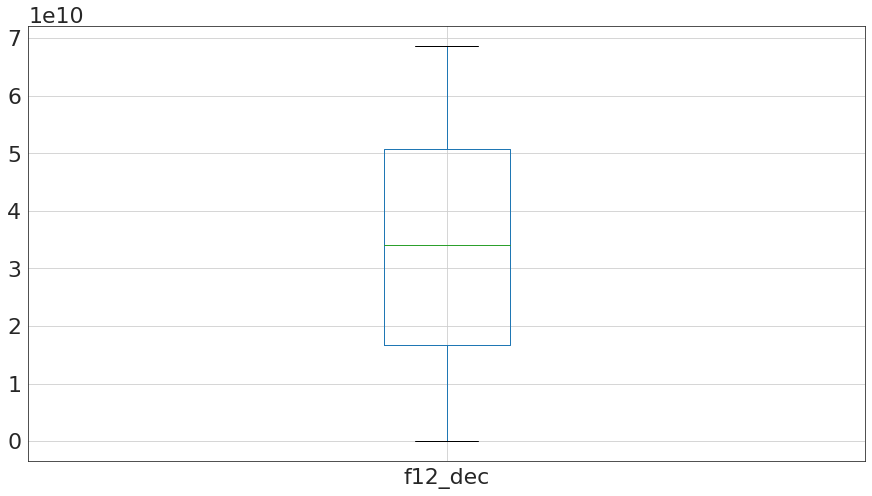

In [131]:
train.boxplot('f12_dec', figsize=(15,8))

# Preprocessing the data

## Encoding categorical values

In [132]:
train_encoded = train.copy()
train_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 28 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       50000 non-null  int64  
 1   target   50000 non-null  int64  
 2   f0       45122 non-null  float64
 3   f1       50000 non-null  int64  
 4   f2       48816 non-null  float64
 5   f3       49677 non-null  float64
 6   f4       46621 non-null  object 
 7   f5       26130 non-null  float64
 8   f6       46648 non-null  float64
 9   f7       49517 non-null  float64
 10  f8       48540 non-null  object 
 11  f9       49497 non-null  float64
 12  f10      28585 non-null  float64
 13  f11      49894 non-null  float64
 14  f12      48487 non-null  object 
 15  f13      49497 non-null  float64
 16  f14      29937 non-null  float64
 17  f15      49057 non-null  float64
 18  f16      49020 non-null  float64
 19  f17      48630 non-null  object 
 20  f18      48749 non-null  float64
 21  f19      451

In [133]:
for i in cat_cols:
    train_encoded = pd.concat([train_encoded, pd.get_dummies(train[i], prefix=i)], axis=1)
    train_encoded.drop([i], axis=1, inplace=True)

In [134]:
train_encoded.columns

Index(['id', 'target', 'f0', 'f1', 'f2', 'f3', 'f5', 'f6', 'f7', 'f9', 'f10',
       'f11', 'f12', 'f13', 'f14', 'f15', 'f16', 'f18', 'f19', 'f20', 'f22',
       'f23', 'f24', 'f12_dec', 'f4_b', 'f4_bbd', 'f4_bbx', 'f4_bd', 'f4_bx',
       'f4_d', 'f4_dbd', 'f4_dnd', 'f4_n', 'f4_nd', 'f4_nnd', 'f4_nnx',
       'f4_nx', 'f4_x', 'f4_xbx', 'f4_xnx', 'f8_a', 'f8_b', 'f8_c', 'f8_d',
       'f8_e', 'f8_f', 'f8_g', 'f8_h', 'f8_i', 'f8_j', 'f8_k', 'f8_l', 'f8_m',
       'f8_n', 'f8_o', 'f17_b', 'f17_bbd', 'f17_bbx', 'f17_bd', 'f17_bx',
       'f17_d', 'f17_dbd', 'f17_dnd', 'f17_n', 'f17_nd', 'f17_nnd', 'f17_nnx',
       'f17_nx', 'f17_x', 'f17_xbx', 'f17_xnx', 'f21_b', 'f21_bbd', 'f21_bbx',
       'f21_bd', 'f21_bx', 'f21_d', 'f21_dbd', 'f21_dnd', 'f21_n', 'f21_nd',
       'f21_nnd', 'f21_nnx', 'f21_nx', 'f21_x', 'f21_xbx', 'f21_xnx'],
      dtype='object')

In [135]:
test_encoded = test
test_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 27 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       50000 non-null  int64  
 1   f0       45095 non-null  float64
 2   f1       50000 non-null  int64  
 3   f2       48828 non-null  float64
 4   f3       49677 non-null  float64
 5   f4       46797 non-null  object 
 6   f5       25972 non-null  float64
 7   f6       46814 non-null  float64
 8   f7       49534 non-null  float64
 9   f8       48473 non-null  object 
 10  f9       49517 non-null  float64
 11  f10      28499 non-null  float64
 12  f11      49881 non-null  float64
 13  f12      48543 non-null  object 
 14  f13      49517 non-null  float64
 15  f14      29943 non-null  float64
 16  f15      49108 non-null  float64
 17  f16      49062 non-null  float64
 18  f17      48728 non-null  object 
 19  f18      48720 non-null  float64
 20  f19      45116 non-null  float64
 21  f20      310

In [136]:
for i in cat_cols:
    test_encoded = pd.concat([test_encoded, pd.get_dummies(test[i], prefix=i)], axis=1)
    test_encoded.drop(i, axis=1, inplace=True)

In [137]:
test_encoded.columns

Index(['id', 'f0', 'f1', 'f2', 'f3', 'f5', 'f6', 'f7', 'f9', 'f10', 'f11',
       'f12', 'f13', 'f14', 'f15', 'f16', 'f18', 'f19', 'f20', 'f22', 'f23',
       'f24', 'f12_dec', 'f4_b', 'f4_bbd', 'f4_bbx', 'f4_bd', 'f4_bx', 'f4_d',
       'f4_dbd', 'f4_dnd', 'f4_n', 'f4_nd', 'f4_nnd', 'f4_nnx', 'f4_nx',
       'f4_x', 'f4_xbx', 'f4_xnx', 'f8_a', 'f8_b', 'f8_c', 'f8_d', 'f8_e',
       'f8_f', 'f8_g', 'f8_h', 'f8_i', 'f8_j', 'f8_k', 'f8_l', 'f8_m', 'f8_n',
       'f8_o', 'f17_b', 'f17_bbd', 'f17_bbx', 'f17_bd', 'f17_bx', 'f17_d',
       'f17_dbd', 'f17_dnd', 'f17_n', 'f17_nd', 'f17_nnd', 'f17_nnx', 'f17_nx',
       'f17_x', 'f17_xbx', 'f17_xnx', 'f21_b', 'f21_bbd', 'f21_bbx', 'f21_bd',
       'f21_bx', 'f21_d', 'f21_dbd', 'f21_dnd', 'f21_n', 'f21_nd', 'f21_nnd',
       'f21_nnx', 'f21_nx', 'f21_x', 'f21_xbx', 'f21_xnx'],
      dtype='object')

Also drop the hex columns:

In [138]:
train_encoded.drop('f12', axis=1, inplace=True)
test_encoded.drop('f12', axis=1, inplace=True)

## 1. Missing value treatment

### Removing null values

In [139]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

imp = IterativeImputer(max_iter=10, random_state=0)
train_imputed = imp.fit_transform(train_encoded)
train_imputed

array([[0.0000e+00, 0.0000e+00, 1.0131e+03, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00],
       [1.0000e+00, 0.0000e+00, 1.0102e+03, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00],
       [2.0000e+00, 0.0000e+00, 1.0144e+03, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00],
       ...,
       [4.9997e+04, 0.0000e+00, 1.0212e+03, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00],
       [4.9998e+04, 0.0000e+00, 1.0124e+03, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00],
       [4.9999e+04, 1.0000e+00, 1.0229e+03, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00]])

In [140]:
test_imputed = imp.fit_transform(test_encoded)
test_imputed

array([[5.0000e+04, 1.0244e+03, 1.5000e+01, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00],
       [5.0001e+04, 1.0290e+03, 3.0000e+00, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00],
       [5.0002e+04, 1.0167e+03, 1.0000e+01, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00],
       ...,
       [9.9997e+04, 1.0225e+03, 4.0000e+00, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00],
       [9.9998e+04, 1.0146e+03, 2.4000e+01, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00],
       [9.9999e+04, 1.0234e+03, 1.7000e+01, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00]])

In [141]:
train_imputed = pd.DataFrame(train_imputed, columns=train_encoded.columns)
test_imputed = pd.DataFrame(test_imputed, columns=test_encoded.columns)

In [142]:
train_imputed

,id,target,f0,f1,f2,f3,f5,f6,f7,f9,...,f21_dbd,f21_dnd,f21_n,f21_nd,f21_nnd,f21_nnx,f21_nx,f21_x,f21_xbx,f21_xnx
0,0.0,0.0,1013.1,0.0,5.0190,26.1,11.100000,33.0,11.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,0.0,1010.2,1.0,5.0142,10.4,7.382214,46.0,17.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,2.0,0.0,1014.4,2.0,5.0280,12.3,5.590253,31.0,13.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,3.0,0.0,1019.2,3.0,5.0335,23.0,11.600000,41.0,9.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4.0,0.0,1027.6,4.0,5.0129,7.3,7.300000,28.0,15.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,49995.0,1.0,1030.1,40.0,5.0161,14.4,6.008230,30.0,15.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
49996,49996.0,1.0,1017.9,22.0,5.0319,23.4,1.800000,39.0,9.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
49997,49997.0,0.0,1021.2,13.0,5.0247,14.0,12.200000,39.0,19.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
49998,49998.0,0.0,1012.4,0.0,5.0219,29.9,9.500000,52.0,20.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [143]:
train_imputed.duplicated().apply(lambda x: x is True).sum()

0

Still no duplicate rows.

## Outlier Treatment

In [145]:
def find_skew(x):
    tmp=x.dropna()
    skew_value=skew(tmp)
    return 'sample lenght: %s   and skew: %s'%(len(tmp),skew_value)

Lets find the skew value for the features with outliers, and try to lower it.

In [146]:
def print_skews():
    for col in train_imputed.columns:
        print(col, ': ', find_skew(train_imputed[col]))
        
print_skews()

id :  sample lenght: 50000   and skew: 0.0
target :  sample lenght: 50000   and skew: 1.314909887767842
f0 :  sample lenght: 50000   and skew: -0.09653780092899415
f1 :  sample lenght: 50000   and skew: 0.041465316694681204
f2 :  sample lenght: 50000   and skew: -0.14716970201898816
f3 :  sample lenght: 50000   and skew: 0.07059467057490015
f5 :  sample lenght: 50000   and skew: -0.34486737861685457
f6 :  sample lenght: 50000   and skew: 0.8882569087139247
f7 :  sample lenght: 50000   and skew: 0.7837967017567634
f9 :  sample lenght: 50000   and skew: 1.3320975483651094
f10 :  sample lenght: 50000   and skew: 3.90333056266775
f11 :  sample lenght: 50000   and skew: 0.2181082127099453
f13 :  sample lenght: 50000   and skew: 11.091957988554398
f14 :  sample lenght: 50000   and skew: -0.22331129523493293
f15 :  sample lenght: 50000   and skew: 0.622111643050139
f16 :  sample lenght: 50000   and skew: 0.22556326876252947
f18 :  sample lenght: 50000   and skew: -0.28859536448006745
f19 :  s

Let's consider the numerical features first, which are all features above `f4_b`. `f13` has a very high skew of 11.09, and `f10` is a little higher than the rest, with a value of 3.9.

<AxesSubplot:>

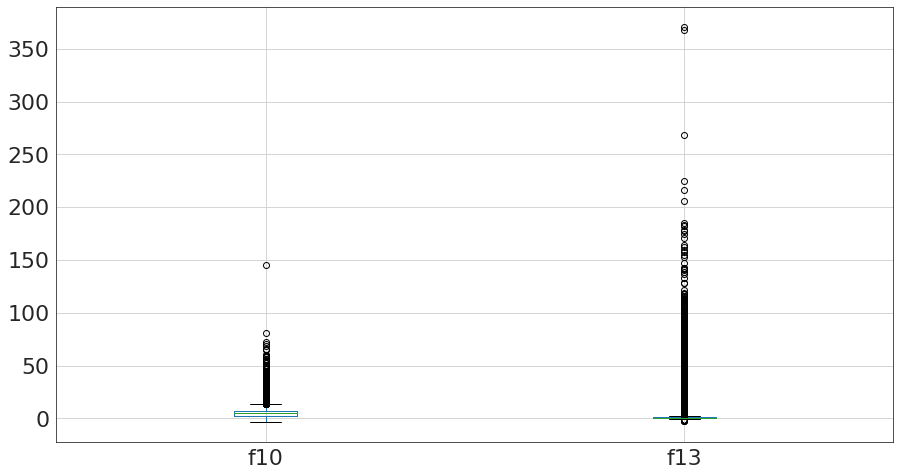

In [147]:
train_imputed.boxplot(['f10', 'f13'], figsize=(15,8))

In [148]:
train_outliers_1 = train_imputed[train_imputed.f10<50]
find_skew(train_outliers_1['f10'])

'sample lenght: 49980   and skew: 1.8983107365083447'

In [149]:
train_outliers_2 = train_outliers_1[train_outliers_1.f13<50]
find_skew(train_outliers_2.f13)

'sample lenght: 49690   and skew: 4.465692760637752'

In [150]:
train_outliers = train_outliers_2.copy()

# Feature transformation

In [151]:
train_transformed = train_outliers.copy()
test_transformed = test_imputed.copy()

In [152]:
train_transformed.describe()

,id,target,f0,f1,f2,f3,f5,f6,f7,f9,...,f21_dbd,f21_dnd,f21_n,f21_nd,f21_nnd,f21_nnx,f21_nx,f21_x,f21_xbx,f21_xnx
count,49690.000000,49690.000000,49690.000000,49690.000000,49690.000000,49690.000000,49690.000000,49690.000000,49690.000000,49690.000000,...,49690.000000,49690.000000,49690.000000,49690.000000,49690.000000,49690.000000,49690.000000,49690.000000,49690.000000,49690.000000
mean,24995.430509,0.222338,1017.717521,23.504931,5.018890,16.954601,7.470026,39.651454,13.881092,0.218923,...,0.054498,0.052928,0.058845,0.064258,0.062910,0.051036,0.057235,0.057718,0.050654,0.048038
std,14438.589267,0.415822,6.774958,14.012968,0.007094,6.530071,3.268211,13.505072,8.916947,0.411366,...,0.227000,0.223892,0.235336,0.245215,0.242804,0.220074,0.232293,0.233211,0.219292,0.213848
min,0.000000,0.000000,982.000000,0.000000,4.998000,-6.200000,-0.850239,7.000000,-5.958606,-0.131136,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,12490.250000,0.000000,1013.600000,11.000000,5.014100,12.200000,5.273000,30.000000,7.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,24993.500000,0.000000,1017.700000,23.000000,5.019000,16.700000,7.773710,37.000000,13.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,37497.750000,0.000000,1021.900000,35.000000,5.023900,21.500000,9.994390,47.102551,19.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,49999.000000,1.000000,1040.900000,48.000000,5.045800,39.100000,15.492052,130.000000,87.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


f12_dec has very big values, so we will transform this feature to logarithmic scale.
f0 has all its values around 1000, so I will take the difference of x - 1000 as the new feature.
f2 has all its values around 5, so same here: x - 5

In [153]:
train_transformed['f12_dec'] = np.log(train_transformed['f12_dec'])
train_transformed['f0'] = train_transformed['f0'] - 1000
train_transformed['f2'] = train_transformed['f0'] - 5

In [154]:
test_transformed['f12_dec'] = np.log(test_transformed['f12_dec'])
test_transformed['f0'] = test_transformed['f0'] - 1000
test_transformed['f2'] = test_transformed['f0'] - 5

In [155]:
train_transformed = train_transformed.drop_duplicates()
train_transformed.shape

(49690, 86)

In [156]:
test_transformed.shape

(50000, 85)

# Split the training data

In [247]:
# split data into train and test sets
seed = 7
test_size = 0.15

y = train_transformed["target"].values
train_cleaned = train_transformed.drop('target', axis=1)
X_train, X_test, y_train, y_test = train_test_split(train_cleaned, y, test_size=test_size, random_state=seed)

## Save split data

In [325]:
X_train.to_csv('data/X_train.csv')
X_test.to_csv('data/X_test.csv')
np.savetxt('data/y_train.csv', y_train, delimiter=',')
np.savetxt('data/y_test.csv', y_test, delimiter=',')

# Modelling

## Baseline models

Guess random class

In [158]:
from sklearn.dummy import DummyClassifier

random_clf = DummyClassifier(strategy='uniform', random_state=seed)
random_clf.fit(X_train, y_train)
predictions = random_clf.predict(X_test)
score = random_clf.score(X_test, y_test)
score

0.495670203683376

Guess the most frequent target

In [159]:
zero_rule_clf = DummyClassifier(strategy='most_frequent', random_state=seed)
zero_rule_clf.fit(X_train, y_train)
predictions = zero_rule_clf.predict(X_test)
score = zero_rule_clf.score(X_test, y_test)

print("Prediction score:", score) 

# See the actual number of different labels, to check that the score makes sense
print("\nValue counts:")
print(pd.DataFrame(y_train).value_counts())
print(pd.DataFrame(y_test).value_counts())

Prediction score: 0.7777167947310648

Value counts:
0.0    25889
1.0     7403
dtype: int64
0.0    12753
1.0     3645
dtype: int64


The predictors should perform better than the baseline models. That means they have learnt something more than random guess or just guessing the most frequent target.

## xgboost model

In [160]:
import xgboost as xgb
from sklearn import metrics
from sklearn.model_selection import GridSearchCV

def auc(m, train, test, y_train, y_test): 
    return (metrics.roc_auc_score(y_train, m.predict_proba(train)[:,1]),
                            metrics.roc_auc_score(y_test, m.predict_proba(test)[:,1]))

In [228]:
# Parameter Tuning
model = xgb.XGBClassifier()
param_dist = {"max_depth": [10, 50],
              "min_child_weight" : [1, 6],
              "n_estimators": [200, 500],
              "learning_rate": [0.05, 0.1, 0.16],
              "gamma": [1, 1e-09]}
grid_search = GridSearchCV(model, param_grid=param_dist, cv = 3, 
                                   verbose=10, n_jobs=-1)
grid_search.fit(X_train, y_train)

grid_search.best_estimator_

Fitting 3 folds for each of 48 candidates, totalling 144 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   44.5s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done  45 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done  69 tasks      | elapsed: 18.0min
[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed: 20.7min
[Parallel(n_jobs=-1)]: Done  97 tasks      | elapsed: 24.6min
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed: 27.9min
[Parallel(n_jobs=-1)]: Done 129 tasks      | elapsed: 31.1min
[Parallel(n_jobs=-1)]: Done 144 out of 144 | elapsed: 34.7min remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 144 out of 144 | elapsed: 34.7min finished


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=1e-09, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.1, max_delta_step=0, max_depth=10,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=500, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [238]:
grid_search.best_params_

{'gamma': 1e-09,
 'learning_rate': 0.1,
 'max_depth': 10,
 'min_child_weight': 1,
 'n_estimators': 500}

Best params:
{'gamma': 1e-09,
 'learning_rate': 0.1,
 'max_depth': 10,
 'min_child_weight': 1,
 'n_estimators': 500}

Try with params:
- gamma: 1e-09
- learning rate: 0.1
- max_depth: 10
- min_child_weight: 1
- n_estimators: 500

In [248]:
xgb_model = xgb.XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=1e-09, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.1, max_delta_step=0, max_depth=10,
              min_child_weight=1, monotone_constraints='()',
              n_estimators=500, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)
xgb_model.fit(X_train, y_train)

auc(xgb_model, X_train, X_test, y_train, y_test)

(1.0, 0.9300006490972712)

Try with params:
- gamma: 1e-09
- learning rate: 0.05
- max_depth: 50
- min_child_weight: 6
- n_estimators: 500

In [249]:
xgb_model2 = xgb.XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1.0, gamma=1e-09, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.05, max_delta_step=0, max_depth=50,
              min_child_weight=6, monotone_constraints='()',
              n_estimators=500, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1.0,
              tree_method='exact', validate_parameters=1, verbosity=None)
xgb_model2.fit(X_train, y_train)

auc(xgb_model2, X_train, X_test, y_train, y_test)

(1.0, 0.9316309349773447)

Try with params:
- gamma: 0
- learning rate: 0.05
- max_depth: 10
- min_child_weight: 6
- n_estimators: 500

In [250]:
xgb_model3 = xgb.XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.05, max_delta_step=0, max_depth=10,
              min_child_weight=6, monotone_constraints='()',
              n_estimators=500, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)
xgb_model3.fit(X_train, y_train)

auc(xgb_model3, X_train, X_test, y_train, y_test)

(0.9993991713015311, 0.929257746115429)

After running grid search and using its output as a starting point, I trained different classifiers using , and training the model with the different parameters, I found  that the best parameters were:
- learning rate: 0.05
- max depth: 50
- n estimatiors: 500
- min child weight: 6
- gamma: 1e-09

## LightGBM

In [165]:
import lightgbm as lgb
from sklearn import metrics

def auc2(m, train, test, y_train, y_test): 
    return (metrics.roc_auc_score(y_train, m.predict(train)),
                            metrics.roc_auc_score(y_test, m.predict(test)))

In [209]:
# Parameter tuning
lg = lgb.LGBMClassifier(silent=False)
param_dist = {"max_depth": [25,50, 75],
              "learning_rate" : [0.01,0.05,0.1],
              "num_leaves": [300,900,1200],
              "n_estimators": [200]
             }
grid_search = GridSearchCV(lg, n_jobs=-1, param_grid=param_dist, cv = 3, scoring="roc_auc", verbose=5)
grid_search.fit(X_train, y_train)
grid_search.best_estimator_

Fitting 3 folds for each of 27 candidates, totalling 81 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   13.4s
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done  81 out of  81 | elapsed:  3.8min finished


[LightGBM] [Info] Number of positive: 7403, number of negative: 25889
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004857 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5283
[LightGBM] [Info] Number of data points in the train set: 33292, number of used features: 85
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.222366 -> initscore=-1.251933
[LightGBM] [Info] Start training from score -1.251933


LGBMClassifier(max_depth=50, n_estimators=200, num_leaves=300, silent=False)

In [213]:
grid_search.best_params_

{'learning_rate': 0.1, 'max_depth': 50, 'n_estimators': 200, 'num_leaves': 300}

Best params: {'learning_rate': 0.1, 'max_depth': 50, 'n_estimators': 200, 'num_leaves': 300}

In [251]:
d_train = lgb.Dataset(X_train, label=y_train)
params = {"max_depth": 50, "learning_rate" : 0.1, "num_leaves": 300,  "n_estimators": 200}

# Without Categorical Features
lgb_model = lgb.train(params, d_train)
auc2(lgb_model, X_train, X_test, y_train, y_test)

/home/anja/.local/lib/python3.8/site-packages/lightgbm/engine.py:151: UserWarning: Found `n_estimators` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001153 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5322
[LightGBM] [Info] Number of data points in the train set: 42236, number of used features: 85
[LightGBM] [Info] Start training from score 0.223435


(0.9999945270831732, 0.9198821681293663)

## CatBoost

In [168]:
import catboost as cb

In [210]:
params = {'depth': [4, 7, 10],
          'learning_rate' : [0.03, 0.1, 0.15],
         'l2_leaf_reg': [1,4,9],
         'iterations': [300]}
catboost = cb.CatBoostClassifier()
cb_model = GridSearchCV(catboost, params, scoring="roc_auc", cv = 3)
cb_model.fit(X_train, y_train)

0:	learn: 0.6713927	total: 5.36ms	remaining: 1.6s
1:	learn: 0.6506326	total: 9.61ms	remaining: 1.43s
2:	learn: 0.6311094	total: 13.9ms	remaining: 1.37s
3:	learn: 0.6129137	total: 19ms	remaining: 1.4s
4:	learn: 0.5963732	total: 22.6ms	remaining: 1.34s
5:	learn: 0.5807265	total: 26.6ms	remaining: 1.3s
6:	learn: 0.5667747	total: 30.2ms	remaining: 1.26s
7:	learn: 0.5538122	total: 34.6ms	remaining: 1.26s
8:	learn: 0.5405430	total: 38.5ms	remaining: 1.25s
9:	learn: 0.5287135	total: 42.9ms	remaining: 1.24s
10:	learn: 0.5186585	total: 46.7ms	remaining: 1.23s
11:	learn: 0.5081993	total: 52.1ms	remaining: 1.25s
12:	learn: 0.4991916	total: 55.7ms	remaining: 1.23s
13:	learn: 0.4902878	total: 59.5ms	remaining: 1.21s
14:	learn: 0.4822211	total: 64.2ms	remaining: 1.22s
15:	learn: 0.4751136	total: 74.8ms	remaining: 1.33s
16:	learn: 0.4682935	total: 80.5ms	remaining: 1.34s
17:	learn: 0.4613692	total: 87.8ms	remaining: 1.38s
18:	learn: 0.4547918	total: 93.1ms	remaining: 1.38s
19:	learn: 0.4487461	total:

172:	learn: 0.3288078	total: 1s	remaining: 738ms
173:	learn: 0.3285438	total: 1.01s	remaining: 731ms
174:	learn: 0.3284157	total: 1.01s	remaining: 723ms
175:	learn: 0.3283347	total: 1.02s	remaining: 716ms
176:	learn: 0.3281559	total: 1.02s	remaining: 709ms
177:	learn: 0.3279824	total: 1.02s	remaining: 703ms
178:	learn: 0.3278586	total: 1.03s	remaining: 696ms
179:	learn: 0.3277157	total: 1.03s	remaining: 689ms
180:	learn: 0.3275491	total: 1.04s	remaining: 682ms
181:	learn: 0.3273163	total: 1.04s	remaining: 677ms
182:	learn: 0.3272437	total: 1.05s	remaining: 671ms
183:	learn: 0.3271342	total: 1.05s	remaining: 664ms
184:	learn: 0.3270686	total: 1.06s	remaining: 658ms
185:	learn: 0.3269193	total: 1.06s	remaining: 651ms
186:	learn: 0.3268125	total: 1.07s	remaining: 644ms
187:	learn: 0.3266434	total: 1.07s	remaining: 638ms
188:	learn: 0.3265465	total: 1.07s	remaining: 631ms
189:	learn: 0.3264533	total: 1.08s	remaining: 625ms
190:	learn: 0.3263943	total: 1.08s	remaining: 618ms
191:	learn: 0.3

38:	learn: 0.3884254	total: 222ms	remaining: 1.49s
39:	learn: 0.3866626	total: 231ms	remaining: 1.5s
40:	learn: 0.3850274	total: 235ms	remaining: 1.48s
41:	learn: 0.3835747	total: 239ms	remaining: 1.47s
42:	learn: 0.3822623	total: 243ms	remaining: 1.45s
43:	learn: 0.3808084	total: 248ms	remaining: 1.44s
44:	learn: 0.3797337	total: 252ms	remaining: 1.43s
45:	learn: 0.3783872	total: 256ms	remaining: 1.41s
46:	learn: 0.3775406	total: 261ms	remaining: 1.4s
47:	learn: 0.3762992	total: 266ms	remaining: 1.4s
48:	learn: 0.3749585	total: 270ms	remaining: 1.38s
49:	learn: 0.3737290	total: 274ms	remaining: 1.37s
50:	learn: 0.3727928	total: 281ms	remaining: 1.37s
51:	learn: 0.3719236	total: 290ms	remaining: 1.38s
52:	learn: 0.3709818	total: 297ms	remaining: 1.38s
53:	learn: 0.3699732	total: 304ms	remaining: 1.38s
54:	learn: 0.3688730	total: 315ms	remaining: 1.4s
55:	learn: 0.3679588	total: 321ms	remaining: 1.4s
56:	learn: 0.3672073	total: 324ms	remaining: 1.38s
57:	learn: 0.3664181	total: 336ms	re

218:	learn: 0.3277133	total: 1.43s	remaining: 528ms
219:	learn: 0.3276025	total: 1.43s	remaining: 521ms
220:	learn: 0.3275451	total: 1.44s	remaining: 514ms
221:	learn: 0.3273974	total: 1.44s	remaining: 507ms
222:	learn: 0.3272445	total: 1.45s	remaining: 499ms
223:	learn: 0.3270919	total: 1.45s	remaining: 493ms
224:	learn: 0.3269818	total: 1.46s	remaining: 486ms
225:	learn: 0.3267597	total: 1.46s	remaining: 479ms
226:	learn: 0.3266738	total: 1.47s	remaining: 472ms
227:	learn: 0.3265798	total: 1.47s	remaining: 465ms
228:	learn: 0.3265032	total: 1.48s	remaining: 459ms
229:	learn: 0.3263866	total: 1.49s	remaining: 453ms
230:	learn: 0.3263349	total: 1.5s	remaining: 448ms
231:	learn: 0.3262456	total: 1.5s	remaining: 441ms
232:	learn: 0.3261733	total: 1.51s	remaining: 436ms
233:	learn: 0.3260339	total: 1.52s	remaining: 429ms
234:	learn: 0.3258624	total: 1.53s	remaining: 424ms
235:	learn: 0.3257974	total: 1.53s	remaining: 416ms
236:	learn: 0.3256757	total: 1.54s	remaining: 410ms
237:	learn: 0.

104:	learn: 0.3437272	total: 604ms	remaining: 1.12s
105:	learn: 0.3435147	total: 613ms	remaining: 1.12s
106:	learn: 0.3433296	total: 617ms	remaining: 1.11s
107:	learn: 0.3430078	total: 621ms	remaining: 1.1s
108:	learn: 0.3427004	total: 631ms	remaining: 1.1s
109:	learn: 0.3424444	total: 636ms	remaining: 1.1s
110:	learn: 0.3422127	total: 642ms	remaining: 1.09s
111:	learn: 0.3419375	total: 647ms	remaining: 1.09s
112:	learn: 0.3417520	total: 652ms	remaining: 1.08s
113:	learn: 0.3414703	total: 660ms	remaining: 1.08s
114:	learn: 0.3411335	total: 665ms	remaining: 1.07s
115:	learn: 0.3410522	total: 670ms	remaining: 1.06s
116:	learn: 0.3408659	total: 678ms	remaining: 1.06s
117:	learn: 0.3406960	total: 683ms	remaining: 1.05s
118:	learn: 0.3404612	total: 692ms	remaining: 1.05s
119:	learn: 0.3401924	total: 697ms	remaining: 1.04s
120:	learn: 0.3399133	total: 701ms	remaining: 1.04s
121:	learn: 0.3397107	total: 709ms	remaining: 1.03s
122:	learn: 0.3395793	total: 713ms	remaining: 1.02s
123:	learn: 0.3

266:	learn: 0.3194806	total: 1.6s	remaining: 198ms
267:	learn: 0.3194094	total: 1.61s	remaining: 192ms
268:	learn: 0.3192939	total: 1.61s	remaining: 186ms
269:	learn: 0.3192478	total: 1.62s	remaining: 180ms
270:	learn: 0.3191579	total: 1.62s	remaining: 174ms
271:	learn: 0.3190268	total: 1.63s	remaining: 168ms
272:	learn: 0.3189791	total: 1.63s	remaining: 161ms
273:	learn: 0.3188653	total: 1.64s	remaining: 155ms
274:	learn: 0.3188295	total: 1.64s	remaining: 149ms
275:	learn: 0.3187448	total: 1.65s	remaining: 143ms
276:	learn: 0.3186575	total: 1.65s	remaining: 137ms
277:	learn: 0.3184993	total: 1.65s	remaining: 131ms
278:	learn: 0.3184394	total: 1.66s	remaining: 125ms
279:	learn: 0.3183289	total: 1.66s	remaining: 119ms
280:	learn: 0.3182735	total: 1.67s	remaining: 113ms
281:	learn: 0.3181701	total: 1.67s	remaining: 107ms
282:	learn: 0.3180847	total: 1.68s	remaining: 101ms
283:	learn: 0.3180148	total: 1.69s	remaining: 95.2ms
284:	learn: 0.3179385	total: 1.7s	remaining: 89.4ms
285:	learn: 

149:	learn: 0.2965348	total: 909ms	remaining: 909ms
150:	learn: 0.2963006	total: 917ms	remaining: 905ms
151:	learn: 0.2960468	total: 921ms	remaining: 897ms
152:	learn: 0.2958057	total: 925ms	remaining: 889ms
153:	learn: 0.2955478	total: 930ms	remaining: 882ms
154:	learn: 0.2953172	total: 935ms	remaining: 875ms
155:	learn: 0.2950545	total: 940ms	remaining: 868ms
156:	learn: 0.2948285	total: 945ms	remaining: 861ms
157:	learn: 0.2944905	total: 949ms	remaining: 853ms
158:	learn: 0.2942782	total: 954ms	remaining: 846ms
159:	learn: 0.2941156	total: 959ms	remaining: 839ms
160:	learn: 0.2938149	total: 963ms	remaining: 832ms
161:	learn: 0.2935438	total: 968ms	remaining: 824ms
162:	learn: 0.2932846	total: 972ms	remaining: 817ms
163:	learn: 0.2929709	total: 977ms	remaining: 810ms
164:	learn: 0.2926476	total: 981ms	remaining: 802ms
165:	learn: 0.2924123	total: 986ms	remaining: 796ms
166:	learn: 0.2922525	total: 990ms	remaining: 789ms
167:	learn: 0.2919830	total: 996ms	remaining: 782ms
168:	learn: 

34:	learn: 0.3447641	total: 204ms	remaining: 1.54s
35:	learn: 0.3440023	total: 211ms	remaining: 1.54s
36:	learn: 0.3434744	total: 223ms	remaining: 1.58s
37:	learn: 0.3428889	total: 226ms	remaining: 1.56s
38:	learn: 0.3421699	total: 232ms	remaining: 1.55s
39:	learn: 0.3414467	total: 237ms	remaining: 1.54s
40:	learn: 0.3409143	total: 242ms	remaining: 1.53s
41:	learn: 0.3402649	total: 248ms	remaining: 1.52s
42:	learn: 0.3397525	total: 253ms	remaining: 1.51s
43:	learn: 0.3392910	total: 258ms	remaining: 1.5s
44:	learn: 0.3384787	total: 264ms	remaining: 1.49s
45:	learn: 0.3374569	total: 272ms	remaining: 1.5s
46:	learn: 0.3367513	total: 276ms	remaining: 1.49s
47:	learn: 0.3361970	total: 287ms	remaining: 1.5s
48:	learn: 0.3357737	total: 292ms	remaining: 1.5s
49:	learn: 0.3349658	total: 301ms	remaining: 1.5s
50:	learn: 0.3345810	total: 307ms	remaining: 1.5s
51:	learn: 0.3339357	total: 320ms	remaining: 1.53s
52:	learn: 0.3334511	total: 325ms	remaining: 1.51s
53:	learn: 0.3329807	total: 335ms	rem

220:	learn: 0.2819208	total: 1.4s	remaining: 501ms
221:	learn: 0.2817485	total: 1.41s	remaining: 494ms
222:	learn: 0.2815786	total: 1.41s	remaining: 487ms
223:	learn: 0.2813261	total: 1.42s	remaining: 480ms
224:	learn: 0.2810731	total: 1.42s	remaining: 474ms
225:	learn: 0.2809062	total: 1.43s	remaining: 467ms
226:	learn: 0.2807547	total: 1.43s	remaining: 460ms
227:	learn: 0.2805378	total: 1.43s	remaining: 453ms
228:	learn: 0.2803381	total: 1.44s	remaining: 446ms
229:	learn: 0.2801111	total: 1.44s	remaining: 440ms
230:	learn: 0.2799408	total: 1.45s	remaining: 433ms
231:	learn: 0.2796778	total: 1.45s	remaining: 426ms
232:	learn: 0.2795306	total: 1.46s	remaining: 420ms
233:	learn: 0.2793188	total: 1.47s	remaining: 414ms
234:	learn: 0.2791571	total: 1.47s	remaining: 408ms
235:	learn: 0.2790084	total: 1.49s	remaining: 403ms
236:	learn: 0.2788568	total: 1.49s	remaining: 396ms
237:	learn: 0.2787375	total: 1.5s	remaining: 391ms
238:	learn: 0.2784943	total: 1.51s	remaining: 384ms
239:	learn: 0.

107:	learn: 0.3106463	total: 615ms	remaining: 1.09s
108:	learn: 0.3103136	total: 620ms	remaining: 1.09s
109:	learn: 0.3099666	total: 626ms	remaining: 1.08s
110:	learn: 0.3095821	total: 633ms	remaining: 1.08s
111:	learn: 0.3091399	total: 637ms	remaining: 1.07s
112:	learn: 0.3088657	total: 646ms	remaining: 1.07s
113:	learn: 0.3085427	total: 652ms	remaining: 1.06s
114:	learn: 0.3082173	total: 656ms	remaining: 1.05s
115:	learn: 0.3079133	total: 664ms	remaining: 1.05s
116:	learn: 0.3075614	total: 668ms	remaining: 1.04s
117:	learn: 0.3072723	total: 674ms	remaining: 1.04s
118:	learn: 0.3069921	total: 679ms	remaining: 1.03s
119:	learn: 0.3067564	total: 684ms	remaining: 1.03s
120:	learn: 0.3065448	total: 696ms	remaining: 1.03s
121:	learn: 0.3060973	total: 701ms	remaining: 1.02s
122:	learn: 0.3057476	total: 712ms	remaining: 1.02s
123:	learn: 0.3055200	total: 717ms	remaining: 1.02s
124:	learn: 0.3052769	total: 723ms	remaining: 1.01s
125:	learn: 0.3050628	total: 731ms	remaining: 1.01s
126:	learn: 

295:	learn: 0.2678889	total: 1.81s	remaining: 24.4ms
296:	learn: 0.2677202	total: 1.82s	remaining: 18.3ms
297:	learn: 0.2676024	total: 1.83s	remaining: 12.3ms
298:	learn: 0.2674156	total: 1.83s	remaining: 6.13ms
299:	learn: 0.2672759	total: 1.84s	remaining: 0us
0:	learn: 0.5943603	total: 4.89ms	remaining: 1.46s
1:	learn: 0.5213400	total: 9.4ms	remaining: 1.4s
2:	learn: 0.4774640	total: 17.1ms	remaining: 1.69s
3:	learn: 0.4433116	total: 21.5ms	remaining: 1.59s
4:	learn: 0.4172743	total: 26.3ms	remaining: 1.55s
5:	learn: 0.4001575	total: 31.1ms	remaining: 1.52s
6:	learn: 0.3876128	total: 35.3ms	remaining: 1.48s
7:	learn: 0.3773128	total: 39.7ms	remaining: 1.45s
8:	learn: 0.3709410	total: 43.5ms	remaining: 1.4s
9:	learn: 0.3667586	total: 47.5ms	remaining: 1.38s
10:	learn: 0.3622623	total: 52ms	remaining: 1.37s
11:	learn: 0.3582734	total: 55.7ms	remaining: 1.34s
12:	learn: 0.3549650	total: 60.3ms	remaining: 1.33s
13:	learn: 0.3523037	total: 64.3ms	remaining: 1.31s
14:	learn: 0.3505072	tota

179:	learn: 0.2715023	total: 1.09s	remaining: 725ms
180:	learn: 0.2712795	total: 1.09s	remaining: 718ms
181:	learn: 0.2710111	total: 1.1s	remaining: 714ms
182:	learn: 0.2707317	total: 1.11s	remaining: 707ms
183:	learn: 0.2706024	total: 1.11s	remaining: 702ms
184:	learn: 0.2704560	total: 1.12s	remaining: 696ms
185:	learn: 0.2701866	total: 1.12s	remaining: 689ms
186:	learn: 0.2699067	total: 1.13s	remaining: 684ms
187:	learn: 0.2695803	total: 1.14s	remaining: 679ms
188:	learn: 0.2693956	total: 1.15s	remaining: 675ms
189:	learn: 0.2691898	total: 1.15s	remaining: 668ms
190:	learn: 0.2689848	total: 1.16s	remaining: 661ms
191:	learn: 0.2688168	total: 1.17s	remaining: 656ms
192:	learn: 0.2685573	total: 1.17s	remaining: 649ms
193:	learn: 0.2682462	total: 1.18s	remaining: 645ms
194:	learn: 0.2680096	total: 1.19s	remaining: 639ms
195:	learn: 0.2677082	total: 1.19s	remaining: 633ms
196:	learn: 0.2674755	total: 1.2s	remaining: 628ms
197:	learn: 0.2673450	total: 1.21s	remaining: 622ms
198:	learn: 0.

59:	learn: 0.3179781	total: 295ms	remaining: 1.18s
60:	learn: 0.3177238	total: 300ms	remaining: 1.18s
61:	learn: 0.3170177	total: 305ms	remaining: 1.17s
62:	learn: 0.3166288	total: 309ms	remaining: 1.16s
63:	learn: 0.3163086	total: 314ms	remaining: 1.16s
64:	learn: 0.3158407	total: 319ms	remaining: 1.15s
65:	learn: 0.3152217	total: 323ms	remaining: 1.15s
66:	learn: 0.3150141	total: 327ms	remaining: 1.14s
67:	learn: 0.3144278	total: 332ms	remaining: 1.13s
68:	learn: 0.3141477	total: 336ms	remaining: 1.12s
69:	learn: 0.3134550	total: 340ms	remaining: 1.12s
70:	learn: 0.3129211	total: 344ms	remaining: 1.11s
71:	learn: 0.3123115	total: 347ms	remaining: 1.1s
72:	learn: 0.3118051	total: 351ms	remaining: 1.09s
73:	learn: 0.3113579	total: 355ms	remaining: 1.08s
74:	learn: 0.3110220	total: 360ms	remaining: 1.08s
75:	learn: 0.3103335	total: 363ms	remaining: 1.07s
76:	learn: 0.3096877	total: 368ms	remaining: 1.06s
77:	learn: 0.3093605	total: 373ms	remaining: 1.06s
78:	learn: 0.3089047	total: 378m

227:	learn: 0.2598860	total: 1.08s	remaining: 343ms
228:	learn: 0.2597325	total: 1.09s	remaining: 338ms
229:	learn: 0.2594441	total: 1.09s	remaining: 333ms
230:	learn: 0.2591342	total: 1.1s	remaining: 328ms
231:	learn: 0.2589422	total: 1.1s	remaining: 323ms
232:	learn: 0.2586844	total: 1.11s	remaining: 319ms
233:	learn: 0.2585323	total: 1.11s	remaining: 314ms
234:	learn: 0.2583498	total: 1.12s	remaining: 309ms
235:	learn: 0.2581370	total: 1.12s	remaining: 304ms
236:	learn: 0.2579535	total: 1.13s	remaining: 299ms
237:	learn: 0.2576940	total: 1.13s	remaining: 295ms
238:	learn: 0.2574273	total: 1.14s	remaining: 290ms
239:	learn: 0.2572053	total: 1.14s	remaining: 285ms
240:	learn: 0.2569165	total: 1.15s	remaining: 281ms
241:	learn: 0.2567102	total: 1.15s	remaining: 276ms
242:	learn: 0.2564831	total: 1.16s	remaining: 271ms
243:	learn: 0.2560902	total: 1.16s	remaining: 267ms
244:	learn: 0.2558701	total: 1.17s	remaining: 262ms
245:	learn: 0.2556850	total: 1.17s	remaining: 257ms
246:	learn: 0.

93:	learn: 0.3008550	total: 606ms	remaining: 1.33s
94:	learn: 0.3002538	total: 612ms	remaining: 1.32s
95:	learn: 0.2999025	total: 618ms	remaining: 1.31s
96:	learn: 0.2990546	total: 625ms	remaining: 1.31s
97:	learn: 0.2987054	total: 630ms	remaining: 1.3s
98:	learn: 0.2982601	total: 639ms	remaining: 1.3s
99:	learn: 0.2978958	total: 646ms	remaining: 1.29s
100:	learn: 0.2975510	total: 652ms	remaining: 1.28s
101:	learn: 0.2971973	total: 657ms	remaining: 1.27s
102:	learn: 0.2968491	total: 663ms	remaining: 1.27s
103:	learn: 0.2964408	total: 670ms	remaining: 1.26s
104:	learn: 0.2960633	total: 679ms	remaining: 1.26s
105:	learn: 0.2954675	total: 688ms	remaining: 1.26s
106:	learn: 0.2950628	total: 704ms	remaining: 1.27s
107:	learn: 0.2946901	total: 709ms	remaining: 1.26s
108:	learn: 0.2943559	total: 718ms	remaining: 1.26s
109:	learn: 0.2940761	total: 723ms	remaining: 1.25s
110:	learn: 0.2934528	total: 728ms	remaining: 1.24s
111:	learn: 0.2929611	total: 732ms	remaining: 1.23s
112:	learn: 0.2927098

293:	learn: 0.2452198	total: 1.59s	remaining: 32.4ms
294:	learn: 0.2450488	total: 1.59s	remaining: 27ms
295:	learn: 0.2448502	total: 1.6s	remaining: 21.6ms
296:	learn: 0.2446384	total: 1.6s	remaining: 16.2ms
297:	learn: 0.2444283	total: 1.61s	remaining: 10.8ms
298:	learn: 0.2441876	total: 1.61s	remaining: 5.4ms
299:	learn: 0.2439825	total: 1.62s	remaining: 0us
0:	learn: 0.6713928	total: 5.89ms	remaining: 1.76s
1:	learn: 0.6506263	total: 9.66ms	remaining: 1.44s
2:	learn: 0.6310771	total: 14.8ms	remaining: 1.47s
3:	learn: 0.6133768	total: 19.3ms	remaining: 1.43s
4:	learn: 0.5961693	total: 23.7ms	remaining: 1.4s
5:	learn: 0.5811323	total: 27.5ms	remaining: 1.35s
6:	learn: 0.5663678	total: 31.6ms	remaining: 1.32s
7:	learn: 0.5531650	total: 35.3ms	remaining: 1.29s
8:	learn: 0.5412374	total: 39.9ms	remaining: 1.29s
9:	learn: 0.5299103	total: 43.8ms	remaining: 1.27s
10:	learn: 0.5189078	total: 47.9ms	remaining: 1.26s
11:	learn: 0.5090080	total: 53.5ms	remaining: 1.28s
12:	learn: 0.4988637	tot

178:	learn: 0.3279144	total: 891ms	remaining: 602ms
179:	learn: 0.3278223	total: 900ms	remaining: 600ms
180:	learn: 0.3277081	total: 904ms	remaining: 594ms
181:	learn: 0.3275956	total: 909ms	remaining: 590ms
182:	learn: 0.3274607	total: 916ms	remaining: 586ms
183:	learn: 0.3273686	total: 920ms	remaining: 580ms
184:	learn: 0.3272754	total: 925ms	remaining: 575ms
185:	learn: 0.3271721	total: 930ms	remaining: 570ms
186:	learn: 0.3270953	total: 935ms	remaining: 565ms
187:	learn: 0.3270517	total: 939ms	remaining: 560ms
188:	learn: 0.3269052	total: 944ms	remaining: 554ms
189:	learn: 0.3267784	total: 949ms	remaining: 549ms
190:	learn: 0.3266609	total: 958ms	remaining: 547ms
191:	learn: 0.3265675	total: 963ms	remaining: 542ms
192:	learn: 0.3263245	total: 967ms	remaining: 536ms
193:	learn: 0.3262395	total: 971ms	remaining: 530ms
194:	learn: 0.3260525	total: 975ms	remaining: 525ms
195:	learn: 0.3259748	total: 979ms	remaining: 519ms
196:	learn: 0.3258599	total: 983ms	remaining: 514ms
197:	learn: 

40:	learn: 0.3864142	total: 205ms	remaining: 1.3s
41:	learn: 0.3845396	total: 210ms	remaining: 1.29s
42:	learn: 0.3830487	total: 215ms	remaining: 1.28s
43:	learn: 0.3817478	total: 220ms	remaining: 1.28s
44:	learn: 0.3801643	total: 224ms	remaining: 1.27s
45:	learn: 0.3787655	total: 229ms	remaining: 1.27s
46:	learn: 0.3775527	total: 234ms	remaining: 1.26s
47:	learn: 0.3764311	total: 239ms	remaining: 1.25s
48:	learn: 0.3754521	total: 243ms	remaining: 1.24s
49:	learn: 0.3744038	total: 248ms	remaining: 1.24s
50:	learn: 0.3733288	total: 253ms	remaining: 1.23s
51:	learn: 0.3721289	total: 257ms	remaining: 1.22s
52:	learn: 0.3711688	total: 262ms	remaining: 1.22s
53:	learn: 0.3702336	total: 267ms	remaining: 1.22s
54:	learn: 0.3691490	total: 272ms	remaining: 1.21s
55:	learn: 0.3682909	total: 277ms	remaining: 1.21s
56:	learn: 0.3675752	total: 282ms	remaining: 1.2s
57:	learn: 0.3667346	total: 286ms	remaining: 1.19s
58:	learn: 0.3659521	total: 290ms	remaining: 1.19s
59:	learn: 0.3650526	total: 295ms

199:	learn: 0.3298065	total: 998ms	remaining: 499ms
200:	learn: 0.3296831	total: 1s	remaining: 494ms
201:	learn: 0.3295324	total: 1.01s	remaining: 490ms
202:	learn: 0.3294104	total: 1.01s	remaining: 485ms
203:	learn: 0.3292902	total: 1.02s	remaining: 480ms
204:	learn: 0.3291471	total: 1.02s	remaining: 474ms
205:	learn: 0.3290371	total: 1.03s	remaining: 469ms
206:	learn: 0.3289704	total: 1.03s	remaining: 463ms
207:	learn: 0.3288203	total: 1.04s	remaining: 458ms
208:	learn: 0.3287448	total: 1.04s	remaining: 453ms
209:	learn: 0.3286418	total: 1.04s	remaining: 448ms
210:	learn: 0.3284687	total: 1.05s	remaining: 443ms
211:	learn: 0.3282785	total: 1.05s	remaining: 438ms
212:	learn: 0.3281416	total: 1.06s	remaining: 433ms
213:	learn: 0.3280684	total: 1.06s	remaining: 428ms
214:	learn: 0.3279779	total: 1.07s	remaining: 423ms
215:	learn: 0.3278837	total: 1.07s	remaining: 418ms
216:	learn: 0.3278250	total: 1.08s	remaining: 412ms
217:	learn: 0.3276531	total: 1.08s	remaining: 407ms
218:	learn: 0.3

66:	learn: 0.3577027	total: 411ms	remaining: 1.43s
67:	learn: 0.3571051	total: 419ms	remaining: 1.43s
68:	learn: 0.3566119	total: 425ms	remaining: 1.42s
69:	learn: 0.3560797	total: 432ms	remaining: 1.42s
70:	learn: 0.3556162	total: 437ms	remaining: 1.41s
71:	learn: 0.3550273	total: 445ms	remaining: 1.41s
72:	learn: 0.3545856	total: 450ms	remaining: 1.4s
73:	learn: 0.3541700	total: 457ms	remaining: 1.39s
74:	learn: 0.3536994	total: 462ms	remaining: 1.39s
75:	learn: 0.3532829	total: 467ms	remaining: 1.38s
76:	learn: 0.3529777	total: 474ms	remaining: 1.37s
77:	learn: 0.3524489	total: 483ms	remaining: 1.37s
78:	learn: 0.3521885	total: 492ms	remaining: 1.38s
79:	learn: 0.3517312	total: 501ms	remaining: 1.38s
80:	learn: 0.3513598	total: 510ms	remaining: 1.38s
81:	learn: 0.3508693	total: 515ms	remaining: 1.37s
82:	learn: 0.3505637	total: 520ms	remaining: 1.36s
83:	learn: 0.3501450	total: 528ms	remaining: 1.36s
84:	learn: 0.3497963	total: 533ms	remaining: 1.35s
85:	learn: 0.3495007	total: 543m

255:	learn: 0.3207716	total: 1.4s	remaining: 240ms
256:	learn: 0.3206691	total: 1.4s	remaining: 235ms
257:	learn: 0.3205868	total: 1.41s	remaining: 229ms
258:	learn: 0.3204735	total: 1.41s	remaining: 223ms
259:	learn: 0.3202534	total: 1.41s	remaining: 218ms
260:	learn: 0.3201844	total: 1.42s	remaining: 212ms
261:	learn: 0.3200598	total: 1.42s	remaining: 206ms
262:	learn: 0.3198534	total: 1.43s	remaining: 201ms
263:	learn: 0.3197389	total: 1.44s	remaining: 196ms
264:	learn: 0.3197030	total: 1.44s	remaining: 190ms
265:	learn: 0.3195747	total: 1.44s	remaining: 185ms
266:	learn: 0.3195364	total: 1.45s	remaining: 179ms
267:	learn: 0.3194238	total: 1.45s	remaining: 173ms
268:	learn: 0.3193528	total: 1.46s	remaining: 168ms
269:	learn: 0.3192830	total: 1.46s	remaining: 163ms
270:	learn: 0.3192294	total: 1.47s	remaining: 157ms
271:	learn: 0.3191645	total: 1.47s	remaining: 151ms
272:	learn: 0.3191166	total: 1.48s	remaining: 146ms
273:	learn: 0.3189781	total: 1.48s	remaining: 140ms
274:	learn: 0.

151:	learn: 0.2989526	total: 716ms	remaining: 697ms
152:	learn: 0.2986074	total: 721ms	remaining: 692ms
153:	learn: 0.2984678	total: 725ms	remaining: 688ms
154:	learn: 0.2981562	total: 731ms	remaining: 683ms
155:	learn: 0.2980020	total: 735ms	remaining: 679ms
156:	learn: 0.2977211	total: 740ms	remaining: 674ms
157:	learn: 0.2975594	total: 748ms	remaining: 672ms
158:	learn: 0.2973988	total: 753ms	remaining: 667ms
159:	learn: 0.2971526	total: 758ms	remaining: 663ms
160:	learn: 0.2969591	total: 762ms	remaining: 658ms
161:	learn: 0.2967674	total: 767ms	remaining: 653ms
162:	learn: 0.2965667	total: 772ms	remaining: 649ms
163:	learn: 0.2963404	total: 776ms	remaining: 643ms
164:	learn: 0.2961936	total: 781ms	remaining: 639ms
165:	learn: 0.2958150	total: 785ms	remaining: 634ms
166:	learn: 0.2954993	total: 790ms	remaining: 629ms
167:	learn: 0.2952580	total: 795ms	remaining: 624ms
168:	learn: 0.2949794	total: 798ms	remaining: 619ms
169:	learn: 0.2946395	total: 803ms	remaining: 614ms
170:	learn: 

25:	learn: 0.3520675	total: 113ms	remaining: 1.19s
26:	learn: 0.3509674	total: 118ms	remaining: 1.19s
27:	learn: 0.3498436	total: 122ms	remaining: 1.19s
28:	learn: 0.3486514	total: 127ms	remaining: 1.18s
29:	learn: 0.3478872	total: 131ms	remaining: 1.18s
30:	learn: 0.3464036	total: 135ms	remaining: 1.17s
31:	learn: 0.3457096	total: 139ms	remaining: 1.17s
32:	learn: 0.3450362	total: 144ms	remaining: 1.16s
33:	learn: 0.3440235	total: 148ms	remaining: 1.16s
34:	learn: 0.3432583	total: 153ms	remaining: 1.16s
35:	learn: 0.3425787	total: 158ms	remaining: 1.16s
36:	learn: 0.3418020	total: 162ms	remaining: 1.15s
37:	learn: 0.3411028	total: 170ms	remaining: 1.17s
38:	learn: 0.3405036	total: 177ms	remaining: 1.19s
39:	learn: 0.3393301	total: 182ms	remaining: 1.18s
40:	learn: 0.3388837	total: 187ms	remaining: 1.18s
41:	learn: 0.3383208	total: 190ms	remaining: 1.17s
42:	learn: 0.3374729	total: 196ms	remaining: 1.17s
43:	learn: 0.3370033	total: 201ms	remaining: 1.17s
44:	learn: 0.3364898	total: 206

209:	learn: 0.2849555	total: 1.1s	remaining: 471ms
210:	learn: 0.2846914	total: 1.1s	remaining: 466ms
211:	learn: 0.2845585	total: 1.11s	remaining: 460ms
212:	learn: 0.2844181	total: 1.11s	remaining: 455ms
213:	learn: 0.2842887	total: 1.12s	remaining: 449ms
214:	learn: 0.2841354	total: 1.12s	remaining: 444ms
215:	learn: 0.2839874	total: 1.13s	remaining: 439ms
216:	learn: 0.2838011	total: 1.13s	remaining: 433ms
217:	learn: 0.2835961	total: 1.14s	remaining: 428ms
218:	learn: 0.2834566	total: 1.14s	remaining: 423ms
219:	learn: 0.2832432	total: 1.15s	remaining: 417ms
220:	learn: 0.2831074	total: 1.15s	remaining: 412ms
221:	learn: 0.2830032	total: 1.16s	remaining: 407ms
222:	learn: 0.2827844	total: 1.16s	remaining: 401ms
223:	learn: 0.2825290	total: 1.17s	remaining: 396ms
224:	learn: 0.2822963	total: 1.17s	remaining: 391ms
225:	learn: 0.2820146	total: 1.18s	remaining: 386ms
226:	learn: 0.2818242	total: 1.18s	remaining: 381ms
227:	learn: 0.2816279	total: 1.19s	remaining: 375ms
228:	learn: 0.

84:	learn: 0.3183571	total: 438ms	remaining: 1.11s
85:	learn: 0.3181250	total: 444ms	remaining: 1.1s
86:	learn: 0.3180043	total: 449ms	remaining: 1.1s
87:	learn: 0.3176765	total: 453ms	remaining: 1.09s
88:	learn: 0.3172310	total: 457ms	remaining: 1.08s
89:	learn: 0.3169696	total: 462ms	remaining: 1.08s
90:	learn: 0.3167614	total: 470ms	remaining: 1.08s
91:	learn: 0.3165262	total: 475ms	remaining: 1.07s
92:	learn: 0.3163176	total: 479ms	remaining: 1.07s
93:	learn: 0.3161099	total: 484ms	remaining: 1.06s
94:	learn: 0.3158566	total: 489ms	remaining: 1.05s
95:	learn: 0.3156310	total: 493ms	remaining: 1.05s
96:	learn: 0.3153116	total: 497ms	remaining: 1.04s
97:	learn: 0.3150300	total: 502ms	remaining: 1.03s
98:	learn: 0.3145938	total: 506ms	remaining: 1.03s
99:	learn: 0.3142344	total: 511ms	remaining: 1.02s
100:	learn: 0.3139173	total: 516ms	remaining: 1.02s
101:	learn: 0.3135990	total: 520ms	remaining: 1.01s
102:	learn: 0.3133220	total: 525ms	remaining: 1s
103:	learn: 0.3129069	total: 529m

260:	learn: 0.2746050	total: 1.44s	remaining: 215ms
261:	learn: 0.2743949	total: 1.44s	remaining: 209ms
262:	learn: 0.2742523	total: 1.45s	remaining: 204ms
263:	learn: 0.2740776	total: 1.45s	remaining: 198ms
264:	learn: 0.2739149	total: 1.46s	remaining: 192ms
265:	learn: 0.2737623	total: 1.46s	remaining: 187ms
266:	learn: 0.2735962	total: 1.47s	remaining: 181ms
267:	learn: 0.2733197	total: 1.47s	remaining: 175ms
268:	learn: 0.2731217	total: 1.47s	remaining: 170ms
269:	learn: 0.2729306	total: 1.48s	remaining: 164ms
270:	learn: 0.2727985	total: 1.48s	remaining: 159ms
271:	learn: 0.2726692	total: 1.49s	remaining: 153ms
272:	learn: 0.2725203	total: 1.49s	remaining: 147ms
273:	learn: 0.2723724	total: 1.5s	remaining: 142ms
274:	learn: 0.2721619	total: 1.5s	remaining: 136ms
275:	learn: 0.2719050	total: 1.5s	remaining: 131ms
276:	learn: 0.2717136	total: 1.51s	remaining: 125ms
277:	learn: 0.2715502	total: 1.51s	remaining: 120ms
278:	learn: 0.2714206	total: 1.52s	remaining: 114ms
279:	learn: 0.2

129:	learn: 0.2871052	total: 601ms	remaining: 785ms
130:	learn: 0.2866916	total: 606ms	remaining: 782ms
131:	learn: 0.2864386	total: 614ms	remaining: 782ms
132:	learn: 0.2860827	total: 623ms	remaining: 782ms
133:	learn: 0.2858384	total: 631ms	remaining: 782ms
134:	learn: 0.2854457	total: 640ms	remaining: 782ms
135:	learn: 0.2851670	total: 645ms	remaining: 777ms
136:	learn: 0.2847922	total: 648ms	remaining: 771ms
137:	learn: 0.2844299	total: 652ms	remaining: 766ms
138:	learn: 0.2841136	total: 657ms	remaining: 761ms
139:	learn: 0.2838968	total: 661ms	remaining: 755ms
140:	learn: 0.2836516	total: 667ms	remaining: 752ms
141:	learn: 0.2833273	total: 671ms	remaining: 747ms
142:	learn: 0.2832279	total: 676ms	remaining: 742ms
143:	learn: 0.2827114	total: 680ms	remaining: 736ms
144:	learn: 0.2824682	total: 685ms	remaining: 732ms
145:	learn: 0.2821747	total: 689ms	remaining: 727ms
146:	learn: 0.2819400	total: 693ms	remaining: 722ms
147:	learn: 0.2817492	total: 697ms	remaining: 716ms
148:	learn: 

293:	learn: 0.2480380	total: 1.4s	remaining: 28.5ms
294:	learn: 0.2478517	total: 1.4s	remaining: 23.8ms
295:	learn: 0.2476436	total: 1.41s	remaining: 19ms
296:	learn: 0.2475076	total: 1.41s	remaining: 14.2ms
297:	learn: 0.2472286	total: 1.41s	remaining: 9.49ms
298:	learn: 0.2470822	total: 1.42s	remaining: 4.74ms
299:	learn: 0.2469614	total: 1.42s	remaining: 0us
0:	learn: 0.5975058	total: 4.69ms	remaining: 1.4s
1:	learn: 0.5284401	total: 8.78ms	remaining: 1.31s
2:	learn: 0.4777246	total: 13.1ms	remaining: 1.29s
3:	learn: 0.4457941	total: 17ms	remaining: 1.26s
4:	learn: 0.4216561	total: 21.4ms	remaining: 1.26s
5:	learn: 0.4062320	total: 25.8ms	remaining: 1.26s
6:	learn: 0.3952877	total: 29.6ms	remaining: 1.24s
7:	learn: 0.3843607	total: 33.9ms	remaining: 1.24s
8:	learn: 0.3783475	total: 37.7ms	remaining: 1.22s
9:	learn: 0.3730883	total: 42.1ms	remaining: 1.22s
10:	learn: 0.3685570	total: 45.6ms	remaining: 1.2s
11:	learn: 0.3641474	total: 50.3ms	remaining: 1.21s
12:	learn: 0.3612972	total

177:	learn: 0.2739953	total: 889ms	remaining: 610ms
178:	learn: 0.2736678	total: 895ms	remaining: 605ms
179:	learn: 0.2733015	total: 899ms	remaining: 599ms
180:	learn: 0.2728929	total: 903ms	remaining: 594ms
181:	learn: 0.2726054	total: 909ms	remaining: 589ms
182:	learn: 0.2723575	total: 913ms	remaining: 584ms
183:	learn: 0.2720509	total: 918ms	remaining: 579ms
184:	learn: 0.2718176	total: 922ms	remaining: 573ms
185:	learn: 0.2716460	total: 926ms	remaining: 568ms
186:	learn: 0.2713281	total: 930ms	remaining: 562ms
187:	learn: 0.2711387	total: 934ms	remaining: 556ms
188:	learn: 0.2709390	total: 938ms	remaining: 551ms
189:	learn: 0.2706586	total: 943ms	remaining: 546ms
190:	learn: 0.2704319	total: 947ms	remaining: 540ms
191:	learn: 0.2701268	total: 951ms	remaining: 535ms
192:	learn: 0.2699268	total: 960ms	remaining: 532ms
193:	learn: 0.2697126	total: 965ms	remaining: 527ms
194:	learn: 0.2695806	total: 969ms	remaining: 522ms
195:	learn: 0.2693959	total: 974ms	remaining: 517ms
196:	learn: 

45:	learn: 0.3228230	total: 202ms	remaining: 1.12s
46:	learn: 0.3223268	total: 208ms	remaining: 1.12s
47:	learn: 0.3218114	total: 212ms	remaining: 1.11s
48:	learn: 0.3209882	total: 216ms	remaining: 1.11s
49:	learn: 0.3205152	total: 221ms	remaining: 1.1s
50:	learn: 0.3199201	total: 225ms	remaining: 1.1s
51:	learn: 0.3194695	total: 229ms	remaining: 1.09s
52:	learn: 0.3189159	total: 233ms	remaining: 1.09s
53:	learn: 0.3185513	total: 238ms	remaining: 1.08s
54:	learn: 0.3179130	total: 242ms	remaining: 1.08s
55:	learn: 0.3174776	total: 247ms	remaining: 1.07s
56:	learn: 0.3172290	total: 251ms	remaining: 1.07s
57:	learn: 0.3168829	total: 255ms	remaining: 1.06s
58:	learn: 0.3166118	total: 260ms	remaining: 1.06s
59:	learn: 0.3162974	total: 269ms	remaining: 1.08s
60:	learn: 0.3158483	total: 277ms	remaining: 1.08s
61:	learn: 0.3154881	total: 285ms	remaining: 1.09s
62:	learn: 0.3148964	total: 294ms	remaining: 1.1s
63:	learn: 0.3144253	total: 302ms	remaining: 1.11s
64:	learn: 0.3140718	total: 307ms	

220:	learn: 0.2629637	total: 998ms	remaining: 357ms
221:	learn: 0.2627535	total: 1s	remaining: 352ms
222:	learn: 0.2625829	total: 1.01s	remaining: 348ms
223:	learn: 0.2623705	total: 1.01s	remaining: 343ms
224:	learn: 0.2621965	total: 1.02s	remaining: 339ms
225:	learn: 0.2619785	total: 1.02s	remaining: 335ms
226:	learn: 0.2618381	total: 1.03s	remaining: 330ms
227:	learn: 0.2616163	total: 1.03s	remaining: 326ms
228:	learn: 0.2614520	total: 1.04s	remaining: 322ms
229:	learn: 0.2612624	total: 1.04s	remaining: 318ms
230:	learn: 0.2610384	total: 1.05s	remaining: 313ms
231:	learn: 0.2607692	total: 1.05s	remaining: 309ms
232:	learn: 0.2604062	total: 1.06s	remaining: 304ms
233:	learn: 0.2599050	total: 1.06s	remaining: 299ms
234:	learn: 0.2596494	total: 1.07s	remaining: 295ms
235:	learn: 0.2594355	total: 1.07s	remaining: 290ms
236:	learn: 0.2592270	total: 1.07s	remaining: 286ms
237:	learn: 0.2589621	total: 1.08s	remaining: 281ms
238:	learn: 0.2586210	total: 1.08s	remaining: 277ms
239:	learn: 0.2

83:	learn: 0.3474710	total: 520ms	remaining: 1.34s
84:	learn: 0.3471963	total: 525ms	remaining: 1.33s
85:	learn: 0.3468315	total: 530ms	remaining: 1.32s
86:	learn: 0.3464828	total: 537ms	remaining: 1.31s
87:	learn: 0.3460046	total: 542ms	remaining: 1.3s
88:	learn: 0.3456990	total: 547ms	remaining: 1.3s
89:	learn: 0.3453235	total: 551ms	remaining: 1.28s
90:	learn: 0.3449804	total: 556ms	remaining: 1.27s
91:	learn: 0.3446875	total: 560ms	remaining: 1.26s
92:	learn: 0.3443886	total: 564ms	remaining: 1.25s
93:	learn: 0.3441740	total: 569ms	remaining: 1.25s
94:	learn: 0.3437793	total: 573ms	remaining: 1.24s
95:	learn: 0.3435836	total: 577ms	remaining: 1.23s
96:	learn: 0.3432251	total: 582ms	remaining: 1.22s
97:	learn: 0.3429010	total: 587ms	remaining: 1.21s
98:	learn: 0.3426692	total: 591ms	remaining: 1.2s
99:	learn: 0.3424349	total: 596ms	remaining: 1.19s
100:	learn: 0.3421712	total: 602ms	remaining: 1.19s
101:	learn: 0.3418507	total: 607ms	remaining: 1.18s
102:	learn: 0.3416219	total: 611

249:	learn: 0.3198189	total: 1.31s	remaining: 263ms
250:	learn: 0.3197246	total: 1.32s	remaining: 258ms
251:	learn: 0.3196528	total: 1.32s	remaining: 252ms
252:	learn: 0.3195433	total: 1.33s	remaining: 247ms
253:	learn: 0.3194657	total: 1.33s	remaining: 242ms
254:	learn: 0.3193629	total: 1.34s	remaining: 236ms
255:	learn: 0.3192828	total: 1.34s	remaining: 231ms
256:	learn: 0.3192075	total: 1.35s	remaining: 226ms
257:	learn: 0.3191630	total: 1.35s	remaining: 221ms
258:	learn: 0.3190336	total: 1.36s	remaining: 215ms
259:	learn: 0.3188900	total: 1.37s	remaining: 210ms
260:	learn: 0.3188476	total: 1.37s	remaining: 205ms
261:	learn: 0.3187330	total: 1.38s	remaining: 200ms
262:	learn: 0.3186501	total: 1.39s	remaining: 195ms
263:	learn: 0.3185244	total: 1.39s	remaining: 190ms
264:	learn: 0.3183081	total: 1.39s	remaining: 184ms
265:	learn: 0.3182273	total: 1.4s	remaining: 179ms
266:	learn: 0.3181287	total: 1.41s	remaining: 174ms
267:	learn: 0.3180088	total: 1.42s	remaining: 169ms
268:	learn: 0

139:	learn: 0.3391393	total: 661ms	remaining: 755ms
140:	learn: 0.3389290	total: 666ms	remaining: 751ms
141:	learn: 0.3387772	total: 673ms	remaining: 749ms
142:	learn: 0.3385893	total: 682ms	remaining: 749ms
143:	learn: 0.3384497	total: 687ms	remaining: 744ms
144:	learn: 0.3382035	total: 692ms	remaining: 740ms
145:	learn: 0.3380779	total: 696ms	remaining: 735ms
146:	learn: 0.3378605	total: 701ms	remaining: 730ms
147:	learn: 0.3377222	total: 707ms	remaining: 726ms
148:	learn: 0.3376435	total: 712ms	remaining: 721ms
149:	learn: 0.3374918	total: 717ms	remaining: 717ms
150:	learn: 0.3372925	total: 725ms	remaining: 715ms
151:	learn: 0.3371000	total: 733ms	remaining: 713ms
152:	learn: 0.3369794	total: 738ms	remaining: 709ms
153:	learn: 0.3367872	total: 743ms	remaining: 704ms
154:	learn: 0.3366266	total: 747ms	remaining: 699ms
155:	learn: 0.3364671	total: 754ms	remaining: 696ms
156:	learn: 0.3361385	total: 759ms	remaining: 691ms
157:	learn: 0.3360071	total: 763ms	remaining: 686ms
158:	learn: 

14:	learn: 0.4838645	total: 81.7ms	remaining: 1.55s
15:	learn: 0.4753860	total: 87.2ms	remaining: 1.55s
16:	learn: 0.4680682	total: 92.2ms	remaining: 1.53s
17:	learn: 0.4617102	total: 96.8ms	remaining: 1.52s
18:	learn: 0.4564917	total: 105ms	remaining: 1.55s
19:	learn: 0.4505451	total: 110ms	remaining: 1.54s
20:	learn: 0.4449484	total: 115ms	remaining: 1.52s
21:	learn: 0.4397189	total: 120ms	remaining: 1.52s
22:	learn: 0.4347623	total: 128ms	remaining: 1.54s
23:	learn: 0.4296389	total: 136ms	remaining: 1.56s
24:	learn: 0.4253482	total: 140ms	remaining: 1.54s
25:	learn: 0.4215858	total: 144ms	remaining: 1.52s
26:	learn: 0.4175184	total: 149ms	remaining: 1.51s
27:	learn: 0.4140453	total: 153ms	remaining: 1.49s
28:	learn: 0.4106278	total: 158ms	remaining: 1.47s
29:	learn: 0.4075978	total: 162ms	remaining: 1.46s
30:	learn: 0.4047334	total: 167ms	remaining: 1.45s
31:	learn: 0.4022133	total: 171ms	remaining: 1.43s
32:	learn: 0.3997264	total: 175ms	remaining: 1.41s
33:	learn: 0.3969706	total:

209:	learn: 0.3266827	total: 1.08s	remaining: 463ms
210:	learn: 0.3265823	total: 1.08s	remaining: 458ms
211:	learn: 0.3265047	total: 1.09s	remaining: 452ms
212:	learn: 0.3263501	total: 1.1s	remaining: 449ms
213:	learn: 0.3262558	total: 1.1s	remaining: 444ms
214:	learn: 0.3261138	total: 1.11s	remaining: 440ms
215:	learn: 0.3259515	total: 1.12s	remaining: 434ms
216:	learn: 0.3258606	total: 1.12s	remaining: 429ms
217:	learn: 0.3257380	total: 1.13s	remaining: 424ms
218:	learn: 0.3256956	total: 1.13s	remaining: 419ms
219:	learn: 0.3255434	total: 1.14s	remaining: 414ms
220:	learn: 0.3254242	total: 1.14s	remaining: 408ms
221:	learn: 0.3253339	total: 1.15s	remaining: 403ms
222:	learn: 0.3252469	total: 1.15s	remaining: 398ms
223:	learn: 0.3251334	total: 1.16s	remaining: 393ms
224:	learn: 0.3249446	total: 1.16s	remaining: 387ms
225:	learn: 0.3248483	total: 1.17s	remaining: 382ms
226:	learn: 0.3247370	total: 1.17s	remaining: 378ms
227:	learn: 0.3246742	total: 1.18s	remaining: 372ms
228:	learn: 0.

102:	learn: 0.3121810	total: 468ms	remaining: 896ms
103:	learn: 0.3120092	total: 478ms	remaining: 902ms
104:	learn: 0.3118279	total: 484ms	remaining: 899ms
105:	learn: 0.3114417	total: 488ms	remaining: 893ms
106:	learn: 0.3111876	total: 493ms	remaining: 888ms
107:	learn: 0.3108378	total: 501ms	remaining: 890ms
108:	learn: 0.3102677	total: 504ms	remaining: 884ms
109:	learn: 0.3100591	total: 509ms	remaining: 879ms
110:	learn: 0.3097706	total: 513ms	remaining: 874ms
111:	learn: 0.3094421	total: 518ms	remaining: 870ms
112:	learn: 0.3090072	total: 525ms	remaining: 868ms
113:	learn: 0.3087659	total: 529ms	remaining: 863ms
114:	learn: 0.3085626	total: 533ms	remaining: 858ms
115:	learn: 0.3083884	total: 538ms	remaining: 853ms
116:	learn: 0.3081844	total: 542ms	remaining: 848ms
117:	learn: 0.3077793	total: 546ms	remaining: 843ms
118:	learn: 0.3073047	total: 551ms	remaining: 838ms
119:	learn: 0.3069373	total: 555ms	remaining: 833ms
120:	learn: 0.3066361	total: 559ms	remaining: 828ms
121:	learn: 

294:	learn: 0.2710941	total: 1.46s	remaining: 24.8ms
295:	learn: 0.2709612	total: 1.47s	remaining: 19.9ms
296:	learn: 0.2708608	total: 1.48s	remaining: 14.9ms
297:	learn: 0.2705559	total: 1.48s	remaining: 9.93ms
298:	learn: 0.2703896	total: 1.49s	remaining: 4.98ms
299:	learn: 0.2703138	total: 1.49s	remaining: 0us
0:	learn: 0.6267849	total: 5.69ms	remaining: 1.7s
1:	learn: 0.5721215	total: 9.81ms	remaining: 1.46s
2:	learn: 0.5277342	total: 16.2ms	remaining: 1.61s
3:	learn: 0.4955853	total: 21.4ms	remaining: 1.58s
4:	learn: 0.4695148	total: 25.4ms	remaining: 1.5s
5:	learn: 0.4496710	total: 30.8ms	remaining: 1.51s
6:	learn: 0.4318308	total: 35.5ms	remaining: 1.49s
7:	learn: 0.4193296	total: 40.1ms	remaining: 1.46s
8:	learn: 0.4099622	total: 45.2ms	remaining: 1.46s
9:	learn: 0.4006011	total: 49.8ms	remaining: 1.44s
10:	learn: 0.3925382	total: 58.8ms	remaining: 1.54s
11:	learn: 0.3863411	total: 63.7ms	remaining: 1.53s
12:	learn: 0.3817725	total: 68.5ms	remaining: 1.51s
13:	learn: 0.3773339	

167:	learn: 0.2964913	total: 885ms	remaining: 695ms
168:	learn: 0.2961370	total: 890ms	remaining: 690ms
169:	learn: 0.2960030	total: 894ms	remaining: 684ms
170:	learn: 0.2958371	total: 899ms	remaining: 678ms
171:	learn: 0.2956307	total: 904ms	remaining: 673ms
172:	learn: 0.2953152	total: 908ms	remaining: 667ms
173:	learn: 0.2950541	total: 913ms	remaining: 661ms
174:	learn: 0.2947828	total: 918ms	remaining: 655ms
175:	learn: 0.2945618	total: 922ms	remaining: 650ms
176:	learn: 0.2944056	total: 927ms	remaining: 644ms
177:	learn: 0.2941655	total: 931ms	remaining: 638ms
178:	learn: 0.2939122	total: 938ms	remaining: 634ms
179:	learn: 0.2936458	total: 944ms	remaining: 629ms
180:	learn: 0.2932061	total: 948ms	remaining: 623ms
181:	learn: 0.2929627	total: 953ms	remaining: 618ms
182:	learn: 0.2927820	total: 958ms	remaining: 612ms
183:	learn: 0.2925447	total: 963ms	remaining: 607ms
184:	learn: 0.2921748	total: 968ms	remaining: 601ms
185:	learn: 0.2918802	total: 972ms	remaining: 596ms
186:	learn: 

40:	learn: 0.3369274	total: 239ms	remaining: 1.51s
41:	learn: 0.3364668	total: 244ms	remaining: 1.5s
42:	learn: 0.3360476	total: 249ms	remaining: 1.49s
43:	learn: 0.3354954	total: 253ms	remaining: 1.47s
44:	learn: 0.3353197	total: 258ms	remaining: 1.46s
45:	learn: 0.3348967	total: 262ms	remaining: 1.45s
46:	learn: 0.3343741	total: 267ms	remaining: 1.44s
47:	learn: 0.3339566	total: 271ms	remaining: 1.42s
48:	learn: 0.3336241	total: 276ms	remaining: 1.41s
49:	learn: 0.3331196	total: 280ms	remaining: 1.4s
50:	learn: 0.3327141	total: 287ms	remaining: 1.4s
51:	learn: 0.3321511	total: 292ms	remaining: 1.39s
52:	learn: 0.3312996	total: 298ms	remaining: 1.39s
53:	learn: 0.3309026	total: 302ms	remaining: 1.38s
54:	learn: 0.3306400	total: 307ms	remaining: 1.37s
55:	learn: 0.3300570	total: 316ms	remaining: 1.38s
56:	learn: 0.3296935	total: 322ms	remaining: 1.37s
57:	learn: 0.3294911	total: 328ms	remaining: 1.37s
58:	learn: 0.3287477	total: 332ms	remaining: 1.35s
59:	learn: 0.3283838	total: 339ms	

215:	learn: 0.2847736	total: 1.24s	remaining: 481ms
216:	learn: 0.2845365	total: 1.24s	remaining: 475ms
217:	learn: 0.2843500	total: 1.25s	remaining: 469ms
218:	learn: 0.2840813	total: 1.25s	remaining: 463ms
219:	learn: 0.2838513	total: 1.26s	remaining: 457ms
220:	learn: 0.2836630	total: 1.26s	remaining: 451ms
221:	learn: 0.2833383	total: 1.27s	remaining: 446ms
222:	learn: 0.2831898	total: 1.28s	remaining: 441ms
223:	learn: 0.2830357	total: 1.28s	remaining: 435ms
224:	learn: 0.2829047	total: 1.29s	remaining: 429ms
225:	learn: 0.2827633	total: 1.29s	remaining: 423ms
226:	learn: 0.2826199	total: 1.3s	remaining: 418ms
227:	learn: 0.2824810	total: 1.3s	remaining: 412ms
228:	learn: 0.2822955	total: 1.31s	remaining: 406ms
229:	learn: 0.2821997	total: 1.31s	remaining: 400ms
230:	learn: 0.2820401	total: 1.32s	remaining: 394ms
231:	learn: 0.2818725	total: 1.32s	remaining: 388ms
232:	learn: 0.2816067	total: 1.33s	remaining: 382ms
233:	learn: 0.2814231	total: 1.33s	remaining: 376ms
234:	learn: 0.

92:	learn: 0.3010895	total: 488ms	remaining: 1.08s
93:	learn: 0.3009419	total: 492ms	remaining: 1.08s
94:	learn: 0.3006811	total: 497ms	remaining: 1.07s
95:	learn: 0.3002466	total: 502ms	remaining: 1.07s
96:	learn: 0.3000876	total: 511ms	remaining: 1.07s
97:	learn: 0.2997473	total: 516ms	remaining: 1.06s
98:	learn: 0.2994275	total: 520ms	remaining: 1.06s
99:	learn: 0.2989275	total: 525ms	remaining: 1.05s
100:	learn: 0.2983811	total: 529ms	remaining: 1.04s
101:	learn: 0.2980467	total: 535ms	remaining: 1.04s
102:	learn: 0.2976685	total: 542ms	remaining: 1.04s
103:	learn: 0.2973047	total: 546ms	remaining: 1.03s
104:	learn: 0.2970233	total: 550ms	remaining: 1.02s
105:	learn: 0.2966310	total: 555ms	remaining: 1.01s
106:	learn: 0.2963600	total: 559ms	remaining: 1.01s
107:	learn: 0.2959814	total: 564ms	remaining: 1s
108:	learn: 0.2957003	total: 569ms	remaining: 998ms
109:	learn: 0.2954118	total: 576ms	remaining: 995ms
110:	learn: 0.2951620	total: 580ms	remaining: 988ms
111:	learn: 0.2945502	t

268:	learn: 0.2553897	total: 1.48s	remaining: 171ms
269:	learn: 0.2551707	total: 1.49s	remaining: 166ms
270:	learn: 0.2549490	total: 1.5s	remaining: 161ms
271:	learn: 0.2546524	total: 1.51s	remaining: 156ms
272:	learn: 0.2544331	total: 1.52s	remaining: 150ms
273:	learn: 0.2540561	total: 1.53s	remaining: 145ms
274:	learn: 0.2539026	total: 1.54s	remaining: 140ms
275:	learn: 0.2535098	total: 1.55s	remaining: 135ms
276:	learn: 0.2533201	total: 1.56s	remaining: 129ms
277:	learn: 0.2530752	total: 1.56s	remaining: 124ms
278:	learn: 0.2529529	total: 1.57s	remaining: 118ms
279:	learn: 0.2526413	total: 1.57s	remaining: 112ms
280:	learn: 0.2523771	total: 1.58s	remaining: 107ms
281:	learn: 0.2522702	total: 1.59s	remaining: 101ms
282:	learn: 0.2520513	total: 1.59s	remaining: 95.7ms
283:	learn: 0.2517898	total: 1.6s	remaining: 90.1ms
284:	learn: 0.2515611	total: 1.61s	remaining: 84.6ms
285:	learn: 0.2513360	total: 1.61s	remaining: 78.9ms
286:	learn: 0.2511676	total: 1.62s	remaining: 73.2ms
287:	lear

130:	learn: 0.2907989	total: 1.13s	remaining: 1.45s
131:	learn: 0.2905975	total: 1.13s	remaining: 1.44s
132:	learn: 0.2901823	total: 1.14s	remaining: 1.43s
133:	learn: 0.2899077	total: 1.14s	remaining: 1.42s
134:	learn: 0.2895454	total: 1.15s	remaining: 1.4s
135:	learn: 0.2892360	total: 1.15s	remaining: 1.39s
136:	learn: 0.2890599	total: 1.16s	remaining: 1.38s
137:	learn: 0.2888398	total: 1.16s	remaining: 1.36s
138:	learn: 0.2886252	total: 1.17s	remaining: 1.36s
139:	learn: 0.2883885	total: 1.18s	remaining: 1.34s
140:	learn: 0.2881105	total: 1.18s	remaining: 1.33s
141:	learn: 0.2878505	total: 1.19s	remaining: 1.32s
142:	learn: 0.2875505	total: 1.19s	remaining: 1.31s
143:	learn: 0.2872851	total: 1.2s	remaining: 1.3s
144:	learn: 0.2867316	total: 1.2s	remaining: 1.28s
145:	learn: 0.2864267	total: 1.21s	remaining: 1.27s
146:	learn: 0.2861000	total: 1.21s	remaining: 1.26s
147:	learn: 0.2857357	total: 1.22s	remaining: 1.25s
148:	learn: 0.2852497	total: 1.22s	remaining: 1.24s
149:	learn: 0.28

9:	learn: 0.3709045	total: 49.3ms	remaining: 1.43s
10:	learn: 0.3650846	total: 54.4ms	remaining: 1.43s
11:	learn: 0.3609762	total: 59.3ms	remaining: 1.42s
12:	learn: 0.3566700	total: 64.3ms	remaining: 1.42s
13:	learn: 0.3544821	total: 68.7ms	remaining: 1.4s
14:	learn: 0.3524935	total: 73.1ms	remaining: 1.39s
15:	learn: 0.3507895	total: 77.7ms	remaining: 1.38s
16:	learn: 0.3486327	total: 82.3ms	remaining: 1.37s
17:	learn: 0.3470566	total: 86.6ms	remaining: 1.36s
18:	learn: 0.3460488	total: 90.9ms	remaining: 1.34s
19:	learn: 0.3452154	total: 95.2ms	remaining: 1.33s
20:	learn: 0.3434807	total: 101ms	remaining: 1.34s
21:	learn: 0.3419723	total: 105ms	remaining: 1.32s
22:	learn: 0.3405979	total: 109ms	remaining: 1.31s
23:	learn: 0.3396703	total: 113ms	remaining: 1.3s
24:	learn: 0.3387627	total: 118ms	remaining: 1.29s
25:	learn: 0.3376894	total: 122ms	remaining: 1.29s
26:	learn: 0.3367620	total: 131ms	remaining: 1.32s
27:	learn: 0.3361213	total: 135ms	remaining: 1.31s
28:	learn: 0.3344383	to

195:	learn: 0.2710014	total: 1.46s	remaining: 775ms
196:	learn: 0.2707493	total: 1.47s	remaining: 767ms
197:	learn: 0.2706112	total: 1.47s	remaining: 758ms
198:	learn: 0.2703475	total: 1.48s	remaining: 751ms
199:	learn: 0.2700484	total: 1.49s	remaining: 745ms
200:	learn: 0.2698310	total: 1.5s	remaining: 738ms
201:	learn: 0.2696018	total: 1.5s	remaining: 729ms
202:	learn: 0.2695362	total: 1.51s	remaining: 720ms
203:	learn: 0.2693440	total: 1.51s	remaining: 712ms
204:	learn: 0.2690952	total: 1.52s	remaining: 703ms
205:	learn: 0.2690853	total: 1.52s	remaining: 694ms
206:	learn: 0.2688339	total: 1.53s	remaining: 686ms
207:	learn: 0.2685689	total: 1.53s	remaining: 678ms
208:	learn: 0.2681754	total: 1.54s	remaining: 670ms
209:	learn: 0.2678537	total: 1.54s	remaining: 662ms
210:	learn: 0.2677931	total: 1.55s	remaining: 654ms
211:	learn: 0.2676688	total: 1.55s	remaining: 646ms
212:	learn: 0.2674217	total: 1.56s	remaining: 637ms
213:	learn: 0.2671621	total: 1.56s	remaining: 629ms
214:	learn: 0.

55:	learn: 0.3433418	total: 828ms	remaining: 3.61s
56:	learn: 0.3424542	total: 849ms	remaining: 3.62s
57:	learn: 0.3414936	total: 872ms	remaining: 3.64s
58:	learn: 0.3406798	total: 891ms	remaining: 3.64s
59:	learn: 0.3401091	total: 910ms	remaining: 3.64s
60:	learn: 0.3392956	total: 925ms	remaining: 3.62s
61:	learn: 0.3384621	total: 940ms	remaining: 3.61s
62:	learn: 0.3375493	total: 956ms	remaining: 3.59s
63:	learn: 0.3367190	total: 972ms	remaining: 3.58s
64:	learn: 0.3359395	total: 989ms	remaining: 3.58s
65:	learn: 0.3352420	total: 1s	remaining: 3.56s
66:	learn: 0.3343891	total: 1.02s	remaining: 3.54s
67:	learn: 0.3337034	total: 1.03s	remaining: 3.51s
68:	learn: 0.3331514	total: 1.04s	remaining: 3.49s
69:	learn: 0.3324449	total: 1.05s	remaining: 3.46s
70:	learn: 0.3316750	total: 1.06s	remaining: 3.43s
71:	learn: 0.3311255	total: 1.07s	remaining: 3.4s
72:	learn: 0.3304299	total: 1.08s	remaining: 3.37s
73:	learn: 0.3297119	total: 1.09s	remaining: 3.35s
74:	learn: 0.3290952	total: 1.12s	r

219:	learn: 0.2864090	total: 2.66s	remaining: 967ms
220:	learn: 0.2861416	total: 2.67s	remaining: 954ms
221:	learn: 0.2859891	total: 2.68s	remaining: 942ms
222:	learn: 0.2857983	total: 2.69s	remaining: 929ms
223:	learn: 0.2855719	total: 2.7s	remaining: 916ms
224:	learn: 0.2854758	total: 2.71s	remaining: 903ms
225:	learn: 0.2852989	total: 2.72s	remaining: 889ms
226:	learn: 0.2850585	total: 2.72s	remaining: 876ms
227:	learn: 0.2847473	total: 2.73s	remaining: 863ms
228:	learn: 0.2845944	total: 2.74s	remaining: 850ms
229:	learn: 0.2844369	total: 2.75s	remaining: 837ms
230:	learn: 0.2842433	total: 2.76s	remaining: 824ms
231:	learn: 0.2839412	total: 2.77s	remaining: 811ms
232:	learn: 0.2838093	total: 2.78s	remaining: 798ms
233:	learn: 0.2836315	total: 2.79s	remaining: 786ms
234:	learn: 0.2834761	total: 2.79s	remaining: 773ms
235:	learn: 0.2833075	total: 2.8s	remaining: 760ms
236:	learn: 0.2831260	total: 2.81s	remaining: 748ms
237:	learn: 0.2829284	total: 2.82s	remaining: 735ms
238:	learn: 0.

90:	learn: 0.3269389	total: 917ms	remaining: 2.11s
91:	learn: 0.3264269	total: 931ms	remaining: 2.1s
92:	learn: 0.3260038	total: 940ms	remaining: 2.09s
93:	learn: 0.3255471	total: 956ms	remaining: 2.09s
94:	learn: 0.3251783	total: 967ms	remaining: 2.09s
95:	learn: 0.3248112	total: 978ms	remaining: 2.08s
96:	learn: 0.3244738	total: 986ms	remaining: 2.06s
97:	learn: 0.3240341	total: 995ms	remaining: 2.05s
98:	learn: 0.3236706	total: 1s	remaining: 2.04s
99:	learn: 0.3232672	total: 1.01s	remaining: 2.02s
100:	learn: 0.3229115	total: 1.02s	remaining: 2.01s
101:	learn: 0.3224468	total: 1.03s	remaining: 2s
102:	learn: 0.3220387	total: 1.04s	remaining: 1.99s
103:	learn: 0.3216917	total: 1.05s	remaining: 1.98s
104:	learn: 0.3213971	total: 1.06s	remaining: 1.97s
105:	learn: 0.3209101	total: 1.07s	remaining: 1.96s
106:	learn: 0.3204873	total: 1.08s	remaining: 1.95s
107:	learn: 0.3201423	total: 1.09s	remaining: 1.93s
108:	learn: 0.3198257	total: 1.09s	remaining: 1.92s
109:	learn: 0.3194188	total: 

264:	learn: 0.2806838	total: 2.53s	remaining: 334ms
265:	learn: 0.2805097	total: 2.54s	remaining: 325ms
266:	learn: 0.2803297	total: 2.55s	remaining: 315ms
267:	learn: 0.2802190	total: 2.56s	remaining: 305ms
268:	learn: 0.2800160	total: 2.57s	remaining: 296ms
269:	learn: 0.2798493	total: 2.57s	remaining: 286ms
270:	learn: 0.2796680	total: 2.58s	remaining: 276ms
271:	learn: 0.2795391	total: 2.59s	remaining: 267ms
272:	learn: 0.2793282	total: 2.6s	remaining: 257ms
273:	learn: 0.2790980	total: 2.61s	remaining: 248ms
274:	learn: 0.2788204	total: 2.62s	remaining: 238ms
275:	learn: 0.2786908	total: 2.63s	remaining: 228ms
276:	learn: 0.2784720	total: 2.63s	remaining: 219ms
277:	learn: 0.2782619	total: 2.64s	remaining: 209ms
278:	learn: 0.2780892	total: 2.65s	remaining: 200ms
279:	learn: 0.2778697	total: 2.66s	remaining: 190ms
280:	learn: 0.2777482	total: 2.67s	remaining: 180ms
281:	learn: 0.2774632	total: 2.68s	remaining: 171ms
282:	learn: 0.2772576	total: 2.69s	remaining: 161ms
283:	learn: 0

129:	learn: 0.3095323	total: 1.44s	remaining: 1.88s
130:	learn: 0.3093122	total: 1.45s	remaining: 1.87s
131:	learn: 0.3091069	total: 1.46s	remaining: 1.86s
132:	learn: 0.3088299	total: 1.47s	remaining: 1.84s
133:	learn: 0.3084151	total: 1.48s	remaining: 1.83s
134:	learn: 0.3081390	total: 1.49s	remaining: 1.82s
135:	learn: 0.3078246	total: 1.49s	remaining: 1.8s
136:	learn: 0.3075311	total: 1.5s	remaining: 1.79s
137:	learn: 0.3071339	total: 1.51s	remaining: 1.77s
138:	learn: 0.3068721	total: 1.52s	remaining: 1.76s
139:	learn: 0.3066206	total: 1.53s	remaining: 1.75s
140:	learn: 0.3062459	total: 1.54s	remaining: 1.73s
141:	learn: 0.3059376	total: 1.54s	remaining: 1.72s
142:	learn: 0.3056612	total: 1.55s	remaining: 1.71s
143:	learn: 0.3053176	total: 1.56s	remaining: 1.69s
144:	learn: 0.3050989	total: 1.57s	remaining: 1.68s
145:	learn: 0.3048458	total: 1.58s	remaining: 1.67s
146:	learn: 0.3045112	total: 1.59s	remaining: 1.65s
147:	learn: 0.3042456	total: 1.6s	remaining: 1.64s
148:	learn: 0.3

290:	learn: 0.2727790	total: 2.86s	remaining: 88.5ms
291:	learn: 0.2726398	total: 2.87s	remaining: 78.7ms
292:	learn: 0.2724189	total: 2.88s	remaining: 68.8ms
293:	learn: 0.2721799	total: 2.89s	remaining: 58.9ms
294:	learn: 0.2719381	total: 2.9s	remaining: 49.1ms
295:	learn: 0.2717190	total: 2.91s	remaining: 39.4ms
296:	learn: 0.2716299	total: 2.92s	remaining: 29.5ms
297:	learn: 0.2715001	total: 2.93s	remaining: 19.7ms
298:	learn: 0.2711658	total: 2.94s	remaining: 9.82ms
299:	learn: 0.2710153	total: 2.94s	remaining: 0us
0:	learn: 0.6151173	total: 8.98ms	remaining: 2.69s
1:	learn: 0.5595851	total: 17.4ms	remaining: 2.59s
2:	learn: 0.5130231	total: 25.7ms	remaining: 2.55s
3:	learn: 0.4760204	total: 34.7ms	remaining: 2.56s
4:	learn: 0.4494737	total: 45.8ms	remaining: 2.7s
5:	learn: 0.4263500	total: 55.4ms	remaining: 2.71s
6:	learn: 0.4091095	total: 63.9ms	remaining: 2.67s
7:	learn: 0.3956745	total: 73.5ms	remaining: 2.68s
8:	learn: 0.3851708	total: 82.6ms	remaining: 2.67s
9:	learn: 0.3762

168:	learn: 0.2252731	total: 1.67s	remaining: 1.3s
169:	learn: 0.2247672	total: 1.69s	remaining: 1.29s
170:	learn: 0.2243213	total: 1.7s	remaining: 1.28s
171:	learn: 0.2236817	total: 1.7s	remaining: 1.27s
172:	learn: 0.2231952	total: 1.71s	remaining: 1.26s
173:	learn: 0.2224798	total: 1.72s	remaining: 1.25s
174:	learn: 0.2219744	total: 1.73s	remaining: 1.24s
175:	learn: 0.2214167	total: 1.74s	remaining: 1.23s
176:	learn: 0.2209809	total: 1.75s	remaining: 1.21s
177:	learn: 0.2205910	total: 1.76s	remaining: 1.2s
178:	learn: 0.2202348	total: 1.76s	remaining: 1.19s
179:	learn: 0.2198266	total: 1.77s	remaining: 1.18s
180:	learn: 0.2192375	total: 1.78s	remaining: 1.17s
181:	learn: 0.2185968	total: 1.79s	remaining: 1.16s
182:	learn: 0.2181437	total: 1.8s	remaining: 1.15s
183:	learn: 0.2176872	total: 1.81s	remaining: 1.14s
184:	learn: 0.2171498	total: 1.82s	remaining: 1.13s
185:	learn: 0.2166683	total: 1.83s	remaining: 1.12s
186:	learn: 0.2163376	total: 1.83s	remaining: 1.11s
187:	learn: 0.215

31:	learn: 0.3201113	total: 283ms	remaining: 2.37s
32:	learn: 0.3189841	total: 292ms	remaining: 2.37s
33:	learn: 0.3177007	total: 304ms	remaining: 2.38s
34:	learn: 0.3165903	total: 312ms	remaining: 2.36s
35:	learn: 0.3154630	total: 321ms	remaining: 2.35s
36:	learn: 0.3142398	total: 330ms	remaining: 2.34s
37:	learn: 0.3132786	total: 338ms	remaining: 2.33s
38:	learn: 0.3123241	total: 346ms	remaining: 2.32s
39:	learn: 0.3113119	total: 355ms	remaining: 2.31s
40:	learn: 0.3105053	total: 363ms	remaining: 2.29s
41:	learn: 0.3092956	total: 371ms	remaining: 2.28s
42:	learn: 0.3080954	total: 380ms	remaining: 2.27s
43:	learn: 0.3073496	total: 391ms	remaining: 2.28s
44:	learn: 0.3064186	total: 404ms	remaining: 2.29s
45:	learn: 0.3054083	total: 412ms	remaining: 2.27s
46:	learn: 0.3044755	total: 421ms	remaining: 2.27s
47:	learn: 0.3035153	total: 429ms	remaining: 2.25s
48:	learn: 0.3028583	total: 437ms	remaining: 2.24s
49:	learn: 0.3018893	total: 446ms	remaining: 2.23s
50:	learn: 0.3013888	total: 454

210:	learn: 0.2043006	total: 1.9s	remaining: 801ms
211:	learn: 0.2038742	total: 1.91s	remaining: 791ms
212:	learn: 0.2036223	total: 1.92s	remaining: 782ms
213:	learn: 0.2031903	total: 1.92s	remaining: 773ms
214:	learn: 0.2028895	total: 1.93s	remaining: 764ms
215:	learn: 0.2023075	total: 1.94s	remaining: 754ms
216:	learn: 0.2018230	total: 1.95s	remaining: 745ms
217:	learn: 0.2015702	total: 1.96s	remaining: 738ms
218:	learn: 0.2012118	total: 1.97s	remaining: 730ms
219:	learn: 0.2008246	total: 1.99s	remaining: 723ms
220:	learn: 0.2004210	total: 2s	remaining: 715ms
221:	learn: 0.2000556	total: 2.01s	remaining: 706ms
222:	learn: 0.1995351	total: 2.02s	remaining: 696ms
223:	learn: 0.1991847	total: 2.02s	remaining: 687ms
224:	learn: 0.1987951	total: 2.03s	remaining: 678ms
225:	learn: 0.1984997	total: 2.04s	remaining: 668ms
226:	learn: 0.1981499	total: 2.05s	remaining: 659ms
227:	learn: 0.1977757	total: 2.06s	remaining: 650ms
228:	learn: 0.1974449	total: 2.07s	remaining: 641ms
229:	learn: 0.19

88:	learn: 0.2725661	total: 811ms	remaining: 1.92s
89:	learn: 0.2716912	total: 821ms	remaining: 1.92s
90:	learn: 0.2712585	total: 830ms	remaining: 1.91s
91:	learn: 0.2705503	total: 838ms	remaining: 1.9s
92:	learn: 0.2700870	total: 847ms	remaining: 1.88s
93:	learn: 0.2694084	total: 856ms	remaining: 1.88s
94:	learn: 0.2687969	total: 865ms	remaining: 1.86s
95:	learn: 0.2680758	total: 874ms	remaining: 1.86s
96:	learn: 0.2672301	total: 883ms	remaining: 1.85s
97:	learn: 0.2666540	total: 895ms	remaining: 1.84s
98:	learn: 0.2658998	total: 904ms	remaining: 1.84s
99:	learn: 0.2652290	total: 913ms	remaining: 1.83s
100:	learn: 0.2647596	total: 922ms	remaining: 1.81s
101:	learn: 0.2644142	total: 931ms	remaining: 1.81s
102:	learn: 0.2637340	total: 939ms	remaining: 1.8s
103:	learn: 0.2631960	total: 948ms	remaining: 1.79s
104:	learn: 0.2625073	total: 959ms	remaining: 1.78s
105:	learn: 0.2617894	total: 968ms	remaining: 1.77s
106:	learn: 0.2611209	total: 976ms	remaining: 1.76s
107:	learn: 0.2607308	tota

267:	learn: 0.1831845	total: 2.44s	remaining: 292ms
268:	learn: 0.1828644	total: 2.46s	remaining: 283ms
269:	learn: 0.1823577	total: 2.47s	remaining: 274ms
270:	learn: 0.1820577	total: 2.48s	remaining: 265ms
271:	learn: 0.1817818	total: 2.48s	remaining: 256ms
272:	learn: 0.1814178	total: 2.49s	remaining: 247ms
273:	learn: 0.1809766	total: 2.5s	remaining: 237ms
274:	learn: 0.1805476	total: 2.51s	remaining: 228ms
275:	learn: 0.1800758	total: 2.52s	remaining: 219ms
276:	learn: 0.1798831	total: 2.53s	remaining: 210ms
277:	learn: 0.1795358	total: 2.53s	remaining: 201ms
278:	learn: 0.1792234	total: 2.54s	remaining: 191ms
279:	learn: 0.1788337	total: 2.55s	remaining: 182ms
280:	learn: 0.1783536	total: 2.56s	remaining: 173ms
281:	learn: 0.1778088	total: 2.57s	remaining: 164ms
282:	learn: 0.1774810	total: 2.58s	remaining: 155ms
283:	learn: 0.1771321	total: 2.59s	remaining: 146ms
284:	learn: 0.1767738	total: 2.6s	remaining: 137ms
285:	learn: 0.1764365	total: 2.61s	remaining: 128ms
286:	learn: 0.

138:	learn: 0.2076691	total: 1.45s	remaining: 1.68s
139:	learn: 0.2070278	total: 1.47s	remaining: 1.68s
140:	learn: 0.2064830	total: 1.49s	remaining: 1.68s
141:	learn: 0.2057620	total: 1.5s	remaining: 1.68s
142:	learn: 0.2049091	total: 1.52s	remaining: 1.67s
143:	learn: 0.2042076	total: 1.54s	remaining: 1.67s
144:	learn: 0.2034219	total: 1.56s	remaining: 1.66s
145:	learn: 0.2028683	total: 1.57s	remaining: 1.65s
146:	learn: 0.2018702	total: 1.57s	remaining: 1.64s
147:	learn: 0.2014969	total: 1.59s	remaining: 1.63s
148:	learn: 0.2007525	total: 1.6s	remaining: 1.62s
149:	learn: 0.2001209	total: 1.62s	remaining: 1.62s
150:	learn: 0.1996029	total: 1.62s	remaining: 1.6s
151:	learn: 0.1990013	total: 1.64s	remaining: 1.59s
152:	learn: 0.1982975	total: 1.64s	remaining: 1.58s
153:	learn: 0.1977583	total: 1.65s	remaining: 1.57s
154:	learn: 0.1973169	total: 1.66s	remaining: 1.55s
155:	learn: 0.1967748	total: 1.67s	remaining: 1.54s
156:	learn: 0.1960043	total: 1.68s	remaining: 1.53s
157:	learn: 0.1

0:	learn: 0.5878913	total: 8.69ms	remaining: 2.6s
1:	learn: 0.5150668	total: 16.8ms	remaining: 2.51s
2:	learn: 0.4684172	total: 25.5ms	remaining: 2.52s
3:	learn: 0.4344707	total: 34.6ms	remaining: 2.56s
4:	learn: 0.4097279	total: 44.2ms	remaining: 2.61s
5:	learn: 0.3922531	total: 52.7ms	remaining: 2.58s
6:	learn: 0.3788318	total: 62.3ms	remaining: 2.61s
7:	learn: 0.3679886	total: 71.5ms	remaining: 2.61s
8:	learn: 0.3601966	total: 81.3ms	remaining: 2.63s
9:	learn: 0.3530854	total: 91.5ms	remaining: 2.65s
10:	learn: 0.3482324	total: 100ms	remaining: 2.64s
11:	learn: 0.3453632	total: 112ms	remaining: 2.68s
12:	learn: 0.3421266	total: 121ms	remaining: 2.67s
13:	learn: 0.3390331	total: 134ms	remaining: 2.73s
14:	learn: 0.3354249	total: 143ms	remaining: 2.73s
15:	learn: 0.3320249	total: 155ms	remaining: 2.76s
16:	learn: 0.3297673	total: 170ms	remaining: 2.83s
17:	learn: 0.3276343	total: 180ms	remaining: 2.82s
18:	learn: 0.3258183	total: 190ms	remaining: 2.8s
19:	learn: 0.3240361	total: 199ms

179:	learn: 0.1840243	total: 1.63s	remaining: 1.09s
180:	learn: 0.1835151	total: 1.64s	remaining: 1.08s
181:	learn: 0.1831581	total: 1.65s	remaining: 1.07s
182:	learn: 0.1825265	total: 1.66s	remaining: 1.06s
183:	learn: 0.1821951	total: 1.66s	remaining: 1.05s
184:	learn: 0.1815032	total: 1.67s	remaining: 1.04s
185:	learn: 0.1810255	total: 1.68s	remaining: 1.03s
186:	learn: 0.1806148	total: 1.69s	remaining: 1.02s
187:	learn: 0.1798862	total: 1.7s	remaining: 1.01s
188:	learn: 0.1793164	total: 1.71s	remaining: 1s
189:	learn: 0.1789043	total: 1.72s	remaining: 994ms
190:	learn: 0.1783394	total: 1.72s	remaining: 984ms
191:	learn: 0.1778562	total: 1.73s	remaining: 975ms
192:	learn: 0.1773531	total: 1.74s	remaining: 965ms
193:	learn: 0.1766206	total: 1.75s	remaining: 956ms
194:	learn: 0.1758870	total: 1.76s	remaining: 947ms
195:	learn: 0.1753856	total: 1.77s	remaining: 937ms
196:	learn: 0.1749537	total: 1.77s	remaining: 928ms
197:	learn: 0.1743906	total: 1.78s	remaining: 918ms
198:	learn: 0.17

50:	learn: 0.2815160	total: 509ms	remaining: 2.48s
51:	learn: 0.2808143	total: 519ms	remaining: 2.47s
52:	learn: 0.2798412	total: 529ms	remaining: 2.46s
53:	learn: 0.2793693	total: 539ms	remaining: 2.46s
54:	learn: 0.2781240	total: 551ms	remaining: 2.46s
55:	learn: 0.2773068	total: 560ms	remaining: 2.44s
56:	learn: 0.2766652	total: 570ms	remaining: 2.43s
57:	learn: 0.2761348	total: 579ms	remaining: 2.41s
58:	learn: 0.2750232	total: 589ms	remaining: 2.4s
59:	learn: 0.2742226	total: 599ms	remaining: 2.39s
60:	learn: 0.2735088	total: 608ms	remaining: 2.38s
61:	learn: 0.2723155	total: 618ms	remaining: 2.37s
62:	learn: 0.2714553	total: 627ms	remaining: 2.36s
63:	learn: 0.2703590	total: 640ms	remaining: 2.36s
64:	learn: 0.2696001	total: 650ms	remaining: 2.35s
65:	learn: 0.2686008	total: 660ms	remaining: 2.34s
66:	learn: 0.2673145	total: 671ms	remaining: 2.33s
67:	learn: 0.2664662	total: 681ms	remaining: 2.32s
68:	learn: 0.2656858	total: 690ms	remaining: 2.31s
69:	learn: 0.2650229	total: 701m

228:	learn: 0.1583325	total: 2.14s	remaining: 664ms
229:	learn: 0.1577765	total: 2.15s	remaining: 654ms
230:	learn: 0.1574226	total: 2.16s	remaining: 645ms
231:	learn: 0.1569374	total: 2.17s	remaining: 635ms
232:	learn: 0.1565442	total: 2.17s	remaining: 625ms
233:	learn: 0.1559364	total: 2.18s	remaining: 616ms
234:	learn: 0.1553922	total: 2.19s	remaining: 606ms
235:	learn: 0.1550797	total: 2.2s	remaining: 597ms
236:	learn: 0.1546269	total: 2.21s	remaining: 587ms
237:	learn: 0.1539969	total: 2.22s	remaining: 578ms
238:	learn: 0.1535922	total: 2.23s	remaining: 568ms
239:	learn: 0.1531132	total: 2.23s	remaining: 559ms
240:	learn: 0.1526154	total: 2.24s	remaining: 549ms
241:	learn: 0.1521205	total: 2.25s	remaining: 540ms
242:	learn: 0.1517739	total: 2.26s	remaining: 530ms
243:	learn: 0.1515078	total: 2.27s	remaining: 521ms
244:	learn: 0.1513332	total: 2.27s	remaining: 511ms
245:	learn: 0.1508812	total: 2.28s	remaining: 501ms
246:	learn: 0.1505262	total: 2.29s	remaining: 492ms
247:	learn: 0

100:	learn: 0.3192924	total: 924ms	remaining: 1.82s
101:	learn: 0.3187872	total: 933ms	remaining: 1.81s
102:	learn: 0.3183842	total: 942ms	remaining: 1.8s
103:	learn: 0.3179830	total: 951ms	remaining: 1.79s
104:	learn: 0.3176472	total: 960ms	remaining: 1.78s
105:	learn: 0.3174081	total: 970ms	remaining: 1.77s
106:	learn: 0.3170658	total: 978ms	remaining: 1.76s
107:	learn: 0.3168452	total: 987ms	remaining: 1.75s
108:	learn: 0.3165142	total: 996ms	remaining: 1.75s
109:	learn: 0.3162445	total: 1s	remaining: 1.74s
110:	learn: 0.3160359	total: 1.01s	remaining: 1.73s
111:	learn: 0.3156742	total: 1.02s	remaining: 1.72s
112:	learn: 0.3154137	total: 1.03s	remaining: 1.71s
113:	learn: 0.3151221	total: 1.04s	remaining: 1.7s
114:	learn: 0.3148367	total: 1.05s	remaining: 1.69s
115:	learn: 0.3144529	total: 1.06s	remaining: 1.68s
116:	learn: 0.3141026	total: 1.07s	remaining: 1.68s
117:	learn: 0.3137601	total: 1.08s	remaining: 1.67s
118:	learn: 0.3135427	total: 1.09s	remaining: 1.66s
119:	learn: 0.313

277:	learn: 0.2789097	total: 2.56s	remaining: 202ms
278:	learn: 0.2787701	total: 2.57s	remaining: 194ms
279:	learn: 0.2785871	total: 2.58s	remaining: 184ms
280:	learn: 0.2783504	total: 2.59s	remaining: 175ms
281:	learn: 0.2781656	total: 2.6s	remaining: 166ms
282:	learn: 0.2779650	total: 2.6s	remaining: 156ms
283:	learn: 0.2778135	total: 2.61s	remaining: 147ms
284:	learn: 0.2775710	total: 2.62s	remaining: 138ms
285:	learn: 0.2774751	total: 2.63s	remaining: 129ms
286:	learn: 0.2773339	total: 2.64s	remaining: 120ms
287:	learn: 0.2771685	total: 2.65s	remaining: 110ms
288:	learn: 0.2770206	total: 2.65s	remaining: 101ms
289:	learn: 0.2768226	total: 2.66s	remaining: 91.8ms
290:	learn: 0.2766346	total: 2.67s	remaining: 82.6ms
291:	learn: 0.2765477	total: 2.68s	remaining: 73.5ms
292:	learn: 0.2763175	total: 2.69s	remaining: 64.3ms
293:	learn: 0.2761604	total: 2.7s	remaining: 55.1ms
294:	learn: 0.2759422	total: 2.71s	remaining: 45.9ms
295:	learn: 0.2758171	total: 2.72s	remaining: 36.7ms
296:	lea

137:	learn: 0.3126758	total: 1.23s	remaining: 1.45s
138:	learn: 0.3124727	total: 1.24s	remaining: 1.44s
139:	learn: 0.3121712	total: 1.25s	remaining: 1.43s
140:	learn: 0.3119464	total: 1.26s	remaining: 1.42s
141:	learn: 0.3116645	total: 1.27s	remaining: 1.41s
142:	learn: 0.3114706	total: 1.27s	remaining: 1.4s
143:	learn: 0.3112468	total: 1.28s	remaining: 1.39s
144:	learn: 0.3109469	total: 1.29s	remaining: 1.38s
145:	learn: 0.3106903	total: 1.3s	remaining: 1.37s
146:	learn: 0.3103610	total: 1.31s	remaining: 1.36s
147:	learn: 0.3101574	total: 1.32s	remaining: 1.35s
148:	learn: 0.3099620	total: 1.32s	remaining: 1.34s
149:	learn: 0.3096313	total: 1.33s	remaining: 1.33s
150:	learn: 0.3093594	total: 1.34s	remaining: 1.32s
151:	learn: 0.3090513	total: 1.35s	remaining: 1.31s
152:	learn: 0.3087536	total: 1.36s	remaining: 1.3s
153:	learn: 0.3085156	total: 1.37s	remaining: 1.3s
154:	learn: 0.3082422	total: 1.38s	remaining: 1.29s
155:	learn: 0.3079210	total: 1.39s	remaining: 1.28s
156:	learn: 0.30

4:	learn: 0.5883493	total: 45.1ms	remaining: 2.66s
5:	learn: 0.5727988	total: 54.5ms	remaining: 2.67s
6:	learn: 0.5572459	total: 62.7ms	remaining: 2.62s
7:	learn: 0.5429863	total: 71ms	remaining: 2.59s
8:	learn: 0.5291017	total: 79.5ms	remaining: 2.57s
9:	learn: 0.5168807	total: 88.7ms	remaining: 2.57s
10:	learn: 0.5056348	total: 97.1ms	remaining: 2.55s
11:	learn: 0.4959340	total: 107ms	remaining: 2.57s
12:	learn: 0.4870558	total: 115ms	remaining: 2.54s
13:	learn: 0.4770988	total: 124ms	remaining: 2.53s
14:	learn: 0.4687981	total: 136ms	remaining: 2.59s
15:	learn: 0.4610726	total: 146ms	remaining: 2.59s
16:	learn: 0.4535543	total: 159ms	remaining: 2.65s
17:	learn: 0.4463085	total: 169ms	remaining: 2.65s
18:	learn: 0.4398616	total: 178ms	remaining: 2.63s
19:	learn: 0.4340230	total: 187ms	remaining: 2.61s
20:	learn: 0.4283911	total: 195ms	remaining: 2.6s
21:	learn: 0.4230212	total: 204ms	remaining: 2.57s
22:	learn: 0.4181726	total: 213ms	remaining: 2.56s
23:	learn: 0.4139805	total: 221ms

180:	learn: 0.2996998	total: 1.68s	remaining: 1.1s
181:	learn: 0.2994948	total: 1.69s	remaining: 1.09s
182:	learn: 0.2992586	total: 1.7s	remaining: 1.08s
183:	learn: 0.2990926	total: 1.71s	remaining: 1.08s
184:	learn: 0.2988066	total: 1.72s	remaining: 1.07s
185:	learn: 0.2986489	total: 1.72s	remaining: 1.06s
186:	learn: 0.2985358	total: 1.73s	remaining: 1.05s
187:	learn: 0.2982787	total: 1.74s	remaining: 1.04s
188:	learn: 0.2981089	total: 1.75s	remaining: 1.03s
189:	learn: 0.2979047	total: 1.76s	remaining: 1.02s
190:	learn: 0.2974873	total: 1.77s	remaining: 1.01s
191:	learn: 0.2972218	total: 1.78s	remaining: 999ms
192:	learn: 0.2970404	total: 1.79s	remaining: 990ms
193:	learn: 0.2968591	total: 1.79s	remaining: 980ms
194:	learn: 0.2965463	total: 1.8s	remaining: 971ms
195:	learn: 0.2964182	total: 1.81s	remaining: 961ms
196:	learn: 0.2961706	total: 1.82s	remaining: 952ms
197:	learn: 0.2960015	total: 1.83s	remaining: 945ms
198:	learn: 0.2957442	total: 1.85s	remaining: 938ms
199:	learn: 0.2

54:	learn: 0.2971003	total: 486ms	remaining: 2.16s
55:	learn: 0.2964981	total: 494ms	remaining: 2.15s
56:	learn: 0.2958995	total: 503ms	remaining: 2.14s
57:	learn: 0.2954572	total: 511ms	remaining: 2.13s
58:	learn: 0.2947375	total: 520ms	remaining: 2.12s
59:	learn: 0.2940332	total: 528ms	remaining: 2.11s
60:	learn: 0.2932960	total: 537ms	remaining: 2.1s
61:	learn: 0.2925879	total: 545ms	remaining: 2.09s
62:	learn: 0.2918780	total: 554ms	remaining: 2.08s
63:	learn: 0.2908710	total: 563ms	remaining: 2.07s
64:	learn: 0.2901725	total: 570ms	remaining: 2.06s
65:	learn: 0.2895124	total: 579ms	remaining: 2.05s
66:	learn: 0.2890191	total: 587ms	remaining: 2.04s
67:	learn: 0.2885286	total: 596ms	remaining: 2.03s
68:	learn: 0.2881528	total: 604ms	remaining: 2.02s
69:	learn: 0.2876179	total: 612ms	remaining: 2.01s
70:	learn: 0.2867745	total: 621ms	remaining: 2s
71:	learn: 0.2861915	total: 631ms	remaining: 2s
72:	learn: 0.2856460	total: 639ms	remaining: 1.99s
73:	learn: 0.2850174	total: 647ms	rema

233:	learn: 0.2069011	total: 2.1s	remaining: 593ms
234:	learn: 0.2065390	total: 2.11s	remaining: 584ms
235:	learn: 0.2059760	total: 2.12s	remaining: 575ms
236:	learn: 0.2058624	total: 2.13s	remaining: 566ms
237:	learn: 0.2055121	total: 2.14s	remaining: 557ms
238:	learn: 0.2051346	total: 2.15s	remaining: 548ms
239:	learn: 0.2048656	total: 2.15s	remaining: 538ms
240:	learn: 0.2044055	total: 2.16s	remaining: 529ms
241:	learn: 0.2041155	total: 2.17s	remaining: 520ms
242:	learn: 0.2036693	total: 2.18s	remaining: 511ms
243:	learn: 0.2033243	total: 2.19s	remaining: 502ms
244:	learn: 0.2028978	total: 2.2s	remaining: 493ms
245:	learn: 0.2026261	total: 2.2s	remaining: 484ms
246:	learn: 0.2022346	total: 2.21s	remaining: 475ms
247:	learn: 0.2017869	total: 2.22s	remaining: 466ms
248:	learn: 0.2014752	total: 2.23s	remaining: 457ms
249:	learn: 0.2009879	total: 2.24s	remaining: 448ms
250:	learn: 0.2006820	total: 2.25s	remaining: 439ms
251:	learn: 0.2002404	total: 2.25s	remaining: 430ms
252:	learn: 0.2

114:	learn: 0.2623016	total: 1.03s	remaining: 1.66s
115:	learn: 0.2616694	total: 1.04s	remaining: 1.65s
116:	learn: 0.2611789	total: 1.05s	remaining: 1.64s
117:	learn: 0.2605000	total: 1.06s	remaining: 1.63s
118:	learn: 0.2597951	total: 1.07s	remaining: 1.63s
119:	learn: 0.2592124	total: 1.08s	remaining: 1.62s
120:	learn: 0.2588178	total: 1.09s	remaining: 1.61s
121:	learn: 0.2583959	total: 1.09s	remaining: 1.6s
122:	learn: 0.2576610	total: 1.1s	remaining: 1.59s
123:	learn: 0.2570915	total: 1.11s	remaining: 1.58s
124:	learn: 0.2566959	total: 1.13s	remaining: 1.57s
125:	learn: 0.2560205	total: 1.14s	remaining: 1.57s
126:	learn: 0.2552801	total: 1.15s	remaining: 1.56s
127:	learn: 0.2549125	total: 1.16s	remaining: 1.55s
128:	learn: 0.2542999	total: 1.16s	remaining: 1.54s
129:	learn: 0.2538939	total: 1.17s	remaining: 1.53s
130:	learn: 0.2531632	total: 1.18s	remaining: 1.52s
131:	learn: 0.2525177	total: 1.19s	remaining: 1.51s
132:	learn: 0.2520178	total: 1.2s	remaining: 1.51s
133:	learn: 0.2

294:	learn: 0.1844839	total: 2.66s	remaining: 45.1ms
295:	learn: 0.1841860	total: 2.68s	remaining: 36.2ms
296:	learn: 0.1839303	total: 2.69s	remaining: 27.1ms
297:	learn: 0.1835846	total: 2.69s	remaining: 18.1ms
298:	learn: 0.1833097	total: 2.7s	remaining: 9.04ms
299:	learn: 0.1829221	total: 2.71s	remaining: 0us
0:	learn: 0.6130485	total: 9.01ms	remaining: 2.69s
1:	learn: 0.5545683	total: 17.6ms	remaining: 2.62s
2:	learn: 0.5124998	total: 26.5ms	remaining: 2.63s
3:	learn: 0.4755852	total: 35.5ms	remaining: 2.62s
4:	learn: 0.4501852	total: 43.9ms	remaining: 2.59s
5:	learn: 0.4311172	total: 52.4ms	remaining: 2.57s
6:	learn: 0.4139748	total: 61.1ms	remaining: 2.56s
7:	learn: 0.4008837	total: 71.9ms	remaining: 2.62s
8:	learn: 0.3905210	total: 80.4ms	remaining: 2.6s
9:	learn: 0.3817554	total: 88.8ms	remaining: 2.57s
10:	learn: 0.3737023	total: 97.7ms	remaining: 2.56s
11:	learn: 0.3672361	total: 111ms	remaining: 2.67s
12:	learn: 0.3621326	total: 122ms	remaining: 2.7s
13:	learn: 0.3575262	tot

175:	learn: 0.2298692	total: 1.69s	remaining: 1.19s
176:	learn: 0.2291595	total: 1.7s	remaining: 1.18s
177:	learn: 0.2287913	total: 1.71s	remaining: 1.17s
178:	learn: 0.2282127	total: 1.72s	remaining: 1.16s
179:	learn: 0.2276502	total: 1.72s	remaining: 1.15s
180:	learn: 0.2270363	total: 1.73s	remaining: 1.14s
181:	learn: 0.2265294	total: 1.74s	remaining: 1.13s
182:	learn: 0.2260075	total: 1.75s	remaining: 1.12s
183:	learn: 0.2255426	total: 1.76s	remaining: 1.11s
184:	learn: 0.2251466	total: 1.77s	remaining: 1.1s
185:	learn: 0.2245812	total: 1.77s	remaining: 1.09s
186:	learn: 0.2240855	total: 1.78s	remaining: 1.08s
187:	learn: 0.2235896	total: 1.79s	remaining: 1.07s
188:	learn: 0.2230858	total: 1.8s	remaining: 1.06s
189:	learn: 0.2227173	total: 1.81s	remaining: 1.05s
190:	learn: 0.2224963	total: 1.82s	remaining: 1.04s
191:	learn: 0.2222787	total: 1.83s	remaining: 1.03s
192:	learn: 0.2218100	total: 1.83s	remaining: 1.02s
193:	learn: 0.2214306	total: 1.84s	remaining: 1.01s
194:	learn: 0.2

45:	learn: 0.2896690	total: 418ms	remaining: 2.31s
46:	learn: 0.2891518	total: 428ms	remaining: 2.31s
47:	learn: 0.2882414	total: 443ms	remaining: 2.33s
48:	learn: 0.2870097	total: 457ms	remaining: 2.34s
49:	learn: 0.2865000	total: 470ms	remaining: 2.35s
50:	learn: 0.2856371	total: 484ms	remaining: 2.36s
51:	learn: 0.2848344	total: 492ms	remaining: 2.35s
52:	learn: 0.2838003	total: 500ms	remaining: 2.33s
53:	learn: 0.2829806	total: 509ms	remaining: 2.32s
54:	learn: 0.2824518	total: 519ms	remaining: 2.31s
55:	learn: 0.2818166	total: 528ms	remaining: 2.3s
56:	learn: 0.2811683	total: 537ms	remaining: 2.29s
57:	learn: 0.2806158	total: 545ms	remaining: 2.27s
58:	learn: 0.2794432	total: 554ms	remaining: 2.26s
59:	learn: 0.2782073	total: 563ms	remaining: 2.25s
60:	learn: 0.2771152	total: 571ms	remaining: 2.24s
61:	learn: 0.2762046	total: 579ms	remaining: 2.22s
62:	learn: 0.2751513	total: 588ms	remaining: 2.21s
63:	learn: 0.2743223	total: 600ms	remaining: 2.21s
64:	learn: 0.2735091	total: 609m

220:	learn: 0.1766545	total: 2.04s	remaining: 729ms
221:	learn: 0.1762630	total: 2.05s	remaining: 719ms
222:	learn: 0.1757636	total: 2.06s	remaining: 710ms
223:	learn: 0.1752059	total: 2.06s	remaining: 700ms
224:	learn: 0.1745541	total: 2.07s	remaining: 691ms
225:	learn: 0.1740459	total: 2.08s	remaining: 682ms
226:	learn: 0.1737770	total: 2.09s	remaining: 672ms
227:	learn: 0.1734450	total: 2.1s	remaining: 663ms
228:	learn: 0.1729124	total: 2.11s	remaining: 653ms
229:	learn: 0.1724523	total: 2.11s	remaining: 644ms
230:	learn: 0.1719810	total: 2.12s	remaining: 634ms
231:	learn: 0.1714867	total: 2.13s	remaining: 625ms
232:	learn: 0.1711378	total: 2.14s	remaining: 616ms
233:	learn: 0.1710771	total: 2.15s	remaining: 606ms
234:	learn: 0.1707613	total: 2.16s	remaining: 597ms
235:	learn: 0.1703322	total: 2.17s	remaining: 587ms
236:	learn: 0.1699007	total: 2.17s	remaining: 578ms
237:	learn: 0.1693965	total: 2.18s	remaining: 569ms
238:	learn: 0.1691020	total: 2.19s	remaining: 559ms
239:	learn: 0

102:	learn: 0.2451751	total: 1.25s	remaining: 2.4s
103:	learn: 0.2445824	total: 1.26s	remaining: 2.38s
104:	learn: 0.2442097	total: 1.27s	remaining: 2.36s
105:	learn: 0.2431494	total: 1.28s	remaining: 2.34s
106:	learn: 0.2423333	total: 1.29s	remaining: 2.32s
107:	learn: 0.2411667	total: 1.29s	remaining: 2.3s
108:	learn: 0.2405110	total: 1.3s	remaining: 2.29s
109:	learn: 0.2397932	total: 1.31s	remaining: 2.27s
110:	learn: 0.2390706	total: 1.32s	remaining: 2.25s
111:	learn: 0.2385340	total: 1.33s	remaining: 2.23s
112:	learn: 0.2376897	total: 1.34s	remaining: 2.22s
113:	learn: 0.2370181	total: 1.35s	remaining: 2.2s
114:	learn: 0.2361072	total: 1.36s	remaining: 2.18s
115:	learn: 0.2354253	total: 1.37s	remaining: 2.17s
116:	learn: 0.2343762	total: 1.38s	remaining: 2.15s
117:	learn: 0.2339073	total: 1.39s	remaining: 2.14s
118:	learn: 0.2333373	total: 1.39s	remaining: 2.12s
119:	learn: 0.2325490	total: 1.4s	remaining: 2.1s
120:	learn: 0.2319550	total: 1.41s	remaining: 2.09s
121:	learn: 0.2312

281:	learn: 0.1535414	total: 2.87s	remaining: 183ms
282:	learn: 0.1532174	total: 2.88s	remaining: 173ms
283:	learn: 0.1528918	total: 2.9s	remaining: 163ms
284:	learn: 0.1524029	total: 2.9s	remaining: 153ms
285:	learn: 0.1520430	total: 2.91s	remaining: 143ms
286:	learn: 0.1517546	total: 2.92s	remaining: 132ms
287:	learn: 0.1513373	total: 2.93s	remaining: 122ms
288:	learn: 0.1511663	total: 2.94s	remaining: 112ms
289:	learn: 0.1509538	total: 2.95s	remaining: 102ms
290:	learn: 0.1506832	total: 2.96s	remaining: 91.4ms
291:	learn: 0.1504377	total: 2.96s	remaining: 81.2ms
292:	learn: 0.1501184	total: 2.97s	remaining: 71ms
293:	learn: 0.1499321	total: 2.98s	remaining: 60.9ms
294:	learn: 0.1494412	total: 2.99s	remaining: 50.7ms
295:	learn: 0.1491196	total: 3s	remaining: 40.5ms
296:	learn: 0.1487780	total: 3.01s	remaining: 30.4ms
297:	learn: 0.1483105	total: 3.02s	remaining: 20.3ms
298:	learn: 0.1479109	total: 3.04s	remaining: 10.2ms
299:	learn: 0.1476014	total: 3.05s	remaining: 0us
0:	learn: 0.

147:	learn: 0.2123816	total: 1.44s	remaining: 1.48s
148:	learn: 0.2118039	total: 1.45s	remaining: 1.47s
149:	learn: 0.2112085	total: 1.46s	remaining: 1.46s
150:	learn: 0.2105380	total: 1.47s	remaining: 1.45s
151:	learn: 0.2100585	total: 1.48s	remaining: 1.44s
152:	learn: 0.2097390	total: 1.48s	remaining: 1.43s
153:	learn: 0.2093916	total: 1.49s	remaining: 1.42s
154:	learn: 0.2085259	total: 1.5s	remaining: 1.41s
155:	learn: 0.2078277	total: 1.51s	remaining: 1.39s
156:	learn: 0.2074164	total: 1.52s	remaining: 1.38s
157:	learn: 0.2070617	total: 1.53s	remaining: 1.37s
158:	learn: 0.2064705	total: 1.53s	remaining: 1.36s
159:	learn: 0.2057564	total: 1.54s	remaining: 1.35s
160:	learn: 0.2052715	total: 1.55s	remaining: 1.34s
161:	learn: 0.2047552	total: 1.56s	remaining: 1.33s
162:	learn: 0.2042296	total: 1.57s	remaining: 1.32s
163:	learn: 0.2033654	total: 1.58s	remaining: 1.31s
164:	learn: 0.2028435	total: 1.58s	remaining: 1.3s
165:	learn: 0.2023170	total: 1.59s	remaining: 1.29s
166:	learn: 0.

23:	learn: 0.4121038	total: 242ms	remaining: 2.79s
24:	learn: 0.4081874	total: 251ms	remaining: 2.76s
25:	learn: 0.4048112	total: 259ms	remaining: 2.73s
26:	learn: 0.4013539	total: 268ms	remaining: 2.71s
27:	learn: 0.3978982	total: 277ms	remaining: 2.69s
28:	learn: 0.3943810	total: 285ms	remaining: 2.67s
29:	learn: 0.3912599	total: 294ms	remaining: 2.64s
30:	learn: 0.3884075	total: 306ms	remaining: 2.66s
31:	learn: 0.3854251	total: 315ms	remaining: 2.64s
32:	learn: 0.3829124	total: 325ms	remaining: 2.63s
33:	learn: 0.3805001	total: 333ms	remaining: 2.61s
34:	learn: 0.3779878	total: 343ms	remaining: 2.6s
35:	learn: 0.3755907	total: 352ms	remaining: 2.58s
36:	learn: 0.3733242	total: 361ms	remaining: 2.56s
37:	learn: 0.3713197	total: 369ms	remaining: 2.54s
38:	learn: 0.3694365	total: 378ms	remaining: 2.53s
39:	learn: 0.3676198	total: 386ms	remaining: 2.51s
40:	learn: 0.3659376	total: 395ms	remaining: 2.49s
41:	learn: 0.3643142	total: 403ms	remaining: 2.48s
42:	learn: 0.3626980	total: 412m

201:	learn: 0.2963310	total: 1.87s	remaining: 906ms
202:	learn: 0.2961702	total: 1.88s	remaining: 896ms
203:	learn: 0.2960325	total: 1.88s	remaining: 887ms
204:	learn: 0.2958592	total: 1.89s	remaining: 877ms
205:	learn: 0.2955653	total: 1.9s	remaining: 868ms
206:	learn: 0.2954207	total: 1.91s	remaining: 858ms
207:	learn: 0.2951955	total: 1.92s	remaining: 849ms
208:	learn: 0.2950501	total: 1.93s	remaining: 839ms
209:	learn: 0.2948363	total: 1.94s	remaining: 830ms
210:	learn: 0.2946591	total: 1.94s	remaining: 820ms
211:	learn: 0.2944582	total: 1.95s	remaining: 811ms
212:	learn: 0.2943046	total: 1.96s	remaining: 801ms
213:	learn: 0.2941065	total: 1.97s	remaining: 792ms
214:	learn: 0.2939309	total: 1.98s	remaining: 783ms
215:	learn: 0.2937133	total: 1.99s	remaining: 773ms
216:	learn: 0.2935285	total: 2s	remaining: 764ms
217:	learn: 0.2933619	total: 2s	remaining: 754ms
218:	learn: 0.2931565	total: 2.01s	remaining: 745ms
219:	learn: 0.2930156	total: 2.02s	remaining: 736ms
220:	learn: 0.29282

73:	learn: 0.3383076	total: 670ms	remaining: 2.04s
74:	learn: 0.3377429	total: 678ms	remaining: 2.03s
75:	learn: 0.3371296	total: 686ms	remaining: 2.02s
76:	learn: 0.3366436	total: 696ms	remaining: 2.01s
77:	learn: 0.3363388	total: 704ms	remaining: 2s
78:	learn: 0.3356911	total: 716ms	remaining: 2s
79:	learn: 0.3350752	total: 726ms	remaining: 2s
80:	learn: 0.3345705	total: 735ms	remaining: 1.99s
81:	learn: 0.3340508	total: 744ms	remaining: 1.98s
82:	learn: 0.3336461	total: 752ms	remaining: 1.97s
83:	learn: 0.3330456	total: 761ms	remaining: 1.96s
84:	learn: 0.3326144	total: 770ms	remaining: 1.95s
85:	learn: 0.3323344	total: 780ms	remaining: 1.94s
86:	learn: 0.3318247	total: 788ms	remaining: 1.93s
87:	learn: 0.3314579	total: 797ms	remaining: 1.92s
88:	learn: 0.3311287	total: 807ms	remaining: 1.91s
89:	learn: 0.3306576	total: 816ms	remaining: 1.9s
90:	learn: 0.3301558	total: 825ms	remaining: 1.9s
91:	learn: 0.3296871	total: 834ms	remaining: 1.89s
92:	learn: 0.3292915	total: 843ms	remainin

252:	learn: 0.2906233	total: 2.29s	remaining: 426ms
253:	learn: 0.2904372	total: 2.3s	remaining: 417ms
254:	learn: 0.2902914	total: 2.31s	remaining: 408ms
255:	learn: 0.2901267	total: 2.32s	remaining: 399ms
256:	learn: 0.2899346	total: 2.33s	remaining: 390ms
257:	learn: 0.2898063	total: 2.34s	remaining: 381ms
258:	learn: 0.2896241	total: 2.35s	remaining: 372ms
259:	learn: 0.2894453	total: 2.35s	remaining: 362ms
260:	learn: 0.2892731	total: 2.36s	remaining: 353ms
261:	learn: 0.2891652	total: 2.37s	remaining: 344ms
262:	learn: 0.2890283	total: 2.38s	remaining: 335ms
263:	learn: 0.2888900	total: 2.39s	remaining: 326ms
264:	learn: 0.2885658	total: 2.4s	remaining: 317ms
265:	learn: 0.2884124	total: 2.41s	remaining: 308ms
266:	learn: 0.2882447	total: 2.41s	remaining: 298ms
267:	learn: 0.2881518	total: 2.42s	remaining: 289ms
268:	learn: 0.2880181	total: 2.43s	remaining: 280ms
269:	learn: 0.2879162	total: 2.44s	remaining: 271ms
270:	learn: 0.2877880	total: 2.45s	remaining: 262ms
271:	learn: 0.

121:	learn: 0.3164324	total: 1.1s	remaining: 1.61s
122:	learn: 0.3162150	total: 1.12s	remaining: 1.61s
123:	learn: 0.3159555	total: 1.13s	remaining: 1.61s
124:	learn: 0.3157974	total: 1.14s	remaining: 1.6s
125:	learn: 0.3154873	total: 1.15s	remaining: 1.59s
126:	learn: 0.3151733	total: 1.17s	remaining: 1.59s
127:	learn: 0.3149415	total: 1.18s	remaining: 1.58s
128:	learn: 0.3146113	total: 1.19s	remaining: 1.57s
129:	learn: 0.3142984	total: 1.19s	remaining: 1.56s
130:	learn: 0.3141254	total: 1.2s	remaining: 1.55s
131:	learn: 0.3139347	total: 1.21s	remaining: 1.54s
132:	learn: 0.3136950	total: 1.22s	remaining: 1.53s
133:	learn: 0.3133886	total: 1.23s	remaining: 1.52s
134:	learn: 0.3131586	total: 1.24s	remaining: 1.51s
135:	learn: 0.3129528	total: 1.25s	remaining: 1.5s
136:	learn: 0.3127430	total: 1.25s	remaining: 1.49s
137:	learn: 0.3124262	total: 1.26s	remaining: 1.48s
138:	learn: 0.3121945	total: 1.27s	remaining: 1.47s
139:	learn: 0.3119159	total: 1.29s	remaining: 1.47s
140:	learn: 0.31

295:	learn: 0.2815091	total: 2.74s	remaining: 37ms
296:	learn: 0.2814288	total: 2.75s	remaining: 27.7ms
297:	learn: 0.2813125	total: 2.76s	remaining: 18.5ms
298:	learn: 0.2811714	total: 2.76s	remaining: 9.25ms
299:	learn: 0.2809609	total: 2.77s	remaining: 0us
0:	learn: 0.6154494	total: 14ms	remaining: 4.18s
1:	learn: 0.5600046	total: 27.4ms	remaining: 4.08s
2:	learn: 0.5135553	total: 41ms	remaining: 4.06s
3:	learn: 0.4767984	total: 55.6ms	remaining: 4.11s
4:	learn: 0.4503860	total: 69ms	remaining: 4.07s
5:	learn: 0.4293522	total: 82.7ms	remaining: 4.05s
6:	learn: 0.4124765	total: 97.3ms	remaining: 4.07s
7:	learn: 0.3986489	total: 109ms	remaining: 3.97s
8:	learn: 0.3875158	total: 117ms	remaining: 3.8s
9:	learn: 0.3779790	total: 127ms	remaining: 3.69s
10:	learn: 0.3703097	total: 145ms	remaining: 3.81s
11:	learn: 0.3646744	total: 159ms	remaining: 3.82s
12:	learn: 0.3600024	total: 171ms	remaining: 3.76s
13:	learn: 0.3547899	total: 179ms	remaining: 3.66s
14:	learn: 0.3511669	total: 191ms	re

160:	learn: 0.2426056	total: 1.5s	remaining: 1.3s
161:	learn: 0.2420340	total: 1.51s	remaining: 1.29s
162:	learn: 0.2418033	total: 1.52s	remaining: 1.28s
163:	learn: 0.2415551	total: 1.53s	remaining: 1.27s
164:	learn: 0.2412312	total: 1.53s	remaining: 1.25s
165:	learn: 0.2409262	total: 1.54s	remaining: 1.25s
166:	learn: 0.2404996	total: 1.55s	remaining: 1.24s
167:	learn: 0.2401684	total: 1.56s	remaining: 1.23s
168:	learn: 0.2396968	total: 1.57s	remaining: 1.22s
169:	learn: 0.2392915	total: 1.58s	remaining: 1.21s
170:	learn: 0.2389268	total: 1.59s	remaining: 1.2s
171:	learn: 0.2382154	total: 1.59s	remaining: 1.19s
172:	learn: 0.2378044	total: 1.6s	remaining: 1.18s
173:	learn: 0.2373640	total: 1.61s	remaining: 1.17s
174:	learn: 0.2370498	total: 1.62s	remaining: 1.16s
175:	learn: 0.2365651	total: 1.63s	remaining: 1.15s
176:	learn: 0.2363416	total: 1.64s	remaining: 1.14s
177:	learn: 0.2360494	total: 1.65s	remaining: 1.13s
178:	learn: 0.2355896	total: 1.65s	remaining: 1.12s
179:	learn: 0.23

29:	learn: 0.3257183	total: 292ms	remaining: 2.63s
30:	learn: 0.3247118	total: 302ms	remaining: 2.62s
31:	learn: 0.3233518	total: 310ms	remaining: 2.6s
32:	learn: 0.3222294	total: 321ms	remaining: 2.6s
33:	learn: 0.3211438	total: 333ms	remaining: 2.6s
34:	learn: 0.3199511	total: 342ms	remaining: 2.59s
35:	learn: 0.3189962	total: 355ms	remaining: 2.6s
36:	learn: 0.3182300	total: 364ms	remaining: 2.58s
37:	learn: 0.3173013	total: 373ms	remaining: 2.57s
38:	learn: 0.3159121	total: 382ms	remaining: 2.56s
39:	learn: 0.3144985	total: 391ms	remaining: 2.54s
40:	learn: 0.3139311	total: 400ms	remaining: 2.53s
41:	learn: 0.3133614	total: 408ms	remaining: 2.51s
42:	learn: 0.3126702	total: 416ms	remaining: 2.49s
43:	learn: 0.3120446	total: 425ms	remaining: 2.47s
44:	learn: 0.3111494	total: 433ms	remaining: 2.46s
45:	learn: 0.3105428	total: 442ms	remaining: 2.44s
46:	learn: 0.3101648	total: 450ms	remaining: 2.42s
47:	learn: 0.3093431	total: 458ms	remaining: 2.41s
48:	learn: 0.3088281	total: 467ms	r

207:	learn: 0.2268224	total: 1.93s	remaining: 856ms
208:	learn: 0.2265996	total: 1.94s	remaining: 846ms
209:	learn: 0.2263104	total: 1.95s	remaining: 836ms
210:	learn: 0.2260926	total: 1.96s	remaining: 826ms
211:	learn: 0.2258510	total: 1.97s	remaining: 816ms
212:	learn: 0.2256310	total: 1.97s	remaining: 807ms
213:	learn: 0.2251118	total: 1.98s	remaining: 797ms
214:	learn: 0.2246761	total: 1.99s	remaining: 787ms
215:	learn: 0.2242183	total: 2s	remaining: 778ms
216:	learn: 0.2238037	total: 2.01s	remaining: 768ms
217:	learn: 0.2234185	total: 2.02s	remaining: 759ms
218:	learn: 0.2230157	total: 2.03s	remaining: 750ms
219:	learn: 0.2226914	total: 2.04s	remaining: 742ms
220:	learn: 0.2224041	total: 2.05s	remaining: 733ms
221:	learn: 0.2220233	total: 2.06s	remaining: 723ms
222:	learn: 0.2215479	total: 2.07s	remaining: 714ms
223:	learn: 0.2212548	total: 2.08s	remaining: 704ms
224:	learn: 0.2206723	total: 2.08s	remaining: 695ms
225:	learn: 0.2203276	total: 2.09s	remaining: 685ms
226:	learn: 0.2

74:	learn: 0.2898512	total: 702ms	remaining: 2.1s
75:	learn: 0.2893436	total: 710ms	remaining: 2.09s
76:	learn: 0.2886809	total: 719ms	remaining: 2.08s
77:	learn: 0.2880724	total: 727ms	remaining: 2.07s
78:	learn: 0.2874331	total: 736ms	remaining: 2.06s
79:	learn: 0.2867073	total: 746ms	remaining: 2.05s
80:	learn: 0.2861303	total: 754ms	remaining: 2.04s
81:	learn: 0.2853440	total: 764ms	remaining: 2.03s
82:	learn: 0.2848224	total: 778ms	remaining: 2.04s
83:	learn: 0.2843147	total: 798ms	remaining: 2.05s
84:	learn: 0.2839272	total: 812ms	remaining: 2.05s
85:	learn: 0.2834117	total: 825ms	remaining: 2.05s
86:	learn: 0.2829786	total: 838ms	remaining: 2.05s
87:	learn: 0.2823803	total: 852ms	remaining: 2.05s
88:	learn: 0.2817196	total: 866ms	remaining: 2.05s
89:	learn: 0.2811960	total: 879ms	remaining: 2.05s
90:	learn: 0.2808362	total: 893ms	remaining: 2.05s
91:	learn: 0.2804110	total: 909ms	remaining: 2.05s
92:	learn: 0.2798891	total: 920ms	remaining: 2.05s
93:	learn: 0.2793677	total: 930m

249:	learn: 0.2101493	total: 2.34s	remaining: 468ms
250:	learn: 0.2097652	total: 2.36s	remaining: 460ms
251:	learn: 0.2093931	total: 2.37s	remaining: 451ms
252:	learn: 0.2090525	total: 2.38s	remaining: 441ms
253:	learn: 0.2087503	total: 2.38s	remaining: 432ms
254:	learn: 0.2084755	total: 2.39s	remaining: 423ms
255:	learn: 0.2081302	total: 2.4s	remaining: 413ms
256:	learn: 0.2079290	total: 2.41s	remaining: 404ms
257:	learn: 0.2075142	total: 2.42s	remaining: 394ms
258:	learn: 0.2070639	total: 2.43s	remaining: 385ms
259:	learn: 0.2067394	total: 2.44s	remaining: 376ms
260:	learn: 0.2064522	total: 2.45s	remaining: 366ms
261:	learn: 0.2061113	total: 2.46s	remaining: 357ms
262:	learn: 0.2059505	total: 2.47s	remaining: 347ms
263:	learn: 0.2058426	total: 2.48s	remaining: 338ms
264:	learn: 0.2053775	total: 2.48s	remaining: 328ms
265:	learn: 0.2050455	total: 2.49s	remaining: 319ms
266:	learn: 0.2047828	total: 2.5s	remaining: 309ms
267:	learn: 0.2045231	total: 2.51s	remaining: 300ms
268:	learn: 0.

118:	learn: 0.2374644	total: 1.09s	remaining: 1.66s
119:	learn: 0.2372259	total: 1.1s	remaining: 1.65s
120:	learn: 0.2367124	total: 1.11s	remaining: 1.64s
121:	learn: 0.2361697	total: 1.13s	remaining: 1.64s
122:	learn: 0.2354626	total: 1.14s	remaining: 1.63s
123:	learn: 0.2351743	total: 1.15s	remaining: 1.63s
124:	learn: 0.2345188	total: 1.16s	remaining: 1.63s
125:	learn: 0.2339800	total: 1.18s	remaining: 1.62s
126:	learn: 0.2334673	total: 1.19s	remaining: 1.62s
127:	learn: 0.2326824	total: 1.21s	remaining: 1.62s
128:	learn: 0.2318724	total: 1.22s	remaining: 1.62s
129:	learn: 0.2310705	total: 1.24s	remaining: 1.61s
130:	learn: 0.2304382	total: 1.25s	remaining: 1.61s
131:	learn: 0.2297917	total: 1.27s	remaining: 1.61s
132:	learn: 0.2293405	total: 1.28s	remaining: 1.61s
133:	learn: 0.2285640	total: 1.29s	remaining: 1.6s
134:	learn: 0.2278830	total: 1.31s	remaining: 1.6s
135:	learn: 0.2272342	total: 1.32s	remaining: 1.6s
136:	learn: 0.2267896	total: 1.33s	remaining: 1.59s
137:	learn: 0.22

288:	learn: 0.1638846	total: 2.72s	remaining: 104ms
289:	learn: 0.1636155	total: 2.73s	remaining: 94.2ms
290:	learn: 0.1629031	total: 2.74s	remaining: 84.8ms
291:	learn: 0.1626597	total: 2.75s	remaining: 75.4ms
292:	learn: 0.1623496	total: 2.76s	remaining: 65.9ms
293:	learn: 0.1619180	total: 2.77s	remaining: 56.5ms
294:	learn: 0.1615870	total: 2.78s	remaining: 47.1ms
295:	learn: 0.1611279	total: 2.79s	remaining: 37.7ms
296:	learn: 0.1608246	total: 2.8s	remaining: 28.3ms
297:	learn: 0.1606201	total: 2.81s	remaining: 18.8ms
298:	learn: 0.1602931	total: 2.81s	remaining: 9.41ms
299:	learn: 0.1600074	total: 2.82s	remaining: 0us
0:	learn: 0.5885140	total: 9.09ms	remaining: 2.72s
1:	learn: 0.5172406	total: 19.4ms	remaining: 2.89s
2:	learn: 0.4676775	total: 27.9ms	remaining: 2.76s
3:	learn: 0.4317617	total: 36.8ms	remaining: 2.72s
4:	learn: 0.4090282	total: 45.3ms	remaining: 2.67s
5:	learn: 0.3899227	total: 53.7ms	remaining: 2.63s
6:	learn: 0.3773945	total: 62.3ms	remaining: 2.61s
7:	learn: 0.

156:	learn: 0.2180080	total: 1.43s	remaining: 1.3s
157:	learn: 0.2175926	total: 1.43s	remaining: 1.29s
158:	learn: 0.2168861	total: 1.44s	remaining: 1.28s
159:	learn: 0.2164368	total: 1.45s	remaining: 1.27s
160:	learn: 0.2157290	total: 1.46s	remaining: 1.26s
161:	learn: 0.2153436	total: 1.47s	remaining: 1.25s
162:	learn: 0.2149475	total: 1.48s	remaining: 1.24s
163:	learn: 0.2143391	total: 1.49s	remaining: 1.24s
164:	learn: 0.2137285	total: 1.5s	remaining: 1.23s
165:	learn: 0.2131748	total: 1.51s	remaining: 1.22s
166:	learn: 0.2126394	total: 1.52s	remaining: 1.21s
167:	learn: 0.2120627	total: 1.53s	remaining: 1.2s
168:	learn: 0.2116591	total: 1.54s	remaining: 1.19s
169:	learn: 0.2111777	total: 1.55s	remaining: 1.18s
170:	learn: 0.2105759	total: 1.56s	remaining: 1.17s
171:	learn: 0.2100589	total: 1.56s	remaining: 1.17s
172:	learn: 0.2097102	total: 1.57s	remaining: 1.16s
173:	learn: 0.2093483	total: 1.58s	remaining: 1.15s
174:	learn: 0.2088970	total: 1.6s	remaining: 1.14s
175:	learn: 0.20

31:	learn: 0.3057216	total: 314ms	remaining: 2.63s
32:	learn: 0.3048705	total: 324ms	remaining: 2.62s
33:	learn: 0.3040122	total: 333ms	remaining: 2.61s
34:	learn: 0.3029189	total: 343ms	remaining: 2.59s
35:	learn: 0.3020193	total: 353ms	remaining: 2.59s
36:	learn: 0.3007123	total: 366ms	remaining: 2.6s
37:	learn: 0.2998399	total: 378ms	remaining: 2.6s
38:	learn: 0.2988196	total: 389ms	remaining: 2.6s
39:	learn: 0.2974238	total: 399ms	remaining: 2.59s
40:	learn: 0.2964297	total: 408ms	remaining: 2.58s
41:	learn: 0.2955003	total: 416ms	remaining: 2.56s
42:	learn: 0.2945439	total: 425ms	remaining: 2.54s
43:	learn: 0.2937638	total: 434ms	remaining: 2.52s
44:	learn: 0.2928903	total: 442ms	remaining: 2.5s
45:	learn: 0.2921089	total: 451ms	remaining: 2.49s
46:	learn: 0.2913434	total: 459ms	remaining: 2.47s
47:	learn: 0.2898447	total: 468ms	remaining: 2.45s
48:	learn: 0.2891490	total: 476ms	remaining: 2.44s
49:	learn: 0.2883126	total: 485ms	remaining: 2.42s
50:	learn: 0.2873623	total: 493ms	r

208:	learn: 0.1900832	total: 1.94s	remaining: 843ms
209:	learn: 0.1896071	total: 1.95s	remaining: 834ms
210:	learn: 0.1888419	total: 1.96s	remaining: 825ms
211:	learn: 0.1884325	total: 1.96s	remaining: 815ms
212:	learn: 0.1880171	total: 1.97s	remaining: 806ms
213:	learn: 0.1875499	total: 1.98s	remaining: 797ms
214:	learn: 0.1871995	total: 1.99s	remaining: 787ms
215:	learn: 0.1869117	total: 2s	remaining: 778ms
216:	learn: 0.1868570	total: 2.01s	remaining: 768ms
217:	learn: 0.1865635	total: 2.02s	remaining: 758ms
218:	learn: 0.1862902	total: 2.02s	remaining: 749ms
219:	learn: 0.1859686	total: 2.03s	remaining: 739ms
220:	learn: 0.1854630	total: 2.04s	remaining: 730ms
221:	learn: 0.1850865	total: 2.05s	remaining: 720ms
222:	learn: 0.1846245	total: 2.06s	remaining: 711ms
223:	learn: 0.1842213	total: 2.07s	remaining: 702ms
224:	learn: 0.1841979	total: 2.08s	remaining: 692ms
225:	learn: 0.1837718	total: 2.08s	remaining: 683ms
226:	learn: 0.1837692	total: 2.09s	remaining: 673ms
227:	learn: 0.1

69:	learn: 0.2973730	total: 2.85s	remaining: 9.35s
70:	learn: 0.2965946	total: 2.88s	remaining: 9.3s
71:	learn: 0.2956925	total: 2.92s	remaining: 9.24s
72:	learn: 0.2948653	total: 2.96s	remaining: 9.19s
73:	learn: 0.2940280	total: 2.99s	remaining: 9.14s
74:	learn: 0.2931937	total: 3.05s	remaining: 9.15s
75:	learn: 0.2921398	total: 3.09s	remaining: 9.12s
76:	learn: 0.2913472	total: 3.13s	remaining: 9.08s
77:	learn: 0.2903675	total: 3.19s	remaining: 9.07s
78:	learn: 0.2893921	total: 3.23s	remaining: 9.05s
79:	learn: 0.2886883	total: 3.28s	remaining: 9.01s
80:	learn: 0.2877123	total: 3.32s	remaining: 8.97s
81:	learn: 0.2871369	total: 3.36s	remaining: 8.93s
82:	learn: 0.2864690	total: 3.4s	remaining: 8.89s
83:	learn: 0.2855932	total: 3.44s	remaining: 8.85s
84:	learn: 0.2849407	total: 3.49s	remaining: 8.83s
85:	learn: 0.2842393	total: 3.53s	remaining: 8.79s
86:	learn: 0.2833577	total: 3.57s	remaining: 8.75s
87:	learn: 0.2827337	total: 3.61s	remaining: 8.7s
88:	learn: 0.2820415	total: 3.65s	

228:	learn: 0.2094863	total: 9.06s	remaining: 2.81s
229:	learn: 0.2090438	total: 9.1s	remaining: 2.77s
230:	learn: 0.2087585	total: 9.14s	remaining: 2.73s
231:	learn: 0.2085414	total: 9.17s	remaining: 2.69s
232:	learn: 0.2079006	total: 9.21s	remaining: 2.65s
233:	learn: 0.2076953	total: 9.25s	remaining: 2.61s
234:	learn: 0.2074381	total: 9.28s	remaining: 2.57s
235:	learn: 0.2067651	total: 9.32s	remaining: 2.53s
236:	learn: 0.2064024	total: 9.36s	remaining: 2.49s
237:	learn: 0.2059790	total: 9.4s	remaining: 2.45s
238:	learn: 0.2056079	total: 9.44s	remaining: 2.41s
239:	learn: 0.2052274	total: 9.47s	remaining: 2.37s
240:	learn: 0.2047144	total: 9.51s	remaining: 2.33s
241:	learn: 0.2042903	total: 9.55s	remaining: 2.29s
242:	learn: 0.2039071	total: 9.59s	remaining: 2.25s
243:	learn: 0.2035007	total: 9.63s	remaining: 2.21s
244:	learn: 0.2031571	total: 9.67s	remaining: 2.17s
245:	learn: 0.2028719	total: 9.72s	remaining: 2.13s
246:	learn: 0.2022977	total: 9.76s	remaining: 2.09s
247:	learn: 0.

90:	learn: 0.2829420	total: 3.59s	remaining: 8.25s
91:	learn: 0.2821441	total: 3.63s	remaining: 8.21s
92:	learn: 0.2814591	total: 3.67s	remaining: 8.16s
93:	learn: 0.2809102	total: 3.7s	remaining: 8.12s
94:	learn: 0.2803300	total: 3.74s	remaining: 8.07s
95:	learn: 0.2797898	total: 3.78s	remaining: 8.03s
96:	learn: 0.2792819	total: 3.81s	remaining: 7.98s
97:	learn: 0.2785732	total: 3.85s	remaining: 7.93s
98:	learn: 0.2777107	total: 3.89s	remaining: 7.89s
99:	learn: 0.2769045	total: 3.93s	remaining: 7.86s
100:	learn: 0.2759059	total: 3.97s	remaining: 7.82s
101:	learn: 0.2753846	total: 4s	remaining: 7.77s
102:	learn: 0.2747744	total: 4.04s	remaining: 7.73s
103:	learn: 0.2740635	total: 4.08s	remaining: 7.69s
104:	learn: 0.2733205	total: 4.12s	remaining: 7.66s
105:	learn: 0.2724407	total: 4.16s	remaining: 7.61s
106:	learn: 0.2716372	total: 4.2s	remaining: 7.57s
107:	learn: 0.2708550	total: 4.23s	remaining: 7.53s
108:	learn: 0.2702533	total: 4.27s	remaining: 7.48s
109:	learn: 0.2693718	total

254:	learn: 0.1988876	total: 10.4s	remaining: 1.84s
255:	learn: 0.1982700	total: 10.4s	remaining: 1.79s
256:	learn: 0.1978330	total: 10.5s	remaining: 1.75s
257:	learn: 0.1973802	total: 10.5s	remaining: 1.71s
258:	learn: 0.1968090	total: 10.6s	remaining: 1.67s
259:	learn: 0.1964166	total: 10.6s	remaining: 1.63s
260:	learn: 0.1961239	total: 10.6s	remaining: 1.59s
261:	learn: 0.1957732	total: 10.7s	remaining: 1.55s
262:	learn: 0.1951532	total: 10.7s	remaining: 1.51s
263:	learn: 0.1948791	total: 10.7s	remaining: 1.47s
264:	learn: 0.1945404	total: 10.8s	remaining: 1.42s
265:	learn: 0.1940503	total: 10.8s	remaining: 1.38s
266:	learn: 0.1936666	total: 10.9s	remaining: 1.34s
267:	learn: 0.1933671	total: 10.9s	remaining: 1.3s
268:	learn: 0.1930044	total: 10.9s	remaining: 1.26s
269:	learn: 0.1927703	total: 11s	remaining: 1.22s
270:	learn: 0.1923592	total: 11s	remaining: 1.18s
271:	learn: 0.1920707	total: 11s	remaining: 1.14s
272:	learn: 0.1917743	total: 11.1s	remaining: 1.09s
273:	learn: 0.19149

118:	learn: 0.2622474	total: 5.12s	remaining: 7.79s
119:	learn: 0.2617513	total: 5.18s	remaining: 7.76s
120:	learn: 0.2609614	total: 5.23s	remaining: 7.73s
121:	learn: 0.2604112	total: 5.28s	remaining: 7.71s
122:	learn: 0.2598051	total: 5.33s	remaining: 7.67s
123:	learn: 0.2590612	total: 5.38s	remaining: 7.64s
124:	learn: 0.2584980	total: 5.43s	remaining: 7.6s
125:	learn: 0.2576133	total: 5.48s	remaining: 7.57s
126:	learn: 0.2568659	total: 5.54s	remaining: 7.54s
127:	learn: 0.2560398	total: 5.59s	remaining: 7.51s
128:	learn: 0.2553393	total: 5.64s	remaining: 7.48s
129:	learn: 0.2547418	total: 5.69s	remaining: 7.44s
130:	learn: 0.2540745	total: 5.73s	remaining: 7.39s
131:	learn: 0.2536769	total: 5.77s	remaining: 7.35s
132:	learn: 0.2532784	total: 5.82s	remaining: 7.31s
133:	learn: 0.2528314	total: 5.87s	remaining: 7.27s
134:	learn: 0.2522294	total: 5.92s	remaining: 7.24s
135:	learn: 0.2516361	total: 5.97s	remaining: 7.2s
136:	learn: 0.2511006	total: 6.03s	remaining: 7.17s
137:	learn: 0.

279:	learn: 0.1892774	total: 11.7s	remaining: 832ms
280:	learn: 0.1889277	total: 11.7s	remaining: 790ms
281:	learn: 0.1886104	total: 11.7s	remaining: 749ms
282:	learn: 0.1883290	total: 11.8s	remaining: 707ms
283:	learn: 0.1881278	total: 11.8s	remaining: 665ms
284:	learn: 0.1877439	total: 11.8s	remaining: 623ms
285:	learn: 0.1872492	total: 11.9s	remaining: 581ms
286:	learn: 0.1869822	total: 11.9s	remaining: 540ms
287:	learn: 0.1867828	total: 11.9s	remaining: 498ms
288:	learn: 0.1863686	total: 12s	remaining: 456ms
289:	learn: 0.1858834	total: 12s	remaining: 415ms
290:	learn: 0.1855415	total: 12.1s	remaining: 373ms
291:	learn: 0.1851020	total: 12.1s	remaining: 332ms
292:	learn: 0.1847702	total: 12.1s	remaining: 290ms
293:	learn: 0.1844468	total: 12.2s	remaining: 248ms
294:	learn: 0.1840682	total: 12.2s	remaining: 207ms
295:	learn: 0.1834500	total: 12.2s	remaining: 166ms
296:	learn: 0.1829333	total: 12.3s	remaining: 124ms
297:	learn: 0.1825316	total: 12.3s	remaining: 82.8ms
298:	learn: 0.1

144:	learn: 0.1316583	total: 5.49s	remaining: 5.87s
145:	learn: 0.1309399	total: 5.53s	remaining: 5.83s
146:	learn: 0.1305462	total: 5.56s	remaining: 5.79s
147:	learn: 0.1299181	total: 5.6s	remaining: 5.75s
148:	learn: 0.1293914	total: 5.63s	remaining: 5.71s
149:	learn: 0.1285313	total: 5.67s	remaining: 5.67s
150:	learn: 0.1280802	total: 5.72s	remaining: 5.64s
151:	learn: 0.1269457	total: 5.76s	remaining: 5.61s
152:	learn: 0.1259569	total: 5.8s	remaining: 5.58s
153:	learn: 0.1250769	total: 5.85s	remaining: 5.54s
154:	learn: 0.1242526	total: 5.89s	remaining: 5.51s
155:	learn: 0.1232541	total: 5.94s	remaining: 5.48s
156:	learn: 0.1218247	total: 5.98s	remaining: 5.45s
157:	learn: 0.1213286	total: 6.02s	remaining: 5.41s
158:	learn: 0.1206526	total: 6.06s	remaining: 5.38s
159:	learn: 0.1196197	total: 6.11s	remaining: 5.35s
160:	learn: 0.1190342	total: 6.16s	remaining: 5.32s
161:	learn: 0.1182595	total: 6.2s	remaining: 5.28s
162:	learn: 0.1174024	total: 6.24s	remaining: 5.24s
163:	learn: 0.1

8:	learn: 0.3678989	total: 348ms	remaining: 11.3s
9:	learn: 0.3583573	total: 384ms	remaining: 11.1s
10:	learn: 0.3496770	total: 422ms	remaining: 11.1s
11:	learn: 0.3421499	total: 460ms	remaining: 11s
12:	learn: 0.3351574	total: 500ms	remaining: 11s
13:	learn: 0.3288277	total: 537ms	remaining: 11s
14:	learn: 0.3233097	total: 575ms	remaining: 10.9s
15:	learn: 0.3186652	total: 612ms	remaining: 10.9s
16:	learn: 0.3153290	total: 648ms	remaining: 10.8s
17:	learn: 0.3105759	total: 684ms	remaining: 10.7s
18:	learn: 0.3074574	total: 720ms	remaining: 10.6s
19:	learn: 0.3040294	total: 757ms	remaining: 10.6s
20:	learn: 0.3001093	total: 797ms	remaining: 10.6s
21:	learn: 0.2966118	total: 836ms	remaining: 10.6s
22:	learn: 0.2942148	total: 873ms	remaining: 10.5s
23:	learn: 0.2907844	total: 911ms	remaining: 10.5s
24:	learn: 0.2884639	total: 949ms	remaining: 10.4s
25:	learn: 0.2852960	total: 988ms	remaining: 10.4s
26:	learn: 0.2826245	total: 1.03s	remaining: 10.4s
27:	learn: 0.2806962	total: 1.06s	remai

170:	learn: 0.1106448	total: 6.44s	remaining: 4.86s
171:	learn: 0.1098754	total: 6.48s	remaining: 4.82s
172:	learn: 0.1092764	total: 6.51s	remaining: 4.78s
173:	learn: 0.1087263	total: 6.55s	remaining: 4.74s
174:	learn: 0.1080063	total: 6.59s	remaining: 4.71s
175:	learn: 0.1075097	total: 6.63s	remaining: 4.67s
176:	learn: 0.1068496	total: 6.66s	remaining: 4.63s
177:	learn: 0.1058962	total: 6.7s	remaining: 4.59s
178:	learn: 0.1054442	total: 6.74s	remaining: 4.55s
179:	learn: 0.1047828	total: 6.78s	remaining: 4.52s
180:	learn: 0.1043550	total: 6.81s	remaining: 4.48s
181:	learn: 0.1037010	total: 6.85s	remaining: 4.44s
182:	learn: 0.1028777	total: 6.89s	remaining: 4.41s
183:	learn: 0.1022180	total: 6.93s	remaining: 4.37s
184:	learn: 0.1016003	total: 6.96s	remaining: 4.33s
185:	learn: 0.1010137	total: 7s	remaining: 4.29s
186:	learn: 0.1007478	total: 7.03s	remaining: 4.25s
187:	learn: 0.1002471	total: 7.07s	remaining: 4.21s
188:	learn: 0.1000711	total: 7.11s	remaining: 4.17s
189:	learn: 0.09

30:	learn: 0.2765368	total: 1.19s	remaining: 10.3s
31:	learn: 0.2737062	total: 1.24s	remaining: 10.4s
32:	learn: 0.2718236	total: 1.29s	remaining: 10.4s
33:	learn: 0.2695964	total: 1.33s	remaining: 10.4s
34:	learn: 0.2669744	total: 1.38s	remaining: 10.4s
35:	learn: 0.2644832	total: 1.43s	remaining: 10.5s
36:	learn: 0.2622165	total: 1.47s	remaining: 10.5s
37:	learn: 0.2591936	total: 1.51s	remaining: 10.4s
38:	learn: 0.2573089	total: 1.55s	remaining: 10.4s
39:	learn: 0.2551558	total: 1.59s	remaining: 10.3s
40:	learn: 0.2535483	total: 1.62s	remaining: 10.3s
41:	learn: 0.2507257	total: 1.66s	remaining: 10.2s
42:	learn: 0.2485385	total: 1.7s	remaining: 10.2s
43:	learn: 0.2469352	total: 1.74s	remaining: 10.1s
44:	learn: 0.2453401	total: 1.77s	remaining: 10s
45:	learn: 0.2437875	total: 1.81s	remaining: 9.99s
46:	learn: 0.2414244	total: 1.85s	remaining: 9.98s
47:	learn: 0.2396191	total: 1.9s	remaining: 9.95s
48:	learn: 0.2377175	total: 1.93s	remaining: 9.89s
49:	learn: 0.2360934	total: 1.97s	r

192:	learn: 0.0943092	total: 7.53s	remaining: 4.17s
193:	learn: 0.0936966	total: 7.57s	remaining: 4.13s
194:	learn: 0.0931729	total: 7.6s	remaining: 4.09s
195:	learn: 0.0926505	total: 7.64s	remaining: 4.05s
196:	learn: 0.0920806	total: 7.68s	remaining: 4.01s
197:	learn: 0.0916315	total: 7.72s	remaining: 3.98s
198:	learn: 0.0911102	total: 7.76s	remaining: 3.94s
199:	learn: 0.0908566	total: 7.79s	remaining: 3.89s
200:	learn: 0.0899762	total: 7.83s	remaining: 3.85s
201:	learn: 0.0893285	total: 7.87s	remaining: 3.82s
202:	learn: 0.0887906	total: 7.91s	remaining: 3.78s
203:	learn: 0.0881601	total: 7.94s	remaining: 3.74s
204:	learn: 0.0876421	total: 7.98s	remaining: 3.7s
205:	learn: 0.0873023	total: 8.02s	remaining: 3.66s
206:	learn: 0.0869016	total: 8.05s	remaining: 3.62s
207:	learn: 0.0863749	total: 8.09s	remaining: 3.58s
208:	learn: 0.0858855	total: 8.13s	remaining: 3.54s
209:	learn: 0.0853837	total: 8.17s	remaining: 3.5s
210:	learn: 0.0849391	total: 8.21s	remaining: 3.46s
211:	learn: 0.0

54:	learn: 0.1916685	total: 2.08s	remaining: 9.29s
55:	learn: 0.1891730	total: 2.12s	remaining: 9.25s
56:	learn: 0.1874212	total: 2.16s	remaining: 9.21s
57:	learn: 0.1867076	total: 2.19s	remaining: 9.16s
58:	learn: 0.1843494	total: 2.23s	remaining: 9.12s
59:	learn: 0.1828794	total: 2.27s	remaining: 9.07s
60:	learn: 0.1809284	total: 2.31s	remaining: 9.04s
61:	learn: 0.1795881	total: 2.34s	remaining: 9s
62:	learn: 0.1778318	total: 2.38s	remaining: 8.95s
63:	learn: 0.1755427	total: 2.42s	remaining: 8.92s
64:	learn: 0.1740374	total: 2.45s	remaining: 8.87s
65:	learn: 0.1726171	total: 2.49s	remaining: 8.83s
66:	learn: 0.1716617	total: 2.53s	remaining: 8.79s
67:	learn: 0.1703064	total: 2.56s	remaining: 8.75s
68:	learn: 0.1688745	total: 2.6s	remaining: 8.71s
69:	learn: 0.1671945	total: 2.64s	remaining: 8.67s
70:	learn: 0.1659591	total: 2.67s	remaining: 8.62s
71:	learn: 0.1640373	total: 2.71s	remaining: 8.59s
72:	learn: 0.1633151	total: 2.75s	remaining: 8.56s
73:	learn: 0.1618282	total: 2.79s	r

214:	learn: 0.0488454	total: 8.15s	remaining: 3.22s
215:	learn: 0.0485372	total: 8.19s	remaining: 3.18s
216:	learn: 0.0481817	total: 8.22s	remaining: 3.15s
217:	learn: 0.0477432	total: 8.26s	remaining: 3.11s
218:	learn: 0.0472748	total: 8.3s	remaining: 3.07s
219:	learn: 0.0470133	total: 8.34s	remaining: 3.03s
220:	learn: 0.0467284	total: 8.37s	remaining: 2.99s
221:	learn: 0.0462084	total: 8.41s	remaining: 2.96s
222:	learn: 0.0459342	total: 8.45s	remaining: 2.92s
223:	learn: 0.0455678	total: 8.48s	remaining: 2.88s
224:	learn: 0.0451311	total: 8.52s	remaining: 2.84s
225:	learn: 0.0446580	total: 8.56s	remaining: 2.8s
226:	learn: 0.0445045	total: 8.6s	remaining: 2.77s
227:	learn: 0.0441285	total: 8.64s	remaining: 2.73s
228:	learn: 0.0436780	total: 8.68s	remaining: 2.69s
229:	learn: 0.0432944	total: 8.71s	remaining: 2.65s
230:	learn: 0.0428520	total: 8.75s	remaining: 2.61s
231:	learn: 0.0426010	total: 8.79s	remaining: 2.58s
232:	learn: 0.0423610	total: 8.83s	remaining: 2.54s
233:	learn: 0.0

78:	learn: 0.1543259	total: 3.04s	remaining: 8.52s
79:	learn: 0.1522234	total: 3.08s	remaining: 8.48s
80:	learn: 0.1509277	total: 3.12s	remaining: 8.44s
81:	learn: 0.1502787	total: 3.15s	remaining: 8.39s
82:	learn: 0.1485829	total: 3.19s	remaining: 8.35s
83:	learn: 0.1470885	total: 3.23s	remaining: 8.31s
84:	learn: 0.1458236	total: 3.27s	remaining: 8.27s
85:	learn: 0.1443190	total: 3.31s	remaining: 8.23s
86:	learn: 0.1434754	total: 3.34s	remaining: 8.18s
87:	learn: 0.1413414	total: 3.38s	remaining: 8.14s
88:	learn: 0.1399237	total: 3.42s	remaining: 8.1s
89:	learn: 0.1383901	total: 3.45s	remaining: 8.06s
90:	learn: 0.1371352	total: 3.5s	remaining: 8.03s
91:	learn: 0.1366498	total: 3.53s	remaining: 7.99s
92:	learn: 0.1356539	total: 3.57s	remaining: 7.95s
93:	learn: 0.1346729	total: 3.61s	remaining: 7.92s
94:	learn: 0.1340254	total: 3.65s	remaining: 7.87s
95:	learn: 0.1324709	total: 3.69s	remaining: 7.84s
96:	learn: 0.1308571	total: 3.73s	remaining: 7.8s
97:	learn: 0.1294504	total: 3.77s	

238:	learn: 0.0407842	total: 9.48s	remaining: 2.42s
239:	learn: 0.0406149	total: 9.51s	remaining: 2.38s
240:	learn: 0.0402172	total: 9.55s	remaining: 2.34s
241:	learn: 0.0398416	total: 9.59s	remaining: 2.3s
242:	learn: 0.0395263	total: 9.64s	remaining: 2.26s
243:	learn: 0.0393213	total: 9.68s	remaining: 2.22s
244:	learn: 0.0390851	total: 9.73s	remaining: 2.18s
245:	learn: 0.0388936	total: 9.76s	remaining: 2.14s
246:	learn: 0.0386403	total: 9.8s	remaining: 2.1s
247:	learn: 0.0382534	total: 9.85s	remaining: 2.06s
248:	learn: 0.0378477	total: 9.89s	remaining: 2.02s
249:	learn: 0.0374275	total: 9.94s	remaining: 1.99s
250:	learn: 0.0371360	total: 9.97s	remaining: 1.95s
251:	learn: 0.0368746	total: 10s	remaining: 1.91s
252:	learn: 0.0365942	total: 10.1s	remaining: 1.87s
253:	learn: 0.0362596	total: 10.1s	remaining: 1.83s
254:	learn: 0.0360770	total: 10.1s	remaining: 1.79s
255:	learn: 0.0358300	total: 10.2s	remaining: 1.75s
256:	learn: 0.0357218	total: 10.2s	remaining: 1.71s
257:	learn: 0.035

102:	learn: 0.1197604	total: 4.07s	remaining: 7.79s
103:	learn: 0.1192149	total: 4.11s	remaining: 7.75s
104:	learn: 0.1181918	total: 4.15s	remaining: 7.71s
105:	learn: 0.1173744	total: 4.19s	remaining: 7.66s
106:	learn: 0.1157053	total: 4.22s	remaining: 7.62s
107:	learn: 0.1146738	total: 4.26s	remaining: 7.58s
108:	learn: 0.1133869	total: 4.33s	remaining: 7.59s
109:	learn: 0.1128154	total: 4.38s	remaining: 7.57s
110:	learn: 0.1112213	total: 4.43s	remaining: 7.55s
111:	learn: 0.1103135	total: 4.47s	remaining: 7.51s
112:	learn: 0.1095542	total: 4.51s	remaining: 7.47s
113:	learn: 0.1085255	total: 4.55s	remaining: 7.43s
114:	learn: 0.1072869	total: 4.59s	remaining: 7.39s
115:	learn: 0.1064348	total: 4.63s	remaining: 7.34s
116:	learn: 0.1052420	total: 4.67s	remaining: 7.31s
117:	learn: 0.1041422	total: 4.71s	remaining: 7.26s
118:	learn: 0.1032855	total: 4.74s	remaining: 7.22s
119:	learn: 0.1023346	total: 4.79s	remaining: 7.18s
120:	learn: 0.1013245	total: 4.82s	remaining: 7.13s
121:	learn: 

263:	learn: 0.0319177	total: 10.5s	remaining: 1.43s
264:	learn: 0.0316512	total: 10.5s	remaining: 1.39s
265:	learn: 0.0313830	total: 10.5s	remaining: 1.35s
266:	learn: 0.0311786	total: 10.6s	remaining: 1.31s
267:	learn: 0.0309830	total: 10.6s	remaining: 1.27s
268:	learn: 0.0305999	total: 10.7s	remaining: 1.23s
269:	learn: 0.0304404	total: 10.7s	remaining: 1.19s
270:	learn: 0.0302847	total: 10.7s	remaining: 1.15s
271:	learn: 0.0299629	total: 10.8s	remaining: 1.11s
272:	learn: 0.0297521	total: 10.8s	remaining: 1.07s
273:	learn: 0.0294929	total: 10.9s	remaining: 1.03s
274:	learn: 0.0293139	total: 10.9s	remaining: 991ms
275:	learn: 0.0291509	total: 10.9s	remaining: 951ms
276:	learn: 0.0289516	total: 11s	remaining: 912ms
277:	learn: 0.0287979	total: 11s	remaining: 872ms
278:	learn: 0.0286080	total: 11.1s	remaining: 832ms
279:	learn: 0.0283963	total: 11.1s	remaining: 792ms
280:	learn: 0.0280231	total: 11.1s	remaining: 753ms
281:	learn: 0.0278020	total: 11.2s	remaining: 713ms
282:	learn: 0.02

125:	learn: 0.2722029	total: 5.1s	remaining: 7.05s
126:	learn: 0.2715957	total: 5.14s	remaining: 7s
127:	learn: 0.2711696	total: 5.18s	remaining: 6.96s
128:	learn: 0.2705797	total: 5.21s	remaining: 6.91s
129:	learn: 0.2701078	total: 5.25s	remaining: 6.87s
130:	learn: 0.2696921	total: 5.29s	remaining: 6.82s
131:	learn: 0.2692656	total: 5.33s	remaining: 6.79s
132:	learn: 0.2688881	total: 5.37s	remaining: 6.74s
133:	learn: 0.2683491	total: 5.41s	remaining: 6.7s
134:	learn: 0.2679931	total: 5.44s	remaining: 6.65s
135:	learn: 0.2676434	total: 5.48s	remaining: 6.61s
136:	learn: 0.2672075	total: 5.52s	remaining: 6.56s
137:	learn: 0.2668114	total: 5.56s	remaining: 6.53s
138:	learn: 0.2662197	total: 5.6s	remaining: 6.48s
139:	learn: 0.2658233	total: 5.63s	remaining: 6.44s
140:	learn: 0.2650943	total: 5.67s	remaining: 6.4s
141:	learn: 0.2645756	total: 5.71s	remaining: 6.35s
142:	learn: 0.2641191	total: 5.76s	remaining: 6.32s
143:	learn: 0.2634315	total: 5.8s	remaining: 6.28s
144:	learn: 0.262897

286:	learn: 0.2121649	total: 11.6s	remaining: 524ms
287:	learn: 0.2118256	total: 11.6s	remaining: 484ms
288:	learn: 0.2115115	total: 11.7s	remaining: 444ms
289:	learn: 0.2109908	total: 11.7s	remaining: 404ms
290:	learn: 0.2106306	total: 11.8s	remaining: 364ms
291:	learn: 0.2104335	total: 11.8s	remaining: 324ms
292:	learn: 0.2099570	total: 11.9s	remaining: 283ms
293:	learn: 0.2097215	total: 11.9s	remaining: 243ms
294:	learn: 0.2092973	total: 11.9s	remaining: 202ms
295:	learn: 0.2091063	total: 12s	remaining: 162ms
296:	learn: 0.2086443	total: 12s	remaining: 121ms
297:	learn: 0.2084919	total: 12.1s	remaining: 80.9ms
298:	learn: 0.2081979	total: 12.1s	remaining: 40.4ms
299:	learn: 0.2078719	total: 12.1s	remaining: 0us
0:	learn: 0.6680510	total: 36.7ms	remaining: 11s
1:	learn: 0.6460345	total: 73.4ms	remaining: 10.9s
2:	learn: 0.6244799	total: 111ms	remaining: 11s
3:	learn: 0.6034393	total: 147ms	remaining: 10.9s
4:	learn: 0.5861297	total: 183ms	remaining: 10.8s
5:	learn: 0.5672876	total: 2

147:	learn: 0.2642876	total: 6.01s	remaining: 6.17s
148:	learn: 0.2637967	total: 6.04s	remaining: 6.13s
149:	learn: 0.2633877	total: 6.08s	remaining: 6.08s
150:	learn: 0.2628008	total: 6.12s	remaining: 6.04s
151:	learn: 0.2621146	total: 6.16s	remaining: 5.99s
152:	learn: 0.2617681	total: 6.19s	remaining: 5.95s
153:	learn: 0.2612980	total: 6.24s	remaining: 5.91s
154:	learn: 0.2606691	total: 6.28s	remaining: 5.87s
155:	learn: 0.2601075	total: 6.32s	remaining: 5.84s
156:	learn: 0.2597460	total: 6.36s	remaining: 5.79s
157:	learn: 0.2592560	total: 6.4s	remaining: 5.75s
158:	learn: 0.2588462	total: 6.43s	remaining: 5.71s
159:	learn: 0.2584310	total: 6.48s	remaining: 5.67s
160:	learn: 0.2581602	total: 6.51s	remaining: 5.62s
161:	learn: 0.2578203	total: 6.55s	remaining: 5.58s
162:	learn: 0.2574190	total: 6.59s	remaining: 5.54s
163:	learn: 0.2569469	total: 6.63s	remaining: 5.5s
164:	learn: 0.2563624	total: 6.67s	remaining: 5.45s
165:	learn: 0.2558988	total: 6.7s	remaining: 5.41s
166:	learn: 0.2

6:	learn: 0.5492138	total: 260ms	remaining: 10.9s
7:	learn: 0.5336281	total: 301ms	remaining: 11s
8:	learn: 0.5190697	total: 338ms	remaining: 10.9s
9:	learn: 0.5066124	total: 376ms	remaining: 10.9s
10:	learn: 0.4945332	total: 412ms	remaining: 10.8s
11:	learn: 0.4829551	total: 449ms	remaining: 10.8s
12:	learn: 0.4734417	total: 492ms	remaining: 10.9s
13:	learn: 0.4636453	total: 528ms	remaining: 10.8s
14:	learn: 0.4549174	total: 568ms	remaining: 10.8s
15:	learn: 0.4466170	total: 624ms	remaining: 11.1s
16:	learn: 0.4385713	total: 672ms	remaining: 11.2s
17:	learn: 0.4308236	total: 723ms	remaining: 11.3s
18:	learn: 0.4239951	total: 776ms	remaining: 11.5s
19:	learn: 0.4176260	total: 820ms	remaining: 11.5s
20:	learn: 0.4119410	total: 866ms	remaining: 11.5s
21:	learn: 0.4059245	total: 909ms	remaining: 11.5s
22:	learn: 0.4006409	total: 950ms	remaining: 11.4s
23:	learn: 0.3953827	total: 988ms	remaining: 11.4s
24:	learn: 0.3910112	total: 1.02s	remaining: 11.3s
25:	learn: 0.3868869	total: 1.06s	rem

167:	learn: 0.2532425	total: 6.88s	remaining: 5.41s
168:	learn: 0.2528953	total: 6.92s	remaining: 5.36s
169:	learn: 0.2525436	total: 6.95s	remaining: 5.32s
170:	learn: 0.2522447	total: 6.99s	remaining: 5.27s
171:	learn: 0.2517215	total: 7.02s	remaining: 5.23s
172:	learn: 0.2514290	total: 7.06s	remaining: 5.18s
173:	learn: 0.2508993	total: 7.1s	remaining: 5.14s
174:	learn: 0.2503790	total: 7.13s	remaining: 5.1s
175:	learn: 0.2497570	total: 7.17s	remaining: 5.05s
176:	learn: 0.2492396	total: 7.21s	remaining: 5.01s
177:	learn: 0.2488639	total: 7.24s	remaining: 4.96s
178:	learn: 0.2484813	total: 7.28s	remaining: 4.92s
179:	learn: 0.2479552	total: 7.32s	remaining: 4.88s
180:	learn: 0.2475948	total: 7.36s	remaining: 4.84s
181:	learn: 0.2473091	total: 7.39s	remaining: 4.79s
182:	learn: 0.2470420	total: 7.43s	remaining: 4.75s
183:	learn: 0.2464024	total: 7.46s	remaining: 4.71s
184:	learn: 0.2461163	total: 7.5s	remaining: 4.66s
185:	learn: 0.2456174	total: 7.54s	remaining: 4.62s
186:	learn: 0.2

30:	learn: 0.2871526	total: 1.2s	remaining: 10.4s
31:	learn: 0.2860284	total: 1.24s	remaining: 10.4s
32:	learn: 0.2842626	total: 1.29s	remaining: 10.5s
33:	learn: 0.2823928	total: 1.34s	remaining: 10.5s
34:	learn: 0.2809475	total: 1.38s	remaining: 10.5s
35:	learn: 0.2783645	total: 1.43s	remaining: 10.5s
36:	learn: 0.2760187	total: 1.48s	remaining: 10.5s
37:	learn: 0.2735026	total: 1.52s	remaining: 10.5s
38:	learn: 0.2720466	total: 1.55s	remaining: 10.4s
39:	learn: 0.2709076	total: 1.59s	remaining: 10.4s
40:	learn: 0.2696206	total: 1.63s	remaining: 10.3s
41:	learn: 0.2679892	total: 1.67s	remaining: 10.3s
42:	learn: 0.2662378	total: 1.71s	remaining: 10.2s
43:	learn: 0.2648095	total: 1.75s	remaining: 10.2s
44:	learn: 0.2636505	total: 1.78s	remaining: 10.1s
45:	learn: 0.2618417	total: 1.82s	remaining: 10.1s
46:	learn: 0.2604477	total: 1.86s	remaining: 10s
47:	learn: 0.2586097	total: 1.9s	remaining: 9.98s
48:	learn: 0.2571547	total: 1.94s	remaining: 9.93s
49:	learn: 0.2556840	total: 1.98s	r

195:	learn: 0.1267357	total: 8.08s	remaining: 4.29s
196:	learn: 0.1262062	total: 8.13s	remaining: 4.25s
197:	learn: 0.1255099	total: 8.17s	remaining: 4.21s
198:	learn: 0.1248466	total: 8.21s	remaining: 4.17s
199:	learn: 0.1244007	total: 8.25s	remaining: 4.13s
200:	learn: 0.1238047	total: 8.29s	remaining: 4.08s
201:	learn: 0.1234608	total: 8.34s	remaining: 4.04s
202:	learn: 0.1229409	total: 8.38s	remaining: 4s
203:	learn: 0.1224786	total: 8.42s	remaining: 3.96s
204:	learn: 0.1219966	total: 8.46s	remaining: 3.92s
205:	learn: 0.1218159	total: 8.5s	remaining: 3.88s
206:	learn: 0.1214658	total: 8.55s	remaining: 3.84s
207:	learn: 0.1208499	total: 8.61s	remaining: 3.81s
208:	learn: 0.1202282	total: 8.65s	remaining: 3.77s
209:	learn: 0.1199020	total: 8.69s	remaining: 3.72s
210:	learn: 0.1191670	total: 8.73s	remaining: 3.68s
211:	learn: 0.1188309	total: 8.77s	remaining: 3.64s
212:	learn: 0.1184210	total: 8.8s	remaining: 3.6s
213:	learn: 0.1174463	total: 8.84s	remaining: 3.55s
214:	learn: 0.1169

56:	learn: 0.2460480	total: 2.85s	remaining: 12.2s
57:	learn: 0.2452086	total: 2.9s	remaining: 12.1s
58:	learn: 0.2433742	total: 2.95s	remaining: 12s
59:	learn: 0.2425164	total: 3s	remaining: 12s
60:	learn: 0.2410910	total: 3.06s	remaining: 12s
61:	learn: 0.2396145	total: 3.11s	remaining: 11.9s
62:	learn: 0.2384538	total: 3.16s	remaining: 11.9s
63:	learn: 0.2370051	total: 3.22s	remaining: 11.9s
64:	learn: 0.2359391	total: 3.27s	remaining: 11.8s
65:	learn: 0.2342302	total: 3.34s	remaining: 11.8s
66:	learn: 0.2335786	total: 3.39s	remaining: 11.8s
67:	learn: 0.2325404	total: 3.45s	remaining: 11.8s
68:	learn: 0.2313265	total: 3.52s	remaining: 11.8s
69:	learn: 0.2302652	total: 3.61s	remaining: 11.9s
70:	learn: 0.2289206	total: 3.71s	remaining: 12s
71:	learn: 0.2273999	total: 3.79s	remaining: 12s
72:	learn: 0.2264662	total: 3.87s	remaining: 12s
73:	learn: 0.2255141	total: 3.92s	remaining: 12s
74:	learn: 0.2245768	total: 3.97s	remaining: 11.9s
75:	learn: 0.2235110	total: 4.03s	remaining: 11.9

216:	learn: 0.1162968	total: 11.4s	remaining: 4.35s
217:	learn: 0.1158949	total: 11.4s	remaining: 4.29s
218:	learn: 0.1154579	total: 11.5s	remaining: 4.24s
219:	learn: 0.1148184	total: 11.5s	remaining: 4.19s
220:	learn: 0.1142070	total: 11.6s	remaining: 4.14s
221:	learn: 0.1137389	total: 11.6s	remaining: 4.09s
222:	learn: 0.1134888	total: 11.7s	remaining: 4.04s
223:	learn: 0.1129002	total: 11.8s	remaining: 4s
224:	learn: 0.1126358	total: 11.9s	remaining: 3.95s
225:	learn: 0.1122298	total: 11.9s	remaining: 3.9s
226:	learn: 0.1117544	total: 12s	remaining: 3.85s
227:	learn: 0.1112805	total: 12s	remaining: 3.79s
228:	learn: 0.1107991	total: 12.1s	remaining: 3.75s
229:	learn: 0.1100368	total: 12.2s	remaining: 3.7s
230:	learn: 0.1095363	total: 12.2s	remaining: 3.65s
231:	learn: 0.1090635	total: 12.3s	remaining: 3.6s
232:	learn: 0.1087354	total: 12.3s	remaining: 3.55s
233:	learn: 0.1083291	total: 12.4s	remaining: 3.5s
234:	learn: 0.1080033	total: 12.5s	remaining: 3.46s
235:	learn: 0.1076167	t

77:	learn: 0.2181086	total: 4.88s	remaining: 13.9s
78:	learn: 0.2172357	total: 4.92s	remaining: 13.8s
79:	learn: 0.2157172	total: 4.97s	remaining: 13.7s
80:	learn: 0.2143490	total: 5.02s	remaining: 13.6s
81:	learn: 0.2133779	total: 5.07s	remaining: 13.5s
82:	learn: 0.2124433	total: 5.11s	remaining: 13.4s
83:	learn: 0.2113136	total: 5.17s	remaining: 13.3s
84:	learn: 0.2106769	total: 5.22s	remaining: 13.2s
85:	learn: 0.2091922	total: 5.26s	remaining: 13.1s
86:	learn: 0.2082340	total: 5.31s	remaining: 13s
87:	learn: 0.2071357	total: 5.36s	remaining: 12.9s
88:	learn: 0.2061020	total: 5.41s	remaining: 12.8s
89:	learn: 0.2053758	total: 5.46s	remaining: 12.7s
90:	learn: 0.2047646	total: 5.51s	remaining: 12.7s
91:	learn: 0.2038309	total: 5.56s	remaining: 12.6s
92:	learn: 0.2025506	total: 5.62s	remaining: 12.5s
93:	learn: 0.2020372	total: 5.67s	remaining: 12.4s
94:	learn: 0.2012310	total: 5.72s	remaining: 12.3s
95:	learn: 0.2003760	total: 5.77s	remaining: 12.3s
96:	learn: 0.1993070	total: 5.83s

236:	learn: 0.1032056	total: 12.4s	remaining: 3.31s
237:	learn: 0.1029264	total: 12.5s	remaining: 3.25s
238:	learn: 0.1025321	total: 12.5s	remaining: 3.19s
239:	learn: 0.1021394	total: 12.6s	remaining: 3.14s
240:	learn: 0.1017058	total: 12.6s	remaining: 3.08s
241:	learn: 0.1012761	total: 12.7s	remaining: 3.03s
242:	learn: 0.1007820	total: 12.7s	remaining: 2.98s
243:	learn: 0.1004593	total: 12.7s	remaining: 2.92s
244:	learn: 0.1001192	total: 12.8s	remaining: 2.87s
245:	learn: 0.0995733	total: 12.8s	remaining: 2.82s
246:	learn: 0.0995041	total: 12.9s	remaining: 2.76s
247:	learn: 0.0989931	total: 12.9s	remaining: 2.71s
248:	learn: 0.0985809	total: 13s	remaining: 2.65s
249:	learn: 0.0981248	total: 13s	remaining: 2.6s
250:	learn: 0.0975198	total: 13s	remaining: 2.54s
251:	learn: 0.0970128	total: 13.1s	remaining: 2.49s
252:	learn: 0.0965224	total: 13.1s	remaining: 2.44s
253:	learn: 0.0958142	total: 13.2s	remaining: 2.38s
254:	learn: 0.0952855	total: 13.2s	remaining: 2.33s
255:	learn: 0.09450

99:	learn: 0.1527379	total: 3.85s	remaining: 7.7s
100:	learn: 0.1516942	total: 3.88s	remaining: 7.65s
101:	learn: 0.1505304	total: 3.92s	remaining: 7.61s
102:	learn: 0.1492162	total: 3.96s	remaining: 7.57s
103:	learn: 0.1486510	total: 3.99s	remaining: 7.53s
104:	learn: 0.1474517	total: 4.03s	remaining: 7.49s
105:	learn: 0.1464812	total: 4.07s	remaining: 7.45s
106:	learn: 0.1462426	total: 4.11s	remaining: 7.41s
107:	learn: 0.1456438	total: 4.14s	remaining: 7.37s
108:	learn: 0.1448761	total: 4.18s	remaining: 7.33s
109:	learn: 0.1439792	total: 4.22s	remaining: 7.29s
110:	learn: 0.1428090	total: 4.25s	remaining: 7.25s
111:	learn: 0.1414083	total: 4.29s	remaining: 7.21s
112:	learn: 0.1403403	total: 4.33s	remaining: 7.17s
113:	learn: 0.1397037	total: 4.37s	remaining: 7.13s
114:	learn: 0.1391129	total: 4.4s	remaining: 7.08s
115:	learn: 0.1382642	total: 4.44s	remaining: 7.04s
116:	learn: 0.1373428	total: 4.47s	remaining: 7s
117:	learn: 0.1360312	total: 4.51s	remaining: 6.96s
118:	learn: 0.1346

258:	learn: 0.0573711	total: 10.2s	remaining: 1.61s
259:	learn: 0.0571565	total: 10.2s	remaining: 1.57s
260:	learn: 0.0566590	total: 10.3s	remaining: 1.53s
261:	learn: 0.0562921	total: 10.3s	remaining: 1.5s
262:	learn: 0.0560428	total: 10.3s	remaining: 1.46s
263:	learn: 0.0559919	total: 10.4s	remaining: 1.42s
264:	learn: 0.0558109	total: 10.4s	remaining: 1.38s
265:	learn: 0.0555902	total: 10.5s	remaining: 1.34s
266:	learn: 0.0552563	total: 10.5s	remaining: 1.3s
267:	learn: 0.0549744	total: 10.6s	remaining: 1.26s
268:	learn: 0.0547580	total: 10.6s	remaining: 1.22s
269:	learn: 0.0545486	total: 10.6s	remaining: 1.18s
270:	learn: 0.0543232	total: 10.7s	remaining: 1.14s
271:	learn: 0.0541305	total: 10.7s	remaining: 1.1s
272:	learn: 0.0539426	total: 10.8s	remaining: 1.06s
273:	learn: 0.0536293	total: 10.8s	remaining: 1.02s
274:	learn: 0.0531749	total: 10.8s	remaining: 986ms
275:	learn: 0.0528449	total: 10.9s	remaining: 947ms
276:	learn: 0.0526537	total: 10.9s	remaining: 907ms
277:	learn: 0.0

123:	learn: 0.1311634	total: 4.76s	remaining: 6.76s
124:	learn: 0.1304418	total: 4.8s	remaining: 6.72s
125:	learn: 0.1292230	total: 4.84s	remaining: 6.68s
126:	learn: 0.1281104	total: 4.88s	remaining: 6.64s
127:	learn: 0.1272356	total: 4.92s	remaining: 6.61s
128:	learn: 0.1264485	total: 4.95s	remaining: 6.57s
129:	learn: 0.1256942	total: 4.99s	remaining: 6.53s
130:	learn: 0.1246519	total: 5.03s	remaining: 6.49s
131:	learn: 0.1237444	total: 5.07s	remaining: 6.45s
132:	learn: 0.1228543	total: 5.1s	remaining: 6.41s
133:	learn: 0.1222112	total: 5.14s	remaining: 6.37s
134:	learn: 0.1210227	total: 5.18s	remaining: 6.33s
135:	learn: 0.1206629	total: 5.22s	remaining: 6.29s
136:	learn: 0.1193304	total: 5.26s	remaining: 6.25s
137:	learn: 0.1185222	total: 5.3s	remaining: 6.22s
138:	learn: 0.1174816	total: 5.33s	remaining: 6.18s
139:	learn: 0.1163126	total: 5.37s	remaining: 6.14s
140:	learn: 0.1155863	total: 5.41s	remaining: 6.1s
141:	learn: 0.1149517	total: 5.45s	remaining: 6.06s
142:	learn: 0.11

282:	learn: 0.0519660	total: 10.8s	remaining: 651ms
283:	learn: 0.0516766	total: 10.9s	remaining: 613ms
284:	learn: 0.0513388	total: 10.9s	remaining: 576ms
285:	learn: 0.0510427	total: 11s	remaining: 538ms
286:	learn: 0.0507515	total: 11s	remaining: 500ms
287:	learn: 0.0505723	total: 11.1s	remaining: 462ms
288:	learn: 0.0504169	total: 11.1s	remaining: 423ms
289:	learn: 0.0500696	total: 11.2s	remaining: 385ms
290:	learn: 0.0497636	total: 11.2s	remaining: 347ms
291:	learn: 0.0493971	total: 11.3s	remaining: 309ms
292:	learn: 0.0491740	total: 11.3s	remaining: 270ms
293:	learn: 0.0489977	total: 11.3s	remaining: 231ms
294:	learn: 0.0488598	total: 11.4s	remaining: 193ms
295:	learn: 0.0485196	total: 11.4s	remaining: 154ms
296:	learn: 0.0481891	total: 11.4s	remaining: 116ms
297:	learn: 0.0480267	total: 11.5s	remaining: 77.1ms
298:	learn: 0.0478208	total: 11.5s	remaining: 38.5ms
299:	learn: 0.0475974	total: 11.6s	remaining: 0us
0:	learn: 0.5758242	total: 38.6ms	remaining: 11.5s
1:	learn: 0.50064

144:	learn: 0.1141359	total: 6.09s	remaining: 6.51s
145:	learn: 0.1130937	total: 6.13s	remaining: 6.47s
146:	learn: 0.1115281	total: 6.17s	remaining: 6.42s
147:	learn: 0.1109393	total: 6.21s	remaining: 6.38s
148:	learn: 0.1102135	total: 6.26s	remaining: 6.34s
149:	learn: 0.1092916	total: 6.3s	remaining: 6.3s
150:	learn: 0.1085451	total: 6.33s	remaining: 6.25s
151:	learn: 0.1078819	total: 6.37s	remaining: 6.2s
152:	learn: 0.1072324	total: 6.41s	remaining: 6.15s
153:	learn: 0.1066205	total: 6.44s	remaining: 6.11s
154:	learn: 0.1060283	total: 6.48s	remaining: 6.06s
155:	learn: 0.1053255	total: 6.52s	remaining: 6.01s
156:	learn: 0.1045809	total: 6.55s	remaining: 5.97s
157:	learn: 0.1035925	total: 6.59s	remaining: 5.92s
158:	learn: 0.1027729	total: 6.63s	remaining: 5.88s
159:	learn: 0.1022359	total: 6.67s	remaining: 5.83s
160:	learn: 0.1018721	total: 6.7s	remaining: 5.79s
161:	learn: 0.1009678	total: 6.74s	remaining: 5.74s
162:	learn: 0.1001686	total: 6.78s	remaining: 5.7s
163:	learn: 0.099

7:	learn: 0.5329500	total: 326ms	remaining: 11.9s
8:	learn: 0.5185086	total: 370ms	remaining: 12s
9:	learn: 0.5059876	total: 409ms	remaining: 11.8s
10:	learn: 0.4940898	total: 448ms	remaining: 11.8s
11:	learn: 0.4825334	total: 488ms	remaining: 11.7s
12:	learn: 0.4730980	total: 525ms	remaining: 11.6s
13:	learn: 0.4633608	total: 565ms	remaining: 11.5s
14:	learn: 0.4543922	total: 602ms	remaining: 11.4s
15:	learn: 0.4464641	total: 641ms	remaining: 11.4s
16:	learn: 0.4386910	total: 689ms	remaining: 11.5s
17:	learn: 0.4312035	total: 736ms	remaining: 11.5s
18:	learn: 0.4243104	total: 779ms	remaining: 11.5s
19:	learn: 0.4180530	total: 817ms	remaining: 11.4s
20:	learn: 0.4126475	total: 856ms	remaining: 11.4s
21:	learn: 0.4067654	total: 898ms	remaining: 11.3s
22:	learn: 0.4021264	total: 936ms	remaining: 11.3s
23:	learn: 0.3971151	total: 974ms	remaining: 11.2s
24:	learn: 0.3925018	total: 1.01s	remaining: 11.2s
25:	learn: 0.3882500	total: 1.05s	remaining: 11.1s
26:	learn: 0.3845446	total: 1.09s	re

172:	learn: 0.2639259	total: 7.7s	remaining: 5.65s
173:	learn: 0.2637145	total: 7.74s	remaining: 5.6s
174:	learn: 0.2631801	total: 7.78s	remaining: 5.56s
175:	learn: 0.2627781	total: 7.82s	remaining: 5.51s
176:	learn: 0.2624963	total: 7.85s	remaining: 5.46s
177:	learn: 0.2622621	total: 7.89s	remaining: 5.41s
178:	learn: 0.2619355	total: 7.93s	remaining: 5.36s
179:	learn: 0.2616889	total: 7.96s	remaining: 5.31s
180:	learn: 0.2613387	total: 8s	remaining: 5.26s
181:	learn: 0.2609988	total: 8.04s	remaining: 5.21s
182:	learn: 0.2606293	total: 8.07s	remaining: 5.16s
183:	learn: 0.2602321	total: 8.11s	remaining: 5.11s
184:	learn: 0.2599536	total: 8.15s	remaining: 5.06s
185:	learn: 0.2596733	total: 8.18s	remaining: 5.02s
186:	learn: 0.2590734	total: 8.23s	remaining: 4.97s
187:	learn: 0.2587971	total: 8.27s	remaining: 4.92s
188:	learn: 0.2583951	total: 8.31s	remaining: 4.88s
189:	learn: 0.2580148	total: 8.34s	remaining: 4.83s
190:	learn: 0.2576631	total: 8.38s	remaining: 4.78s
191:	learn: 0.257

36:	learn: 0.3607296	total: 1.41s	remaining: 10s
37:	learn: 0.3586028	total: 1.44s	remaining: 9.96s
38:	learn: 0.3561447	total: 1.48s	remaining: 9.93s
39:	learn: 0.3542820	total: 1.52s	remaining: 9.88s
40:	learn: 0.3523695	total: 1.56s	remaining: 9.84s
41:	learn: 0.3504597	total: 1.59s	remaining: 9.8s
42:	learn: 0.3484864	total: 1.63s	remaining: 9.77s
43:	learn: 0.3463932	total: 1.67s	remaining: 9.74s
44:	learn: 0.3447276	total: 1.71s	remaining: 9.71s
45:	learn: 0.3431036	total: 1.75s	remaining: 9.68s
46:	learn: 0.3414314	total: 1.79s	remaining: 9.64s
47:	learn: 0.3399472	total: 1.83s	remaining: 9.61s
48:	learn: 0.3385638	total: 1.87s	remaining: 9.57s
49:	learn: 0.3372483	total: 1.91s	remaining: 9.53s
50:	learn: 0.3356547	total: 1.94s	remaining: 9.49s
51:	learn: 0.3341384	total: 1.98s	remaining: 9.45s
52:	learn: 0.3328293	total: 2.02s	remaining: 9.4s
53:	learn: 0.3315425	total: 2.06s	remaining: 9.37s
54:	learn: 0.3304304	total: 2.1s	remaining: 9.34s
55:	learn: 0.3290440	total: 2.13s	re

198:	learn: 0.2556403	total: 7.57s	remaining: 3.84s
199:	learn: 0.2552554	total: 7.6s	remaining: 3.8s
200:	learn: 0.2550077	total: 7.64s	remaining: 3.76s
201:	learn: 0.2545976	total: 7.68s	remaining: 3.73s
202:	learn: 0.2540584	total: 7.72s	remaining: 3.69s
203:	learn: 0.2537201	total: 7.76s	remaining: 3.65s
204:	learn: 0.2534319	total: 7.8s	remaining: 3.62s
205:	learn: 0.2532831	total: 7.84s	remaining: 3.58s
206:	learn: 0.2527580	total: 7.88s	remaining: 3.54s
207:	learn: 0.2525352	total: 7.93s	remaining: 3.51s
208:	learn: 0.2520816	total: 7.97s	remaining: 3.47s
209:	learn: 0.2518573	total: 8.03s	remaining: 3.44s
210:	learn: 0.2516690	total: 8.07s	remaining: 3.4s
211:	learn: 0.2513352	total: 8.11s	remaining: 3.36s
212:	learn: 0.2511620	total: 8.15s	remaining: 3.33s
213:	learn: 0.2509852	total: 8.2s	remaining: 3.29s
214:	learn: 0.2506531	total: 8.24s	remaining: 3.26s
215:	learn: 0.2502837	total: 8.29s	remaining: 3.22s
216:	learn: 0.2500533	total: 8.32s	remaining: 3.18s
217:	learn: 0.249

61:	learn: 0.3209689	total: 2.77s	remaining: 10.6s
62:	learn: 0.3198736	total: 2.82s	remaining: 10.6s
63:	learn: 0.3190175	total: 2.86s	remaining: 10.6s
64:	learn: 0.3183200	total: 2.91s	remaining: 10.5s
65:	learn: 0.3172357	total: 2.96s	remaining: 10.5s
66:	learn: 0.3163916	total: 3.01s	remaining: 10.5s
67:	learn: 0.3156807	total: 3.05s	remaining: 10.4s
68:	learn: 0.3147641	total: 3.09s	remaining: 10.4s
69:	learn: 0.3137800	total: 3.14s	remaining: 10.3s
70:	learn: 0.3129747	total: 3.18s	remaining: 10.3s
71:	learn: 0.3122666	total: 3.23s	remaining: 10.2s
72:	learn: 0.3112711	total: 3.27s	remaining: 10.2s
73:	learn: 0.3104326	total: 3.32s	remaining: 10.1s
74:	learn: 0.3097487	total: 3.37s	remaining: 10.1s
75:	learn: 0.3090685	total: 3.41s	remaining: 10.1s
76:	learn: 0.3084009	total: 3.45s	remaining: 9.99s
77:	learn: 0.3077645	total: 3.49s	remaining: 9.93s
78:	learn: 0.3070342	total: 3.52s	remaining: 9.86s
79:	learn: 0.3064864	total: 3.56s	remaining: 9.8s
80:	learn: 0.3057997	total: 3.6s

220:	learn: 0.2480096	total: 9.71s	remaining: 3.47s
221:	learn: 0.2477878	total: 9.75s	remaining: 3.42s
222:	learn: 0.2475118	total: 9.79s	remaining: 3.38s
223:	learn: 0.2470966	total: 9.83s	remaining: 3.34s
224:	learn: 0.2467188	total: 9.88s	remaining: 3.29s
225:	learn: 0.2463972	total: 9.92s	remaining: 3.25s
226:	learn: 0.2459902	total: 9.97s	remaining: 3.21s
227:	learn: 0.2456896	total: 10s	remaining: 3.16s
228:	learn: 0.2453017	total: 10.1s	remaining: 3.12s
229:	learn: 0.2449253	total: 10.1s	remaining: 3.07s
230:	learn: 0.2446740	total: 10.1s	remaining: 3.02s
231:	learn: 0.2443853	total: 10.2s	remaining: 2.98s
232:	learn: 0.2439256	total: 10.2s	remaining: 2.93s
233:	learn: 0.2437099	total: 10.2s	remaining: 2.89s
234:	learn: 0.2432954	total: 10.3s	remaining: 2.84s
235:	learn: 0.2430662	total: 10.3s	remaining: 2.8s
236:	learn: 0.2425864	total: 10.4s	remaining: 2.76s
237:	learn: 0.2422684	total: 10.4s	remaining: 2.71s
238:	learn: 0.2418541	total: 10.4s	remaining: 2.67s
239:	learn: 0.2

83:	learn: 0.2300626	total: 3.33s	remaining: 8.55s
84:	learn: 0.2291865	total: 3.36s	remaining: 8.5s
85:	learn: 0.2281780	total: 3.4s	remaining: 8.46s
86:	learn: 0.2272672	total: 3.43s	remaining: 8.41s
87:	learn: 0.2266606	total: 3.47s	remaining: 8.36s
88:	learn: 0.2256218	total: 3.51s	remaining: 8.32s
89:	learn: 0.2246306	total: 3.54s	remaining: 8.27s
90:	learn: 0.2240283	total: 3.58s	remaining: 8.22s
91:	learn: 0.2231597	total: 3.62s	remaining: 8.18s
92:	learn: 0.2217667	total: 3.66s	remaining: 8.14s
93:	learn: 0.2209866	total: 3.69s	remaining: 8.09s
94:	learn: 0.2203033	total: 3.73s	remaining: 8.04s
95:	learn: 0.2192638	total: 3.77s	remaining: 8.01s
96:	learn: 0.2185809	total: 3.81s	remaining: 7.97s
97:	learn: 0.2176460	total: 3.84s	remaining: 7.92s
98:	learn: 0.2168965	total: 3.88s	remaining: 7.88s
99:	learn: 0.2162969	total: 3.92s	remaining: 7.84s
100:	learn: 0.2154837	total: 3.96s	remaining: 7.81s
101:	learn: 0.2145422	total: 4.01s	remaining: 7.78s
102:	learn: 0.2136605	total: 4.

245:	learn: 0.1272504	total: 9.53s	remaining: 2.09s
246:	learn: 0.1268792	total: 9.56s	remaining: 2.05s
247:	learn: 0.1264628	total: 9.6s	remaining: 2.01s
248:	learn: 0.1261475	total: 9.64s	remaining: 1.97s
249:	learn: 0.1257376	total: 9.67s	remaining: 1.93s
250:	learn: 0.1252772	total: 9.71s	remaining: 1.9s
251:	learn: 0.1248760	total: 9.75s	remaining: 1.86s
252:	learn: 0.1244309	total: 9.79s	remaining: 1.82s
253:	learn: 0.1241347	total: 9.84s	remaining: 1.78s
254:	learn: 0.1237368	total: 9.87s	remaining: 1.74s
255:	learn: 0.1235385	total: 9.91s	remaining: 1.7s
256:	learn: 0.1232602	total: 9.95s	remaining: 1.67s
257:	learn: 0.1230318	total: 10s	remaining: 1.63s
258:	learn: 0.1227955	total: 10.1s	remaining: 1.59s
259:	learn: 0.1223978	total: 10.1s	remaining: 1.56s
260:	learn: 0.1219070	total: 10.2s	remaining: 1.52s
261:	learn: 0.1216462	total: 10.2s	remaining: 1.48s
262:	learn: 0.1210713	total: 10.3s	remaining: 1.45s
263:	learn: 0.1207576	total: 10.3s	remaining: 1.41s
264:	learn: 0.120

107:	learn: 0.2129244	total: 4.15s	remaining: 7.38s
108:	learn: 0.2121432	total: 4.18s	remaining: 7.33s
109:	learn: 0.2112565	total: 4.22s	remaining: 7.29s
110:	learn: 0.2103894	total: 4.26s	remaining: 7.25s
111:	learn: 0.2090974	total: 4.3s	remaining: 7.21s
112:	learn: 0.2085711	total: 4.33s	remaining: 7.17s
113:	learn: 0.2076649	total: 4.37s	remaining: 7.13s
114:	learn: 0.2069456	total: 4.41s	remaining: 7.09s
115:	learn: 0.2060044	total: 4.44s	remaining: 7.05s
116:	learn: 0.2053612	total: 4.48s	remaining: 7s
117:	learn: 0.2042966	total: 4.52s	remaining: 6.97s
118:	learn: 0.2037316	total: 4.55s	remaining: 6.92s
119:	learn: 0.2029966	total: 4.59s	remaining: 6.89s
120:	learn: 0.2017262	total: 4.63s	remaining: 6.85s
121:	learn: 0.2006751	total: 4.67s	remaining: 6.81s
122:	learn: 0.2001692	total: 4.71s	remaining: 6.77s
123:	learn: 0.1991234	total: 4.74s	remaining: 6.73s
124:	learn: 0.1983725	total: 4.78s	remaining: 6.69s
125:	learn: 0.1974006	total: 4.82s	remaining: 6.65s
126:	learn: 0.19

268:	learn: 0.1175018	total: 10.2s	remaining: 1.17s
269:	learn: 0.1172307	total: 10.2s	remaining: 1.14s
270:	learn: 0.1168604	total: 10.3s	remaining: 1.1s
271:	learn: 0.1165825	total: 10.3s	remaining: 1.06s
272:	learn: 0.1165744	total: 10.3s	remaining: 1.02s
273:	learn: 0.1161156	total: 10.4s	remaining: 984ms
274:	learn: 0.1157770	total: 10.4s	remaining: 946ms
275:	learn: 0.1154997	total: 10.4s	remaining: 908ms
276:	learn: 0.1149649	total: 10.5s	remaining: 870ms
277:	learn: 0.1145454	total: 10.5s	remaining: 833ms
278:	learn: 0.1140880	total: 10.6s	remaining: 795ms
279:	learn: 0.1137841	total: 10.6s	remaining: 757ms
280:	learn: 0.1133517	total: 10.6s	remaining: 719ms
281:	learn: 0.1129338	total: 10.7s	remaining: 681ms
282:	learn: 0.1125777	total: 10.7s	remaining: 643ms
283:	learn: 0.1122254	total: 10.7s	remaining: 605ms
284:	learn: 0.1119233	total: 10.8s	remaining: 568ms
285:	learn: 0.1113180	total: 10.8s	remaining: 530ms
286:	learn: 0.1108609	total: 10.9s	remaining: 492ms
287:	learn: 0

129:	learn: 0.1931971	total: 5.71s	remaining: 7.47s
130:	learn: 0.1923745	total: 5.77s	remaining: 7.44s
131:	learn: 0.1914757	total: 5.82s	remaining: 7.41s
132:	learn: 0.1906877	total: 5.87s	remaining: 7.37s
133:	learn: 0.1898239	total: 5.93s	remaining: 7.34s
134:	learn: 0.1886103	total: 5.99s	remaining: 7.32s
135:	learn: 0.1879364	total: 6.06s	remaining: 7.3s
136:	learn: 0.1873074	total: 6.12s	remaining: 7.28s
137:	learn: 0.1866874	total: 6.18s	remaining: 7.25s
138:	learn: 0.1858961	total: 6.24s	remaining: 7.22s
139:	learn: 0.1854415	total: 6.29s	remaining: 7.19s
140:	learn: 0.1847001	total: 6.35s	remaining: 7.16s
141:	learn: 0.1840307	total: 6.39s	remaining: 7.12s
142:	learn: 0.1830886	total: 6.44s	remaining: 7.07s
143:	learn: 0.1825638	total: 6.49s	remaining: 7.03s
144:	learn: 0.1821126	total: 6.54s	remaining: 6.99s
145:	learn: 0.1814213	total: 6.59s	remaining: 6.96s
146:	learn: 0.1805972	total: 6.64s	remaining: 6.91s
147:	learn: 0.1801365	total: 6.68s	remaining: 6.86s
148:	learn: 0

289:	learn: 0.1101338	total: 12.7s	remaining: 438ms
290:	learn: 0.1097166	total: 12.8s	remaining: 395ms
291:	learn: 0.1093712	total: 12.8s	remaining: 351ms
292:	learn: 0.1089193	total: 12.9s	remaining: 307ms
293:	learn: 0.1085650	total: 12.9s	remaining: 263ms
294:	learn: 0.1083096	total: 12.9s	remaining: 219ms
295:	learn: 0.1081769	total: 13s	remaining: 175ms
296:	learn: 0.1080696	total: 13s	remaining: 131ms
297:	learn: 0.1075666	total: 13.1s	remaining: 87.6ms
298:	learn: 0.1072518	total: 13.1s	remaining: 43.8ms
299:	learn: 0.1069756	total: 13.2s	remaining: 0us
0:	learn: 0.5761452	total: 51.9ms	remaining: 15.5s
1:	learn: 0.4986093	total: 93.8ms	remaining: 14s
2:	learn: 0.4500377	total: 133ms	remaining: 13.1s
3:	learn: 0.4141969	total: 172ms	remaining: 12.7s
4:	learn: 0.3870941	total: 211ms	remaining: 12.4s
5:	learn: 0.3685634	total: 249ms	remaining: 12.2s
6:	learn: 0.3554449	total: 289ms	remaining: 12.1s
7:	learn: 0.3455187	total: 330ms	remaining: 12s
8:	learn: 0.3377096	total: 366ms	r

155:	learn: 0.1327083	total: 6.33s	remaining: 5.84s
156:	learn: 0.1318455	total: 6.37s	remaining: 5.8s
157:	learn: 0.1315105	total: 6.41s	remaining: 5.76s
158:	learn: 0.1309550	total: 6.45s	remaining: 5.72s
159:	learn: 0.1299055	total: 6.49s	remaining: 5.68s
160:	learn: 0.1295187	total: 6.52s	remaining: 5.63s
161:	learn: 0.1287122	total: 6.56s	remaining: 5.59s
162:	learn: 0.1277809	total: 6.6s	remaining: 5.55s
163:	learn: 0.1269714	total: 6.64s	remaining: 5.5s
164:	learn: 0.1263994	total: 6.67s	remaining: 5.46s
165:	learn: 0.1256149	total: 6.71s	remaining: 5.42s
166:	learn: 0.1249540	total: 6.75s	remaining: 5.37s
167:	learn: 0.1243161	total: 6.79s	remaining: 5.33s
168:	learn: 0.1236796	total: 6.83s	remaining: 5.29s
169:	learn: 0.1231862	total: 6.86s	remaining: 5.25s
170:	learn: 0.1226018	total: 6.9s	remaining: 5.2s
171:	learn: 0.1218032	total: 6.93s	remaining: 5.16s
172:	learn: 0.1213629	total: 6.97s	remaining: 5.12s
173:	learn: 0.1207641	total: 7.01s	remaining: 5.08s
174:	learn: 0.120

14:	learn: 0.3142098	total: 587ms	remaining: 11.2s
15:	learn: 0.3109701	total: 624ms	remaining: 11.1s
16:	learn: 0.3077795	total: 663ms	remaining: 11s
17:	learn: 0.3044712	total: 700ms	remaining: 11s
18:	learn: 0.3017310	total: 737ms	remaining: 10.9s
19:	learn: 0.2984074	total: 777ms	remaining: 10.9s
20:	learn: 0.2949065	total: 818ms	remaining: 10.9s
21:	learn: 0.2921048	total: 855ms	remaining: 10.8s
22:	learn: 0.2898760	total: 892ms	remaining: 10.7s
23:	learn: 0.2876694	total: 928ms	remaining: 10.7s
24:	learn: 0.2855949	total: 968ms	remaining: 10.6s
25:	learn: 0.2834865	total: 1.01s	remaining: 10.6s
26:	learn: 0.2820724	total: 1.05s	remaining: 10.6s
27:	learn: 0.2805777	total: 1.08s	remaining: 10.5s
28:	learn: 0.2781630	total: 1.12s	remaining: 10.5s
29:	learn: 0.2756739	total: 1.16s	remaining: 10.4s
30:	learn: 0.2740767	total: 1.2s	remaining: 10.4s
31:	learn: 0.2723103	total: 1.23s	remaining: 10.3s
32:	learn: 0.2704338	total: 1.27s	remaining: 10.3s
33:	learn: 0.2690248	total: 1.31s	re

176:	learn: 0.1201532	total: 6.7s	remaining: 4.66s
177:	learn: 0.1197334	total: 6.74s	remaining: 4.62s
178:	learn: 0.1191514	total: 6.77s	remaining: 4.58s
179:	learn: 0.1184148	total: 6.81s	remaining: 4.54s
180:	learn: 0.1178781	total: 6.85s	remaining: 4.5s
181:	learn: 0.1171211	total: 6.88s	remaining: 4.46s
182:	learn: 0.1167497	total: 6.92s	remaining: 4.43s
183:	learn: 0.1164897	total: 6.96s	remaining: 4.39s
184:	learn: 0.1160760	total: 7s	remaining: 4.35s
185:	learn: 0.1155749	total: 7.04s	remaining: 4.31s
186:	learn: 0.1151751	total: 7.07s	remaining: 4.27s
187:	learn: 0.1147174	total: 7.11s	remaining: 4.24s
188:	learn: 0.1143217	total: 7.15s	remaining: 4.2s
189:	learn: 0.1143031	total: 7.18s	remaining: 4.16s
190:	learn: 0.1137507	total: 7.22s	remaining: 4.12s
191:	learn: 0.1132120	total: 7.26s	remaining: 4.08s
192:	learn: 0.1127086	total: 7.29s	remaining: 4.04s
193:	learn: 0.1122024	total: 7.33s	remaining: 4s
194:	learn: 0.1116070	total: 7.37s	remaining: 3.97s
195:	learn: 0.1112043

36:	learn: 0.2605709	total: 1.39s	remaining: 9.9s
37:	learn: 0.2595152	total: 1.43s	remaining: 9.86s
38:	learn: 0.2580765	total: 1.47s	remaining: 9.81s
39:	learn: 0.2563578	total: 1.5s	remaining: 9.77s
40:	learn: 0.2548840	total: 1.54s	remaining: 9.73s
41:	learn: 0.2531760	total: 1.58s	remaining: 9.69s
42:	learn: 0.2511775	total: 1.62s	remaining: 9.71s
43:	learn: 0.2502551	total: 1.66s	remaining: 9.66s
44:	learn: 0.2485123	total: 1.7s	remaining: 9.62s
45:	learn: 0.2466313	total: 1.73s	remaining: 9.57s
46:	learn: 0.2447440	total: 1.77s	remaining: 9.53s
47:	learn: 0.2437404	total: 1.81s	remaining: 9.49s
48:	learn: 0.2426066	total: 1.85s	remaining: 9.49s
49:	learn: 0.2415493	total: 1.89s	remaining: 9.44s
50:	learn: 0.2401724	total: 1.92s	remaining: 9.4s
51:	learn: 0.2388288	total: 1.96s	remaining: 9.35s
52:	learn: 0.2376919	total: 2s	remaining: 9.31s
53:	learn: 0.2357901	total: 2.04s	remaining: 9.28s
54:	learn: 0.2340232	total: 2.08s	remaining: 9.26s
55:	learn: 0.2326439	total: 2.12s	rema

198:	learn: 0.1076305	total: 7.46s	remaining: 3.78s
199:	learn: 0.1072217	total: 7.49s	remaining: 3.75s
200:	learn: 0.1066294	total: 7.53s	remaining: 3.71s
201:	learn: 0.1062743	total: 7.57s	remaining: 3.67s
202:	learn: 0.1056805	total: 7.6s	remaining: 3.63s
203:	learn: 0.1053602	total: 7.64s	remaining: 3.6s
204:	learn: 0.1047790	total: 7.68s	remaining: 3.56s
205:	learn: 0.1043336	total: 7.72s	remaining: 3.52s
206:	learn: 0.1036248	total: 7.76s	remaining: 3.48s
207:	learn: 0.1030348	total: 7.79s	remaining: 3.45s
208:	learn: 0.1026673	total: 7.83s	remaining: 3.41s
209:	learn: 0.1023101	total: 7.87s	remaining: 3.37s
210:	learn: 0.1018261	total: 7.91s	remaining: 3.33s
211:	learn: 0.1013729	total: 7.94s	remaining: 3.3s
212:	learn: 0.1006812	total: 7.98s	remaining: 3.26s
213:	learn: 0.1001004	total: 8.02s	remaining: 3.22s
214:	learn: 0.0994531	total: 8.06s	remaining: 3.19s
215:	learn: 0.0989727	total: 8.11s	remaining: 3.15s
216:	learn: 0.0984895	total: 8.16s	remaining: 3.12s
217:	learn: 0.0

59:	learn: 0.2876655	total: 625ms	remaining: 2.5s
60:	learn: 0.2870093	total: 636ms	remaining: 2.49s
61:	learn: 0.2863381	total: 645ms	remaining: 2.48s
62:	learn: 0.2856870	total: 654ms	remaining: 2.46s
63:	learn: 0.2852219	total: 663ms	remaining: 2.45s
64:	learn: 0.2843370	total: 673ms	remaining: 2.43s
65:	learn: 0.2833716	total: 683ms	remaining: 2.42s
66:	learn: 0.2825285	total: 699ms	remaining: 2.43s
67:	learn: 0.2819115	total: 708ms	remaining: 2.42s
68:	learn: 0.2811056	total: 719ms	remaining: 2.4s
69:	learn: 0.2803253	total: 728ms	remaining: 2.39s
70:	learn: 0.2794751	total: 738ms	remaining: 2.38s
71:	learn: 0.2789822	total: 747ms	remaining: 2.37s
72:	learn: 0.2785075	total: 757ms	remaining: 2.35s
73:	learn: 0.2778781	total: 766ms	remaining: 2.34s
74:	learn: 0.2773439	total: 776ms	remaining: 2.33s
75:	learn: 0.2763134	total: 785ms	remaining: 2.31s
76:	learn: 0.2757242	total: 794ms	remaining: 2.3s
77:	learn: 0.2748631	total: 804ms	remaining: 2.29s
78:	learn: 0.2741878	total: 814ms	

223:	learn: 0.2063474	total: 2.27s	remaining: 771ms
224:	learn: 0.2058635	total: 2.29s	remaining: 762ms
225:	learn: 0.2054052	total: 2.3s	remaining: 753ms
226:	learn: 0.2051235	total: 2.31s	remaining: 743ms
227:	learn: 0.2047615	total: 2.32s	remaining: 733ms
228:	learn: 0.2044155	total: 2.33s	remaining: 722ms
229:	learn: 0.2040875	total: 2.34s	remaining: 712ms
230:	learn: 0.2036730	total: 2.35s	remaining: 701ms
231:	learn: 0.2032752	total: 2.36s	remaining: 691ms
232:	learn: 0.2028607	total: 2.37s	remaining: 681ms
233:	learn: 0.2025019	total: 2.38s	remaining: 670ms
234:	learn: 0.2021689	total: 2.39s	remaining: 660ms
235:	learn: 0.2018692	total: 2.4s	remaining: 650ms
236:	learn: 0.2014533	total: 2.41s	remaining: 640ms
237:	learn: 0.2011761	total: 2.42s	remaining: 630ms
238:	learn: 0.2007585	total: 2.43s	remaining: 620ms
239:	learn: 0.2003382	total: 2.44s	remaining: 610ms
240:	learn: 0.2000682	total: 2.45s	remaining: 599ms
241:	learn: 0.1997657	total: 2.46s	remaining: 589ms
242:	learn: 0.

GridSearchCV(cv=3,
             estimator=<catboost.core.CatBoostClassifier object at 0x7f44c423ffd0>,
             param_grid={'depth': [4, 7, 10], 'iterations': [300],
                         'l2_leaf_reg': [1, 4, 9],
                         'learning_rate': [0.03, 0.1, 0.15]},
             scoring='roc_auc')

In [211]:
cb_model.best_params_

{'depth': 7, 'iterations': 300, 'l2_leaf_reg': 9, 'learning_rate': 0.15}

Best params: {'depth': 7, 'iterations': 300, 'l2_leaf_reg': 9, 'learning_rate': 0.15}

In [252]:
clf = cb.CatBoostClassifier(eval_metric="AUC", depth=7, iterations= 300, l2_leaf_reg= 9, learning_rate= 0.15)
clf.fit(X_train, y_train)

0:	total: 12ms	remaining: 3.6s
1:	total: 22.1ms	remaining: 3.3s
2:	total: 32.9ms	remaining: 3.25s
3:	total: 43.9ms	remaining: 3.25s
4:	total: 54.8ms	remaining: 3.23s
5:	total: 65.7ms	remaining: 3.22s
6:	total: 79.9ms	remaining: 3.34s
7:	total: 91.9ms	remaining: 3.35s
8:	total: 102ms	remaining: 3.3s
9:	total: 114ms	remaining: 3.31s
10:	total: 124ms	remaining: 3.27s
11:	total: 134ms	remaining: 3.22s
12:	total: 145ms	remaining: 3.19s
13:	total: 157ms	remaining: 3.2s
14:	total: 167ms	remaining: 3.18s
15:	total: 180ms	remaining: 3.19s
16:	total: 190ms	remaining: 3.17s
17:	total: 201ms	remaining: 3.15s
18:	total: 212ms	remaining: 3.14s
19:	total: 228ms	remaining: 3.2s
20:	total: 242ms	remaining: 3.21s
21:	total: 252ms	remaining: 3.19s
22:	total: 263ms	remaining: 3.16s
23:	total: 273ms	remaining: 3.14s
24:	total: 284ms	remaining: 3.12s
25:	total: 294ms	remaining: 3.1s
26:	total: 305ms	remaining: 3.08s
27:	total: 315ms	remaining: 3.06s
28:	total: 326ms	remaining: 3.05s
29:	total: 339ms	remaini

252:	total: 2.89s	remaining: 537ms
253:	total: 2.91s	remaining: 526ms
254:	total: 2.92s	remaining: 515ms
255:	total: 2.93s	remaining: 503ms
256:	total: 2.94s	remaining: 492ms
257:	total: 2.95s	remaining: 480ms
258:	total: 2.96s	remaining: 468ms
259:	total: 2.97s	remaining: 457ms
260:	total: 2.98s	remaining: 445ms
261:	total: 2.99s	remaining: 434ms
262:	total: 3s	remaining: 422ms
263:	total: 3.02s	remaining: 411ms
264:	total: 3.02s	remaining: 400ms
265:	total: 3.04s	remaining: 388ms
266:	total: 3.05s	remaining: 377ms
267:	total: 3.06s	remaining: 365ms
268:	total: 3.07s	remaining: 354ms
269:	total: 3.08s	remaining: 343ms
270:	total: 3.1s	remaining: 331ms
271:	total: 3.11s	remaining: 320ms
272:	total: 3.12s	remaining: 309ms
273:	total: 3.13s	remaining: 297ms
274:	total: 3.14s	remaining: 286ms
275:	total: 3.15s	remaining: 274ms
276:	total: 3.16s	remaining: 262ms
277:	total: 3.17s	remaining: 251ms
278:	total: 3.18s	remaining: 239ms
279:	total: 3.19s	remaining: 228ms
280:	total: 3.2s	remaini

In [253]:
auc(clf, X_train, X_test, y_train, y_test)

(0.9700100602485113, 0.924874374181524)

# Save the best predictor

The predictor that performed the best was the XGBoost model `xgb_model2` with an auc_roc_score of 0.93163

In [268]:
best_model = xgb_model2

# Resampling

Oversample to get balanced training data

In [254]:
from imblearn.over_sampling import SMOTE

smote = SMOTE()
X_sm, y_sm = smote.fit_sample(X_train, y_train)

In [255]:
X_sm.shape

(65598, 85)

Oversample then undersample

In [256]:
from imblearn.combine import SMOTETomek

smt = SMOTETomek()
X_smt, y_smt = smt.fit_sample(X_train, y_train)

In [257]:
X_smt.shape

(65070, 85)

### Check if model performs better with resampled dataset

Run xgboost with oversampled dataset

In [258]:
smote_model = xgb.XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.1, max_delta_step=0, max_depth=10,
              min_child_weight=1,  monotone_constraints='()',
              n_estimators=500, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)
smote_model.fit(X_sm, y_sm)

auc(smote_model, X_sm, X_test, y_sm, y_test)

(1.0, 0.9295021933857305)

Run xgboost with oversampled then undersampled dataset

In [259]:
smotek_model = xgb.XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.1, max_delta_step=0, max_depth=10,
              min_child_weight=1,  monotone_constraints='()',
              n_estimators=500, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)
smotek_model.fit(X_smt, y_smt)

auc(smotek_model, X_smt, X_test, y_smt, y_test)

(1.0, 0.9309679208904468)

Using SMOTETek performed slightly better than SMOTE, but none of them performed better than xgb_model2

# Analyze the model

Find which features were most important

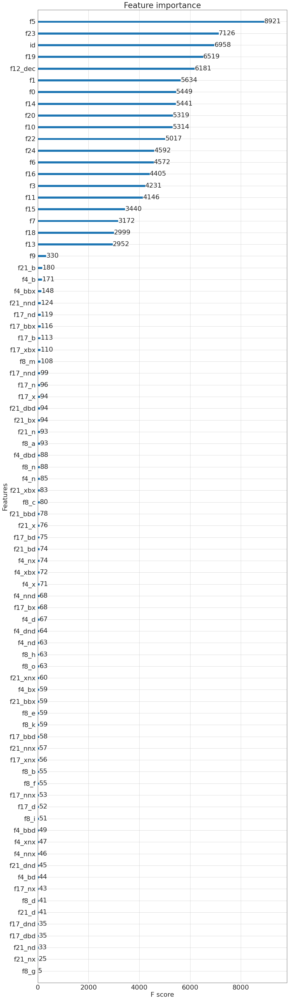

<Figure size 1080x4320 with 0 Axes>

In [260]:
%matplotlib inline
from matplotlib import pyplot
from matplotlib.pylab import rcParams
rcParams.update({'font.size': 22})
rcParams['figure.figsize'] = 15,60

xgb.plot_importance(best_model)
pyplot.show()
pyplot.savefig('feature_importance.png')

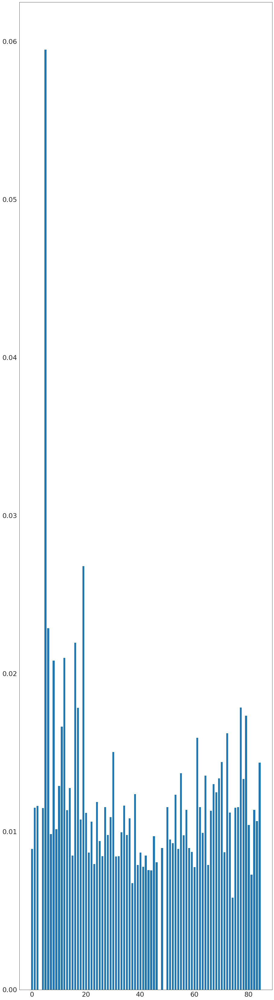

In [261]:
pyplot.bar(range(len(best_model.feature_importances_)), best_model.feature_importances_)
pyplot.show()

# Feature selection


### Drop highly correlated features

I will drop one feature if two features have a correlation above 0.95, or below -0.95

In [262]:
# Create correlation matrix
corr_matrix = X_train.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# Find index of feature columns with correlation greater than 0.95
to_drop = [column for column in upper.columns if any(upper[column] > 0.95)]

In [263]:
to_drop

['f2', 'f16', 'f19']

In [264]:
corr_X_train = X_train.drop(to_drop, axis=1)
corr_X_test = X_test.drop(to_drop, axis=1)

In [265]:
nocorr_model = xgb.XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1.0, gamma=1e-09, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.05, max_delta_step=0, max_depth=50,
              min_child_weight=6, monotone_constraints='()',
              n_estimators=500, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1.0,
              tree_method='exact', validate_parameters=1, verbosity=None)

nocorr_model.fit(corr_X_train, y_train)

auc(nocorr_model, corr_X_train, corr_X_test, y_train, y_test)

(1.0, 0.9284878593844965)

The model did not perform better.

### Drop the least important features

From the bar chart, we see that most features are below 0.01 in feature importance. Let's select the features above this threshold.

In [266]:
least_important = ['f8_j', 'f8_l', 'f8_g', 'f8_i', 'f8_f', 'f17_nx']

In [275]:
least_important = [X_train.columns[i] for i in range(len(X_train.columns)) if best_model.feature_importances_[i] < 0.001]

In [311]:
least_important

['f18',
 'f12_dec',
 'f4_bbd',
 'f4_bx',
 'f4_dbd',
 'f4_dnd',
 'f4_nd',
 'f4_nnd',
 'f4_x',
 'f4_xbx',
 'f4_xnx',
 'f8_b',
 'f8_c',
 'f8_d',
 'f8_e',
 'f8_f',
 'f8_g',
 'f8_i',
 'f8_j',
 'f8_k',
 'f8_l',
 'f8_n',
 'f8_o',
 'f17_bbd',
 'f17_bd',
 'f17_bx',
 'f17_d',
 'f17_dbd',
 'f17_dnd',
 'f17_nx',
 'f17_xnx',
 'f21_d',
 'f21_dnd',
 'f21_nnx',
 'f21_xnx',
 'id']

In [308]:
selected_X_train = X_train.drop(least_important, axis=1)
selected_X_test = X_test.drop(least_important, axis=1)

In [316]:
selection_model = xgb.XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1.0, gamma=1e-09, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.05, max_delta_step=0, max_depth=50,
              min_child_weight=6, monotone_constraints='()',
              n_estimators=500, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1.0,
              tree_method='exact', validate_parameters=1, verbosity=None)

selection_model.fit(selected_X_train, y_train)

auc(selection_model, selected_X_train, selected_X_test, y_train, y_test)

(1.0, 0.9325339344547737)

The model performed slightly better with an auc_roc_score of 0.93253

In [317]:
best_model = selection_model

In [318]:
test_selected = test_transformed.drop(least_important, axis=1)

### Save selected data

In [326]:
selected_X_train.to_csv('data/X_train.csv')
selected_X_test.to_csv('data/X_test.csv')
test_selected.to_csv('data/test.csv')

# Save the best model

In [320]:
best_model.save_model('best_model.json')

# Make predictions

In [321]:
predictions = best_model.predict_proba(test_selected)

In [322]:
id_preds = pd.DataFrame({'sample_id': test['id'].astype(int), 'prediction_in_probability': predictions[:,1]})
id_preds.head(20)

,sample_id,prediction_in_probability
0,50000,0.160751
1,50001,0.000741
2,50002,0.000512
3,50003,0.962810
4,50004,0.000544
5,50005,0.070813
6,50006,0.000344
7,50007,0.088326
8,50008,0.000257
9,50009,0.903031


In [323]:
# Save predictions to file
np.savetxt('predictions.txt', id_preds, fmt=['%d', '%.6f'], delimiter=',', header='sample_id,prediction_in_probability')